# The file is an analysis of the preliminary $\alpha_{\textrm{CE}}$ variation run following the methods in the tutorial from the compas repo.

In [1]:
import os
import sys
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
import h5py as h5
import astropy.units as u
import warnings
import math
import seaborn as sns
import pickle

from matplotlib import rc
from KDEpy import FFTKDE  # Fastest 1D algorithm
from   astropy.cosmology import WMAP9 as cosmology
from scipy import stats
from   scipy.optimize import newton
from scipy.optimize import curve_fit

# Import COMPAS root directory and set data
compasRootDir   = '/Users/adamboesky/Research/PRISE/COMPAS'

# Import COMPAS specific scripts
sys.path.append(compasRootDir + '/utils/CosmicIntegration/')
sys.path.append(os.getcwd() + '/Scripts')
from pickle_writers import pickle_rates_and_boostraps
import ClassCOMPAS, ClassMSSFR, ClassCosmicIntegrator 
import FastCosmicIntegration as FCI 
import selection_effects
import formation_channels

# Magic function to set the backend of matplotlib to the 'inline' backend
%matplotlib inline

#Set latex environment for plots/labels
# plt.rcParams['text.latex.preamble'] = r'\usepackage{sfmath} \boldmath'
plt.rcParams['text.usetex'] = True
# plt.rcParams['font.weight'] = 'bold'
plt.rcParams['font.family'] = 'serif'
# plt.rcParams['axes.labelweight'] = 'bold'
# plt.rcParams['font.sans-serif'] = 'serif'
# plt.rcParams['mathtext.fontset'] = 'stix'

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_692/4086871627.py:46: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


# 1. Create Compas data objects

##  a) Condense the each of the batch's outputs into one h5 file
Function that combines all of the h5 files from each batch. It will write and return the complete h5 file

In [3]:
def condense_h5s(output_dir):

    index = 0 # A useful variable for indexing through the files in the output directory

    # Iterate through the files in the output directory
    for dir in os.listdir(output_dir):
        
        # Make sure that the directories are from the batches
        if dir[0:5] == 'batch':
            batch_num = dir [-1]
            f_h5 = h5.File(output_dir + '/batch_' + batch_num + '/batch_' + batch_num + '.h5', 'r')
            
            # If it's the first batch directory, create an h5 file and copy the first batch's contents into it
            if index == 0:
                # Create an h5 file to put all of the batch's h5 files in
                complete_h5 = h5.File(output_dir + '/complete.h5', 'w')

                # Create and copy the first batch's h5 file into the complete_h5 file
                # DCOs = complete_h5.create_group('BSE_Double_Compact_Objects')
                for group in f_h5.keys():
                    # complete_h5.create_group(group)
                    f_h5.copy(f_h5[group], complete_h5)
                
                DCOs = complete_h5['BSE_Double_Compact_Objects']
                CEs = complete_h5['BSE_Common_Envelopes']
                RLOFs = complete_h5['BSE_RLOF']
                SNs = complete_h5['BSE_Supernovae']
                SPs = complete_h5['BSE_System_Parameters']
                RDs = complete_h5['Run_Details']
                
            # If it's not the first directory, append the new data to each group in the complete h5 file
            else:
                # Append new data to it
                for key in DCOs.keys():
                    DCOs[key].resize((DCOs[key].shape[0] + f_h5['BSE_Double_Compact_Objects'][key].shape[0]), axis=0)
                    DCOs[key][-f_h5['BSE_Double_Compact_Objects'][key].shape[0]:] = f_h5['BSE_Double_Compact_Objects'][key]
                
                for key in CEs.keys():
                    CEs[key].resize((CEs[key].shape[0] + f_h5['BSE_Common_Envelopes'][key].shape[0]), axis=0)
                    CEs[key][-f_h5['BSE_Common_Envelopes'][key].shape[0]:] = f_h5['BSE_Common_Envelopes'][key]
                
                for key in RLOFs.keys():
                    RLOFs[key].resize((RLOFs[key].shape[0] + f_h5['BSE_RLOF'][key].shape[0]), axis=0)
                    RLOFs[key][-f_h5['BSE_RLOF'][key].shape[0]:] = f_h5['BSE_RLOF'][key]
                
                for key in SNs.keys():
                    SNs[key].resize((SNs[key].shape[0] + f_h5['BSE_Supernovae'][key].shape[0]), axis=0)
                    SNs[key][-f_h5['BSE_Supernovae'][key].shape[0]:] = f_h5['BSE_Supernovae'][key]
                
                for key in SPs.keys():
                    SPs[key].resize((SPs[key].shape[0] + f_h5['BSE_System_Parameters'][key].shape[0]), axis=0)
                    SPs[key][-f_h5['BSE_System_Parameters'][key].shape[0]:] = f_h5['BSE_System_Parameters'][key]
                
                for key in RDs.keys():
                    RDs[key].resize((RDs[key].shape[0] + f_h5['Run_Details'][key].shape[0]), axis=0)
                    RDs[key][-f_h5['Run_Details'][key].shape[0]:] = f_h5['Run_Details'][key]

            index+=1 # Update the index
            f_h5.close() # Close the batch file

    complete_h5.close() # Close the complete h5 file
    return output_dir + '/complete.h5'

## b) Condense all .h5 file outputs for the common envelope alpha values

In [5]:
alpha_vals = ['0.1', '0.5', '2.0', '10.0'] # All the alpha values
beta_vals = ['0.25', '0.5', '0.75'] # All the beta values

condensed_paths = {} # 2D dictionary holding the paths to the output h5 files for which the first dimension is the alpha CE value and the second is the beta value

for alpha in alpha_vals:
    condensed_paths[alpha] = {}
    for beta in beta_vals:
        condensed_paths[alpha][beta] = condense_h5s('/Users/adamboesky/Research/PRISE/exploring_parameter_space/Data/2output_alpha_CE_beta_corrected_dists/output_alpha_CE_' + alpha + '_beta_' + beta)

## c) *** To use if the h5 files have already been condensed! ***

In [2]:
alpha_vals = ['0.1', '0.5', '2.0', '10.0'] # All the alpha values
beta_vals = ['0.25', '0.5', '0.75'] # All the beta values

condensed_paths = {} # 2D dictionary holding the paths to the output h5 files for which the first dimension is the alpha CE value and the second is the beta value

for alpha in alpha_vals:
    condensed_paths[alpha] = {}
    for beta in beta_vals:
        condensed_paths[alpha][beta] = '/Users/adamboesky/Research/PRISE/exploring_parameter_space/Data/2output_alpha_CE_beta_corrected_dists/output_alpha_CE_' + alpha + '_beta_' + beta + '/complete.h5'

## d) Create COMPASData objects for each of the $\alpha_{\textrm{CE}}$ and $\beta$ values

In [3]:
# For now, assume all the defaults and just set the paths for each value
data = {} # 2D dictionary in which the first dimension is the alpha CE value and the second is the beta value
counter = 0

for alpha_index, alpha_val in enumerate(alpha_vals):
    data[alpha_val] = {}
    for beta_index, beta_val in enumerate(beta_vals):
        data[alpha_val][beta_val] = ClassCOMPAS.COMPASData(path=condensed_paths[alpha_val][beta_val])
        data[alpha_val][beta_val].Mlower = 5
        data[alpha_val][beta_val].Mupper = 150
        data[alpha_val][beta_val].binaryFraction = 1.0
        data[alpha_val][beta_val].setGridAndMassEvolved()
        data[alpha_val][beta_val].Amin = 0.01
        data[alpha_val][beta_val].Mupper = 1000
        data[alpha_val][beta_val].setCOMPASData()
        # data[alpha_val][beta_val].setCOMPASDCOmask(types='BBH')

    print('Finished ', counter, 'set of beta values')
    counter+=1


ClassCOMPAS: Remember to self.setCOMPASDCOmask()
                    then self.setCOMPASData()
          and optionally self.setGridAndMassEvolved() if using a metallicity grid
ClassCOMPAS: Remember to self.setCOMPASDCOmask()
                    then self.setCOMPASData()
          and optionally self.setGridAndMassEvolved() if using a metallicity grid
ClassCOMPAS: Remember to self.setCOMPASDCOmask()
                    then self.setCOMPASData()
          and optionally self.setGridAndMassEvolved() if using a metallicity grid
Finished  0 set of beta values
ClassCOMPAS: Remember to self.setCOMPASDCOmask()
                    then self.setCOMPASData()
          and optionally self.setGridAndMassEvolved() if using a metallicity grid
ClassCOMPAS: Remember to self.setCOMPASDCOmask()
                    then self.setCOMPASData()
          and optionally self.setGridAndMassEvolved() if using a metallicity grid
ClassCOMPAS: Remember to self.setCOMPASDCOmask()
                    then self.setCO

## c) Check the number of each type of system in the runs

In [64]:
for alpha, beta_dict in data.items():
    for beta, compas_data in beta_dict.items():
        compas_data.setCOMPASDCOmask(types='BBH', pessimistic=True)
        
        #Check if we have any system meeting the criteria
        print('Number of BBH systems at alpha_CE = {alpha} and beta = {beta}'.format(alpha=float(alpha), beta=float(beta)), np.sum(compas_data.DCOmask))

print('')

for alpha, beta_dict in data.items():
    for beta, compas_data in beta_dict.items():
        compas_data.setCOMPASDCOmask(types='BNS', pessimistic=True)
        
        #Check if we have any system meeting the criteria
        print('Number of BNS systems at alpha_CE = {alpha} and beta = {beta}'.format(alpha=float(alpha), beta=float(beta)), np.sum(compas_data.DCOmask))

print('')

for alpha, beta_dict in data.items():
    for beta, compas_data in beta_dict.items():
        compas_data.setCOMPASDCOmask(types='BHNS', pessimistic=True)
        
        #Check if we have any system meeting the criteria
        print('Number of BHNS systems at alpha_CE = {alpha} and beta = {beta}'.format(alpha=float(alpha), beta=float(beta)), np.sum(compas_data.DCOmask))

Number of BBH systems at alpha_CE = 0.1 and beta = 0.25 24553
Number of BBH systems at alpha_CE = 0.1 and beta = 0.5 36404
Number of BBH systems at alpha_CE = 0.1 and beta = 0.75 62298
Number of BBH systems at alpha_CE = 0.5 and beta = 0.25 73357
Number of BBH systems at alpha_CE = 0.5 and beta = 0.5 74703
Number of BBH systems at alpha_CE = 0.5 and beta = 0.75 84529
Number of BBH systems at alpha_CE = 2.0 and beta = 0.25 122246
Number of BBH systems at alpha_CE = 2.0 and beta = 0.5 94594
Number of BBH systems at alpha_CE = 2.0 and beta = 0.75 91322
Number of BBH systems at alpha_CE = 10.0 and beta = 0.25 57559
Number of BBH systems at alpha_CE = 10.0 and beta = 0.5 64459
Number of BBH systems at alpha_CE = 10.0 and beta = 0.75 90956

Number of BNS systems at alpha_CE = 0.1 and beta = 0.25 177
Number of BNS systems at alpha_CE = 0.1 and beta = 0.5 337
Number of BNS systems at alpha_CE = 0.1 and beta = 0.75 495
Number of BNS systems at alpha_CE = 0.5 and beta = 0.25 61
Number of BNS sys

# 3. Plot formation rate as a function of metallicity

## a) BBH

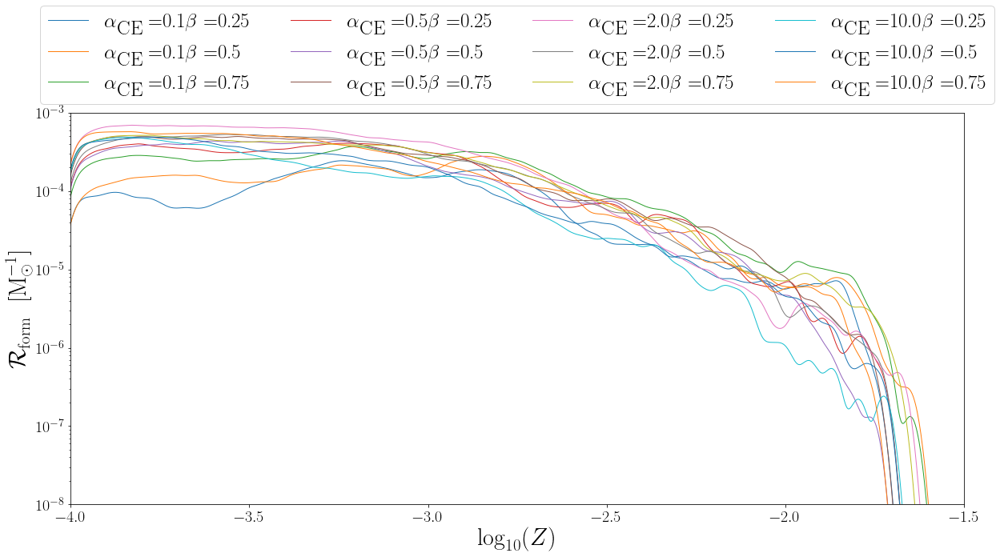

In [14]:
def plot_formation_rate_per_Z(data, alpha_vals, beta_vals, dco_type, Mlower=5, Mupper=150, binaryFraction=1.0, Amin=0.01, Amax=1000, withinHubbleTime=True, PESSIMISTIC=False, bw='silverman'):
    """
    This function plots the formation rate as a function of Z for the given data and DCO type. It will iterate over given
    alpha and beta values and plot the formation rates of their runs' results.

    ...

    Parameters
    ----------
    data : dict
        a two-dimensional dictionary containing the corresponding compas objects for each of the alpha/beta values

    alpha_vals : list
        a one dimensional list containing the alpha_CE values corresponding to the keys of the data dictionary
    
    beta_vals: list 
        a one dimensional list containing the beta values corresponding to the keys of the data dictionary's first dimension

    dco_type: str
        one of 'all', 'BBH', 'BHNS', or 'BNS'; the DCO type that we wish to look at.

    bw: float
        the bandwidth for the KDE that will be calculated for the plot

    Mlower: float
        the lower bound for the mass distribution in the data simulations

    Mupper: float
        the upper bound for the mass distribution in the data simulations

    binaryFraction: float
        the assumed binary fraction
    
    Amin: float
        the lower bound for the initial separation distribution in the data simulations

    Amax: float
        the upper bound for the initial separation distribution in the data simulations
    
    withinHubbleTime: bool
        whether or not the data should be filtered for only dcos that merge within hubble time

    PESSIMISTIC: bool
        whether or not we should filter our DCOs that have formed through a CE event involving a Hertzsprung-gap donor
    
    bw: str/float
        the bandwidth for the KDE; if not float, can be the automatic bandwidth 'silverman'
    """

    # Declare figure and figure size
    plt.figure(figsize=(20, 9))
    plt.yscale('log')
    fs = 20

    # Iterate over the 2D dictionary and plot the formation rate as a function of Z for each of the alpha_CE-beta combinations
    for alpha_val in alpha_vals:
        for beta_val in beta_vals:
            
            # Get the current compas object
            model_data = data[alpha_val][beta_val]

            # Define the parameters
            model_data.setCOMPASDCOmask(types=dco_type, withinHubbleTime=withinHubbleTime, pessimistic=PESSIMISTIC)
            model_data.Mlower = Mlower
            model_data.Mupper = Mupper
            model_data.binaryFraction = binaryFraction
            model_data.Amin = Amin
            model_data.Amax = Amax

            # Set the data
            model_data.setGridAndMassEvolved()            
            model_data.setCOMPASData()

            # Get the metallicities of the systems and declare an empty formationRate array
            metallicities = model_data.metallicitySystems
            log10metallicities = np.log10(metallicities)

            # Get the total mass evolved in the universe
            model_data_MPZ = model_data.totalMassEvolvedPerZ

            # Calculate a KDE of the metallicity distribution
            kde_grid, num_kde = FFTKDE(bw=bw).fit(log10metallicities).evaluate()

            # Calculate the formation rate as a function of metallicity = dN_form/dM_SFR (Z)
            formation_rate = num_kde *   (   len(log10metallicities) / np.sum(model_data_MPZ)   )

            # Label axes
            plt.xlabel(r'$\log_{10}(Z)$', fontsize=fs+10)
            plt.ylabel(r'$\mathcal{R}_{\rm{form}}  \ \  [\rm{M}_{\odot}^{-1}]$', fontsize=fs+10)
            
            # Bound axes
            plt.xlim([-4, -1.5])
            plt.ylim([10**(-8), 10**(-3)])

            # Adjust tick size
            plt.xticks(fontsize=fs)
            plt.yticks(fontsize=fs)

            # Plot the formation rate
            plt.plot(kde_grid, formation_rate, label=r'$\alpha_{\textrm{CE}} = $' + alpha_val + r'$\beta = $' + beta_val, lw=1)

    # Include legend
    plt.legend(fontsize=fs+5, ncol=4, bbox_to_anchor=(0.5, 1.35), loc='upper center',  markerscale=25) 

    # Show the plot!
    plt.show()

# Plot formation rate all dcos
plot_formation_rate_per_Z(data, alpha_vals, beta_vals, dco_type='BBH', bw=0.02)

## b) BHNS

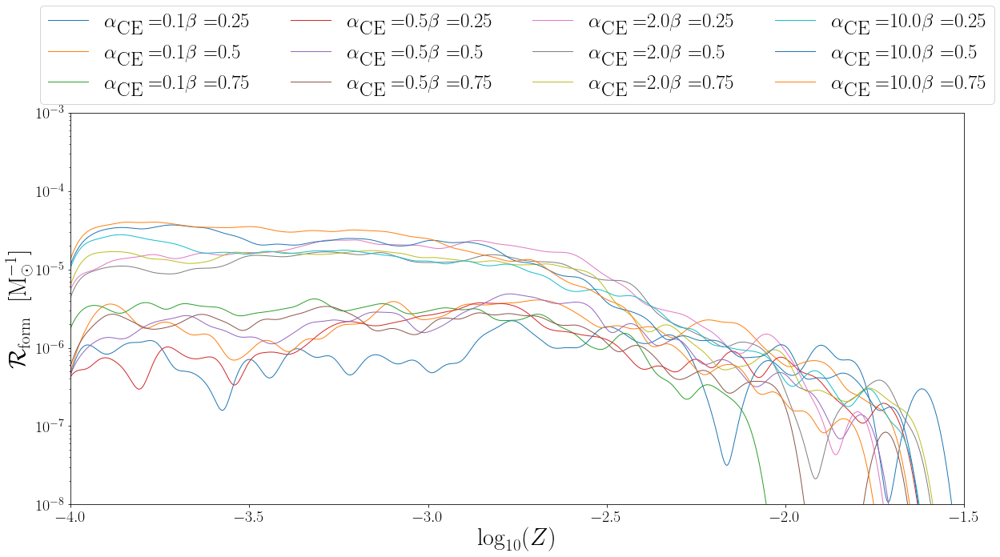

In [17]:
plot_formation_rate_per_Z(data, alpha_vals, beta_vals, dco_type='BHNS', bw=0.03)

## c) BNS

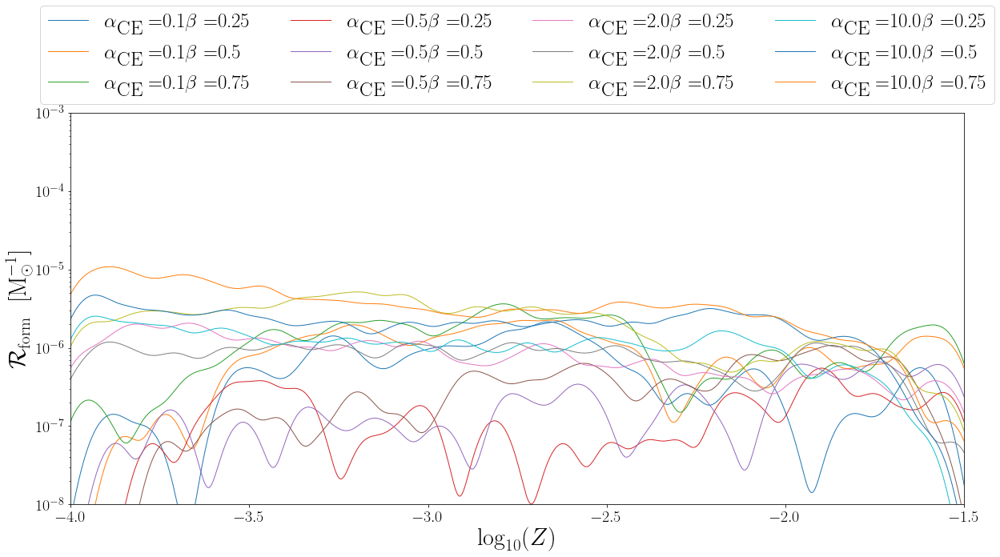

In [18]:
plot_formation_rate_per_Z(data, alpha_vals, beta_vals, dco_type='BNS', bw=0.04)

## d) Panel plot with BBH, BHNS, and BNS

Plotting panel for DCO type  BBH
Plotting panel for DCO type  BHNS
Plotting panel for DCO type  BNS


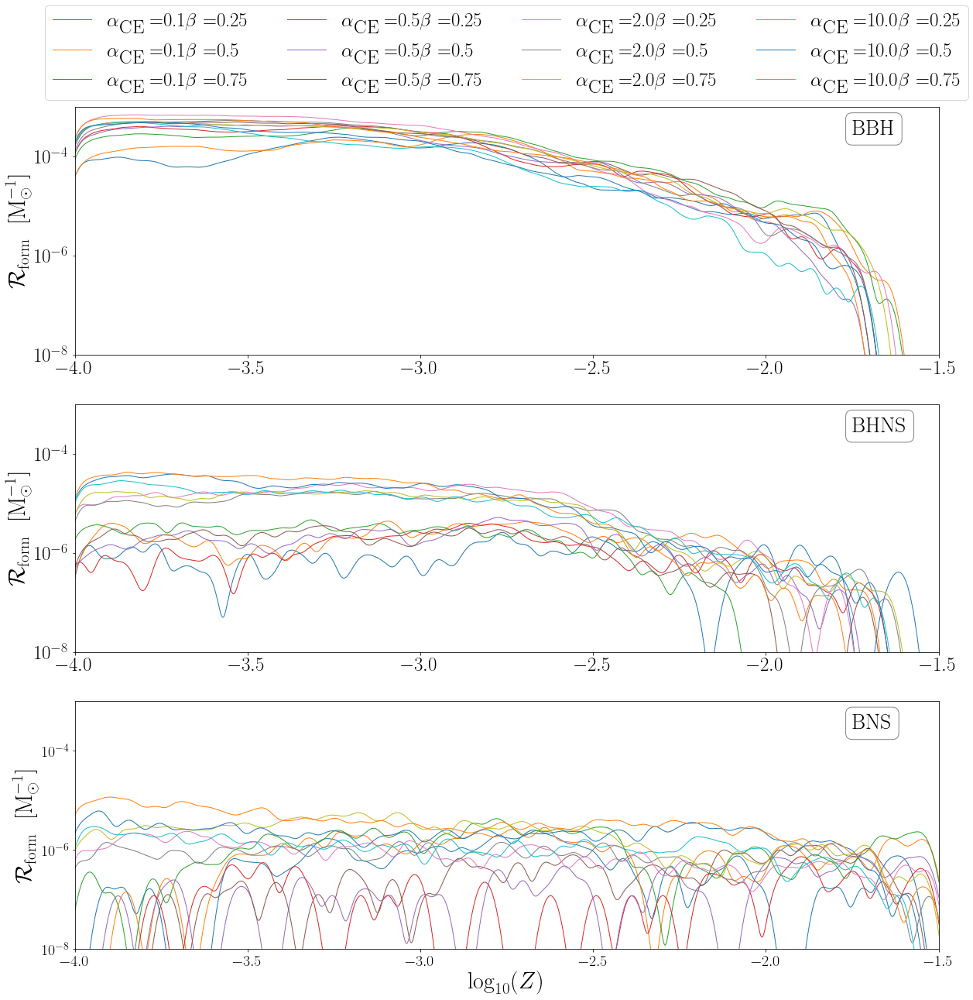

In [25]:
def plot_formation_rate_per_Z_all(data, alpha_vals, beta_vals, Mlower=5, Mupper=150, binaryFraction=1.0, Amin=0.01, Amax=1000, withinHubbleTime=True, PESSIMISTIC=False, bw='silverman'):
    """
    This function plots the formation rate as a function of Z for the given data and DCO type. It will iterate over given
    alpha and beta values and plot the formation rates of their runs' results.

    ...

    Parameters
    ----------
    data : dict
        a two-dimensional dictionary containing the corresponding compas objects for each of the alpha/beta values

    alpha_vals : list
        a one dimensional list containing the alpha_CE values corresponding to the keys of the data dictionary
    
    beta_vals: list 
        a one dimensional list containing the beta values corresponding to the keys of the data dictionary's first dimension
    
    bw: float
        the bandwidth for the KDE that will be calculated for the plot

    Mlower: float
        the lower bound for the mass distribution in the data simulations

    Mupper: float
        the upper bound for the mass distribution in the data simulations

    binaryFraction: float
        the assumed binary fraction
    
    Amin: float
        the lower bound for the initial separation distribution in the data simulations

    Amax: float
        the upper bound for the initial separation distribution in the data simulations
    
    withinHubbleTime: bool
        whether or not the data should be filtered for only dcos that merge within hubble time

    PESSIMISTIC: bool
        whether or not we should filter our DCOs that have formed through a CE event involving a Hertzsprung-gap donor
    
    bw: str/float
        the bandwidth for the KDE; if not float, can be the automatic bandwidth 'silverman'
    """

    # Declare figure
    fig, axes = plt.subplots(ncols=1, nrows=3, figsize=(20,20), 
                    gridspec_kw={"width_ratios":1*np.ones(1), "height_ratios":1*np.ones(3)})  
    fs = 20
    
    # DCO types
    dco_types = ['BBH', 'BHNS', 'BNS']

    # Adjust tick size
    plt.rc('xtick', labelsize=25) 
    plt.rc('ytick', labelsize=25)

    # Make everything bold
    plt.rcParams["font.weight"] = "bold"
    plt.rcParams["axes.labelweight"] = "bold"

    # Iterate over the dco types and make a mass per Z plot for each type
    for dco_index, dco_type in enumerate(dco_types):

        print('Plotting panel for DCO type ', dco_type)

        # Get axis for DCO type
        ax = axes[dco_index]
        ax.set_yscale('log')

        # add box with label to indicate which DCO type we are plotting in the top right of each panel   
        bbox_props = dict(boxstyle="round", fc="w", ec="0.5", alpha=0.95)
        ax.annotate(r'%s'%(dco_type), xy=(0.90, 0.95), xycoords='axes fraction', fontsize = 28, weight = 'bold', ha='left', va="top",bbox=bbox_props)

        # Iterate over the 2D dictionary and plot the formation rate as a function of Z for each of the alpha_CE-beta combinations
        for alpha_val in alpha_vals:
            for beta_val in beta_vals:
                
                # Get the current compas object
                model_data = data[alpha_val][beta_val]

                # Define the parameters
                model_data.setCOMPASDCOmask(types=dco_type, withinHubbleTime=withinHubbleTime, pessimistic=PESSIMISTIC)
                model_data.Mlower = Mlower
                model_data.Mupper = Mupper
                model_data.binaryFraction = binaryFraction
                model_data.Amin = Amin
                model_data.Amax = Amax

                # Set the data
                model_data.setGridAndMassEvolved()            
                model_data.setCOMPASData()

                # Get the metallicities of the systems and declare an empty formationRate array
                metallicities = model_data.metallicitySystems
                log10metallicities = np.log10(metallicities)

                # Get the total mass evolved in the universe
                model_data_MPZ = model_data.totalMassEvolvedPerZ

                # Calculate a KDE of the metallicity distribution
                kde_grid, num_kde = FFTKDE(bw=bw).fit(log10metallicities).evaluate()

                # Calculate the formation rate as a function of metallicity = dN_form/dM_SFR (Z)
                formation_rate = num_kde *   (   len(log10metallicities) / np.sum(model_data_MPZ)   )
                
                # Label y axes
                ax.set_ylabel(r'$\mathcal{R}_{\rm{form}}  \ \  [\rm{M}_{\odot}^{-1}]$', fontsize=fs+10)
                
                # Bound axes
                ax.set_xlim([-4, -1.5])
                ax.set_ylim([10**(-8), 10**(-3)])

                # Plot the formation rate
                if dco_type == 'BBH':
                    ax.plot(kde_grid, formation_rate, label=r'$\alpha_{\textrm{CE}} = $' + alpha_val + r'$\beta = $' + beta_val, lw=1)
                else:
                    ax.plot(kde_grid, formation_rate, lw=1)
        
        # Include legend
        if dco_type == 'BBH':
            ax.legend(fontsize=fs+5, ncol=4, bbox_to_anchor=(0.5, 1.45), loc='upper center',  markerscale=25) 

    # Adjust tick size
    plt.xticks(fontsize=fs)
    plt.yticks(fontsize=fs)

    # Label x axis
    plt.xlabel(r'$\log_{10}(Z)$', fontsize=fs+10) 
    
    # Display the plot
    plt.show()

# Plot formation rate all dcos
plot_formation_rate_per_Z_all(data, alpha_vals, beta_vals, bw=0.02)

# 4. Get the detection rates

### Declare important parameters for the detection rate calculation

In [3]:
# First define the parameters

# For what DCO would you like the rate?  options: all, BBH, BHNS BNS
weight_column   = None
                        
merges_hubble_time     = True
pessimistic_CEE        = True
no_RLOF_after_CEE      = True

# Options for the redshift evolution 
max_redshift           = 10.0
max_redshift_detection = 2.0
redshift_step          = 0.001
z_first_SF             = 10

# Metallicity of the Universe
min_logZ               = -12.0 
max_logZ               = 1.0 
step_logZ              = 0.01

#and detector sensitivity
sensitivity            = "O1" 
snr_threshold          = 8 

Mc_max                 = 300.0 * (1 + max_redshift_detection)
Mc_step                = 0.1 
eta_max                = 0.25 
eta_step               = 0.01
snr_max                = 1000.0 
snr_step               = 0.1

# Parameters to calculate the representing SF mass (make sure these match YOUR simulation!)
m1_min          = 5 * u.Msun 
m1_max          = 150 * u.Msun
m2_min          = m1_min * 0.01 # m2_min = min(q) * min(m1)
fbin            = 1.0

# Parameters determining dP/dZ and SFR(z), default options from Neijssel 2019
# aSF             = 0.01 
# bSF             = 2.77 
# cSF             = 2.90 
# dSF             = 4.70

# # Parameter perscriptions from N. Lang & C.A. Norman 2006
# mu0             = 0.0142
# muz             = -0.15
# sigma0          = 0.39
# sigmaz          = 0. 
# alpha           = 0.0

rainbow_cmap = matplotlib.cm.get_cmap('rainbow')
num_colors = len(alpha_vals)*len(beta_vals)
counter = 0
color_grid = {}
for alphva_index, alpha_val in enumerate(alpha_vals):
    color_grid[alpha_val] = {}
    for beta_index, beta_val in enumerate(beta_vals):
        color_grid[alpha_val][beta_val] = rainbow_cmap(counter/num_colors)
        counter+=1

# Van Son 2022 prescriptions:
mu0             = 0.025
muz             = -0.048
sigma0          = 1.125
sigmaz          = 0.048
alpha           = -1.77

aSF             = 0.02
bSF             = 1.48 
cSF             = 4.45 
dSF             = 5.9

# MY FIDUCIAL MSSFR PRESCRIPTIONS
lognormal=False                                     # !!! IF THIS PARAMETER IS FALSE, IT WILL USE THE NON-LOGNORMAL MSSFR PRESCRIPTIONS !!!
Zprescription='MZ_GSMF'
SFRprescription='Madau et al. (2017)'
GSMFprescription='Panter et al. (2004) Single'
ZMprescription='Ma et al. (2016)'
logNormalPrescription=None

## a) BNS

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79044577.79914157 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79554143.45679924 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79310513.19634093 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79196432.21565475 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79029699.37656946 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-pa

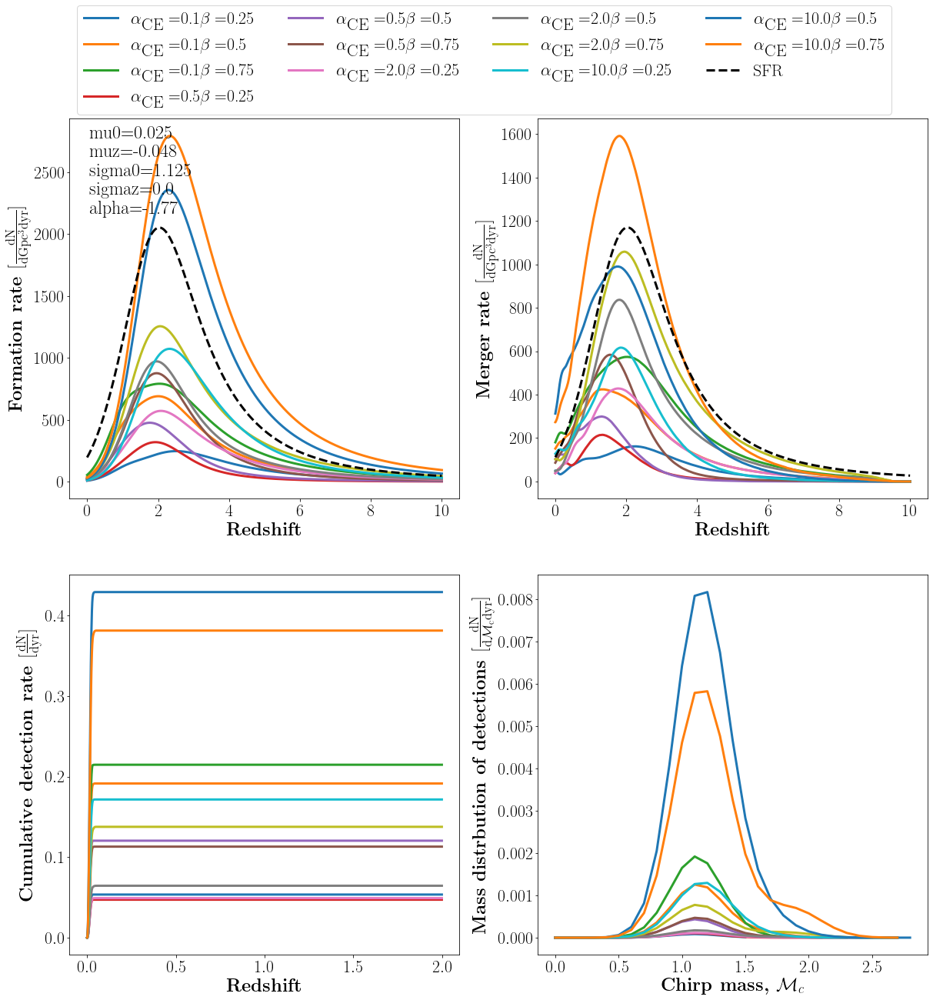

In [5]:
def plot_rates(condensed_paths, alpha_vals, beta_vals, dco_type=None, merger_output_filename=None, weight_column=None,
        merges_hubble_time=True, pessimistic_CEE=True, no_RLOF_after_CEE=True,
        max_redshift=10.0, max_redshift_detection=1.0, redshift_step=0.001, z_first_SF = 10,
        use_sampled_mass_ranges=True, m1_min=5 * u.Msun, m1_max=150 * u.Msun, m2_min=0.1 * u.Msun, fbin=1.0,
        aSF = 0.01, bSF = 2.77, cSF = 2.90, dSF = 4.70,
        mu0=0.035, muz=-0.23, sigma0=0.39,sigmaz=0., alpha=0.0, 
        min_logZ=-12.0, max_logZ=1.0, step_logZ=0.01,
        sensitivity="O1", snr_threshold=8, 
        Mc_max=300.0, Mc_step=0.1, eta_max=0.25, eta_step=0.01,
        snr_max=1000.0, snr_step=0.1, lw=3, fs = 24, 
        lognormal=False, Zprescription='MZ_GSMF', SFRprescription='Madau et al. (2017)',        # ADAM'S FIDUCIAL MSSFR PARAMETERS
        GSMFprescription='Panter et al. (2004) Single', ZMprescription='Ma et al. (2016)',      # ADAM'S FIDUCIAL MSSFR PARAMETERS
        logNormalPrescription=None):                                                            # ADAM'S FIDUCIAL MSSFR PARAMETERS
        
        assert dco_type != None, 'dco_type must be given'

        total_formation_rates = {}
        total_merger_rates = {}
        total_detection_rates = {}
        cumulative_detection_rates = {}
        detection_rates_by_binary = {}
        chirp_masses = {}

        redshifts = {}

        for alpha_index, alpha_val in enumerate(alpha_vals):
                # Make the dictionary "2D"
                total_formation_rates[alpha_val] = {}
                total_merger_rates[alpha_val] = {}
                total_detection_rates[alpha_val] = {}
                cumulative_detection_rates[alpha_val] = {}
                detection_rates_by_binary[alpha_val] = {}
                chirp_masses[alpha_val] = {}

                redshifts[alpha_val] = {}

                for beta_index, beta_val in enumerate(beta_vals):
                        detection_rates, formation_rates, merger_rates, redshifts[alpha_val][beta_val], COMPASs = \
                        FCI.find_detection_rate(
                        condensed_paths[alpha_val][beta_val], dco_type=dco_type, weight_column=weight_column,
                        merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
                        no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
                        max_redshift_detection=max_redshift_detection,
                        redshift_step=redshift_step, z_first_SF=z_first_SF,
                        m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
                        fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
                        mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
                        min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
                        sensitivity=sensitivity, snr_threshold=snr_threshold,
                        Mc_max=Mc_max, Mc_step=Mc_step,
                        eta_max=eta_max, eta_step=eta_step,
                        snr_max=snr_max, snr_step=snr_step, 
                        lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
                        GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
                        logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

                        chirp_masses[alpha_val][beta_val] = (COMPASs.mass1*COMPASs.mass2)**(3./5.) / (COMPASs.mass1 + COMPASs.mass2)**(1./5.)

                        # sum things up across binaries
                        total_formation_rates[alpha_val][beta_val] = np.sum(formation_rates, axis=0)
                        total_merger_rates[alpha_val][beta_val] = np.sum(merger_rates, axis=0)
                        total_detection_rates[alpha_val][beta_val] = np.sum(detection_rates, axis=0)

                        # and across redshifts
                        cumulative_detection_rates[alpha_val][beta_val] = np.cumsum(total_detection_rates[alpha_val][beta_val])
                        detection_rates_by_binary[alpha_val][beta_val] = np.sum(detection_rates, axis=1)

                        # empty trash
                        del detection_rates
                        del formation_rates
                        del merger_rates
                        del COMPASs

        ###########################
        #Start plotting
        fig, axes = plt.subplots(2, 2, figsize=(20, 20))


        for alpha_val in alpha_vals:
                for beta_val in beta_vals:
                        Mc_bins = np.arange(0,max(chirp_masses[alpha_val][beta_val])*1.3, max(chirp_masses[alpha_val][beta_val])*1.2/100)

                        axes[0,0].plot(redshifts[alpha_val][beta_val], total_formation_rates[alpha_val][beta_val], lw=lw)
                        
                        axes[0,1].plot(redshifts[alpha_val][beta_val], total_merger_rates[alpha_val][beta_val], lw=lw, label=r'$\alpha_{\textrm{CE}} = $' + alpha_val + r'$\beta = $' + beta_val)
                        
                        axes[1,0].plot(redshifts[alpha_val][beta_val][:len(cumulative_detection_rates[alpha_val][beta_val])], cumulative_detection_rates[alpha_val][beta_val], lw=lw)

                        # Get the Hist
                        hist, _ = np.histogram(chirp_masses[alpha_val][beta_val], weights = detection_rates_by_binary[alpha_val][beta_val], bins=Mc_bins)
                        
                        # Calculate KDE
                        axis = np.arange(Mc_bins[0],Mc_bins[-1],0.1) # The x-axis for the chirp masses
                        # Get the KDE
                        mass_kde = FFTKDE(bw=0.2).fit(chirp_masses[alpha_val][beta_val], weights=detection_rates_by_binary[alpha_val][beta_val]).evaluate(axis)
                        # Normalize the KDE
                        mass_kde_scaled = mass_kde*sum(hist)*sum(hist)*np.diff(Mc_bins)[0] 
                        axes[1,1].plot(axis, mass_kde_scaled, lw=lw)
        
        # Label axes of all the plots
        axes[0,0].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
        axes[0,0].set_ylabel(r'\textbf{Formation rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$}', fontsize=fs)

        axes[0,1].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
        axes[0,1].set_ylabel(r'\textbf{Merger rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$}', fontsize=fs)

        axes[1,0].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
        axes[1,0].set_ylabel(r'\textbf{Cumulative detection rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}yr}]$}', fontsize=fs)

        axes[1,1].set_xlabel(r'\textbf{Chirp mass, $\mathcal{M}_c$}', fontsize=fs)
        axes[1,1].set_ylabel(r'\textbf{Mass distrbution of detections $[\rm \frac{\mathrm{d}N}{\mathrm{d}\mathcal{M}_c \mathrm{d}yr}]$}', fontsize=fs)

        # Set upper limit on x axis for chirp mass distribution
        xlims = axes[1,1].get_xlim()
        if xlims[1] >= 40:
                axes[1,1].set_xlim([xlims[0], 40])

        # Add text upper left corner
        if lognormal==False:
                axes[0,0].text(0.05,0.75, 
                        "mu0={} \nmuz={} \nsigma0={} \nsigmaz={} \nalpha={}".format(mu0,muz,sigma0,sigmaz,alpha), 
                        transform=axes[0,0].transAxes, size = fs) 

        for ax in axes.flatten():
                ax.tick_params(labelsize=0.9*fs)

        # Retreive the SFR
        MSSFR = ClassMSSFR.MSSFR()                                                      # Create an MSSFR object
        MSSFR.SFRprescription = SFRprescription                                         # Set SFR prescription
        ages = MSSFR.cosmology.age(redshifts[alpha_val][beta_val]).value                # Get the ages
        sfr = MSSFR.returnSFR(redshifts[alpha_val][beta_val], ages)                     # Get the SFR
        sfr = sfr/max(sfr)                                                              # Get peak to 1
        
        # Get constants for scaling SFR
        form_const, merger_const = axes[0,0].get_ylim()[1] * 0.7, axes[0,1].get_ylim()[1] * 0.7

        # Plot SFRs
        axes[0,0].plot(redshifts[alpha_val][beta_val], sfr * form_const, color='black', lw=lw, linestyle='dashed')
        axes[0,1].plot(redshifts[alpha_val][beta_val], sfr * merger_const, color='black', lw=lw, linestyle='dashed', label=r'SFR')

        # Include legend
        fig.legend(fontsize=22, ncol=4, bbox_to_anchor=(0.875, .99),  markerscale=25) 

        # Show the plot!
        plt.show()

plot_rates(condensed_paths, alpha_vals, beta_vals, dco_type='BNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

## b) BHNS

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79081516.44950314 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79216102.78951629 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79342606.86368705 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79248380.46400882 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79290250.17943563 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-pa

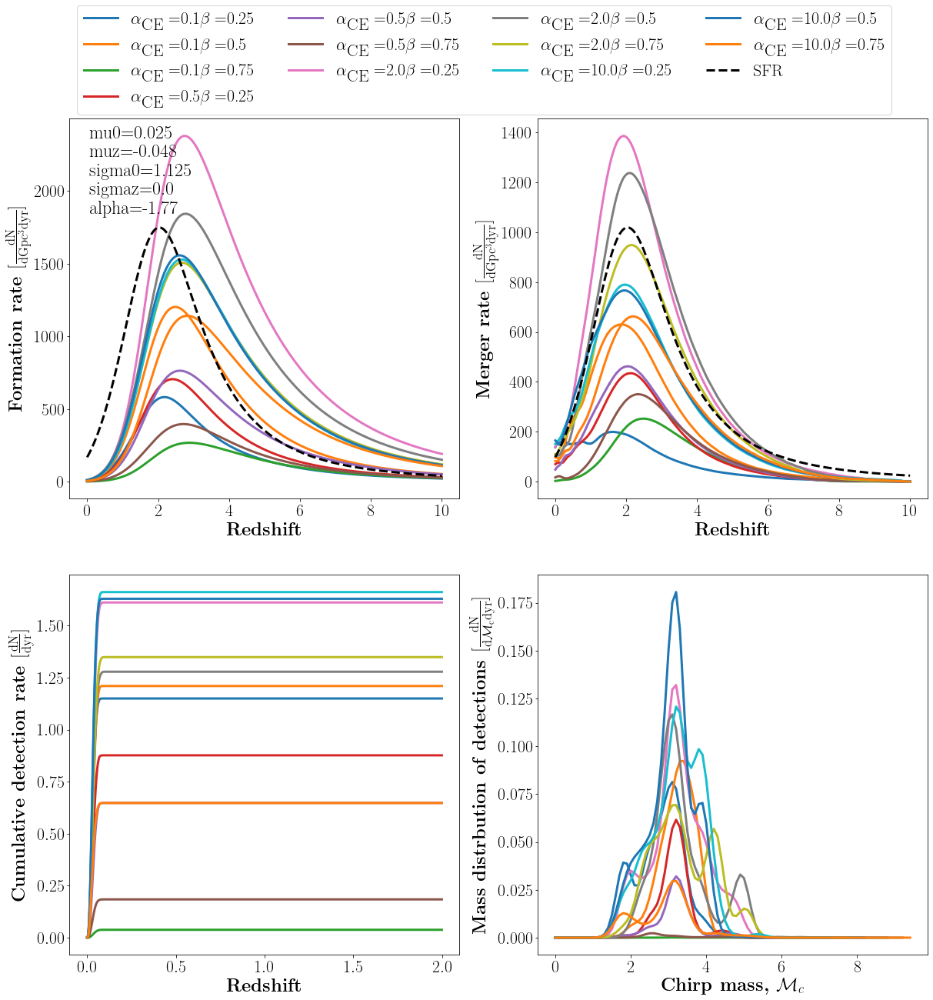

In [8]:
plot_rates(condensed_paths, alpha_vals, beta_vals, dco_type='BHNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS)

## c) BBH

/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_27622/2027667476.py:39: UserWarning: Maximum chirp mass used for detectability calculation is below maximum binary chirp mass * (1+maximum redshift for detectability calculation)
  FCI.find_detection_rate(


ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79289471.36229606 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79295468.87382227 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78981922.095974 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79298397.65911365 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79223494.70808393 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-part

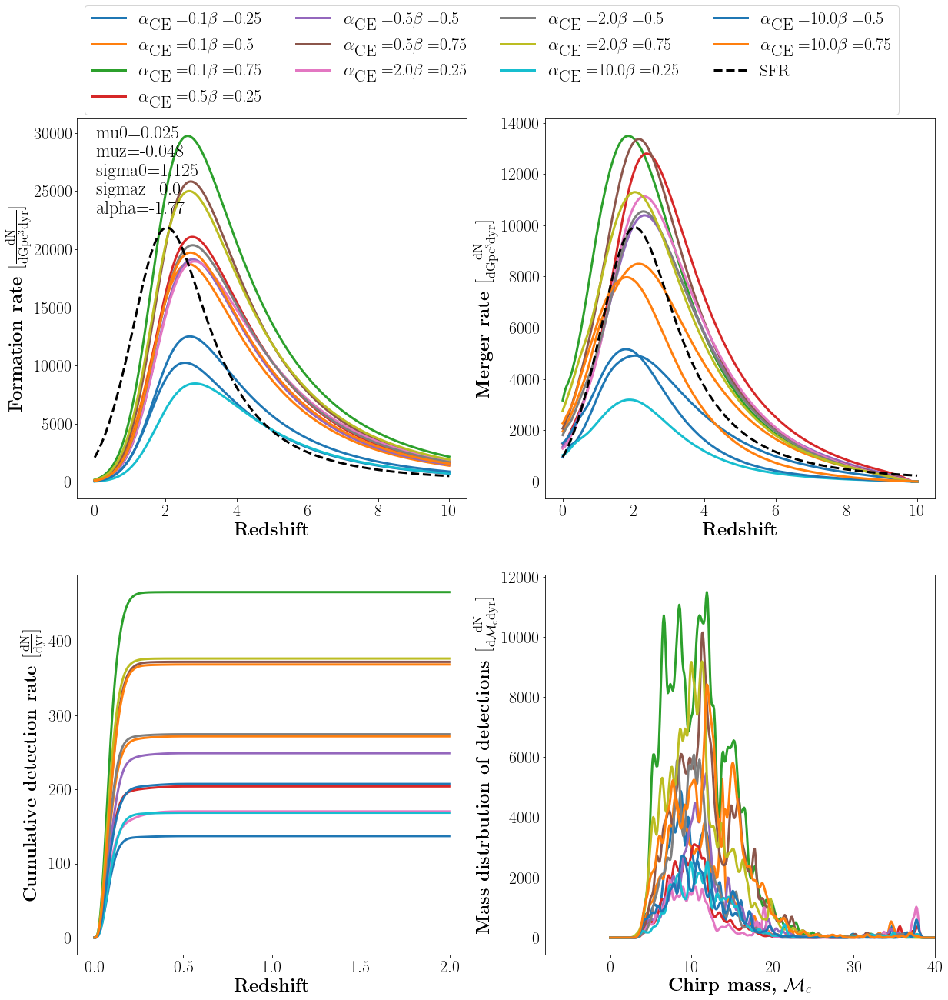

In [9]:
plot_rates(condensed_paths, alpha_vals, beta_vals, dco_type='BBH', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS)

# Plot Rates for grid of MSSFR models

## a) BNS

In [5]:
# FIRST, DEFINE THE PARAMETERS

# For what DCO would you like the rate?  options: all, BBH, BHNS BNS
dco_type        = "BNS"
weight_column   = None
                        
merges_hubble_time     = True
pessimistic_CEE        = True
no_RLOF_after_CEE      = True

# Options for the redshift evolution 
max_redshift           = 10.0
max_redshift_detection = 2.0
redshift_step          = 0.001
z_first_SF             = 10

# Metallicity of the Universe
min_logZ               = -12.0 
max_logZ               = 1.0 
step_logZ              = 0.01

#and detector sensitivity
sensitivity            = "O1" 
snr_threshold          = 8 

Mc_max                 = 300.0 
Mc_step                = 0.1 
eta_max                = 0.25 
eta_step               = 0.01
snr_max                = 1000.0 
snr_step               = 0.1

# Parameters to calculate the representing SF mass (make sure these match YOUR simulation!)
m1_min          = 5 * u.Msun 
m1_max          = 150 * u.Msun
m2_min          = m1_min * 0.01 # m2_min = min(q) * min(m1)
fbin            = 1.0

# Parameters determining dP/dZ and SFR(z), default options from Neijssel 2019
aSF             = 0.01 
bSF             = 2.77 
cSF             = 2.90 
dSF             = 4.70

# Parameter prescriptions from N. Lang & C.A. Norman 2006
mu0             = 0.0142
muz             = -0.15
sigma0          = 0.39
sigmaz          = 0. 
alpha           = 0.0

# Fiducial prescriptions
lognormal=False
Zprescription='MZ_GSMF'
SFRprescription='Madau et al. (2017)'
GSMFprescription='Panter et al. (2004) Single'
ZMprescription='Ma et al. (2016)'
logNormalPrescription=None,

# SFRD, GSMF, and MZR prescriptions (this is in the format of the table that the paper will have)
SFRDs   = {1: 'Madau et al. (2017)',            2: 'Madau et al. (2014)',               3: 'Strolger et al. (2004)'}
GSMFs   = {1: 'Panter et al. (2004) Single',    2: 'Furlong et al. (2015) Single',      3: 'Furlong et al. (2015) Double'}
MZRs    = {1: 'Ma et al. (2016)',               2: 'Langer et al. (2006)',              3: 'Langer et al. +offset (2006)'}


def plot_rates_mssfr(condensed_paths, alpha_val, beta_val, SFRDs, GSMFs, MZRs, dco_type=None, merger_output_filename=None, weight_column=None,
        merges_hubble_time=True, pessimistic_CEE=True, no_RLOF_after_CEE=True,
        max_redshift=10.0, max_redshift_detection=1.0, redshift_step=0.001, z_first_SF = 10,
        use_sampled_mass_ranges=True, m1_min=5 * u.Msun, m1_max=150 * u.Msun, m2_min=0.1 * u.Msun, fbin=1.0,
        aSF = 0.01, bSF = 2.77, cSF = 2.90, dSF = 4.70,
        mu0=0.035, muz=-0.23, sigma0=0.39,sigmaz=0., alpha=0.0, 
        min_logZ=-12.0, max_logZ=1.0, step_logZ=0.01,
        sensitivity="O1", snr_threshold=8, 
        Mc_max=300.0, Mc_step=0.1, eta_max=0.25, eta_step=0.01,
        snr_max=1000.0, snr_step=0.1):
        
        assert dco_type != None, 'dco_type must be given'

        total_formation_rates = {}
        total_merger_rates = {}
        total_detection_rates = {}
        cumulative_detection_rates = {}
        detection_rates_by_binary = {}
        chirp_masses = {}
        redshifts = {}
        
        for SFRD_num, SFRD_name in SFRDs.items():
                for GSMF_num, GSMF_name in GSMFs.items():
                        for MZR_num, MZR_name in MZRs.items():
                                
                                # The prescription, labeled by a list representing (X, Y, Z)
                                S_prescription = (SFRD_num, GSMF_num, MZR_num)

                                # Calculate!
                                detection_rates, formation_rates, merger_rates, redshifts[S_prescription], COMPASs = \
                                FCI.find_detection_rate(
                                condensed_paths[alpha_val][beta_val], dco_type=dco_type, weight_column=weight_column,
                                merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
                                no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
                                max_redshift_detection=max_redshift_detection,
                                redshift_step=redshift_step, z_first_SF=z_first_SF,
                                m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
                                fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
                                mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
                                min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
                                sensitivity=sensitivity, snr_threshold=snr_threshold,
                                Mc_max=Mc_max, Mc_step=Mc_step,
                                eta_max=eta_max, eta_step=eta_step,
                                snr_max=snr_max, snr_step=snr_step, 
                                lognormal=False, Zprescription='MZ_GSMF',                       # PASS ON EACH MSSFR MODEL
                                SFRprescription=SFRD_name, GSMFprescription=GSMF_name,          # PASS ON EACH MSSFR MODEL
                                ZMprescription=MZR_name, logNormalPrescription=None)           # PASS ON EACH MSSFR MODEL

                                # Get the chirp masses
                                chirp_masses[S_prescription] = (COMPASs.mass1*COMPASs.mass2)**(3./5.) / (COMPASs.mass1 + COMPASs.mass2)**(1./5.)

                                # sum things up across binaries
                                total_formation_rates[S_prescription] = np.sum(formation_rates, axis=0)
                                total_merger_rates[S_prescription] = np.sum(merger_rates, axis=0)
                                total_detection_rates[S_prescription] = np.sum(detection_rates, axis=0)

                                # and across redshifts
                                cumulative_detection_rates[S_prescription] = np.cumsum(total_detection_rates[S_prescription])
                                detection_rates_by_binary[S_prescription] = np.sum(detection_rates, axis=1)

                                # empty trash
                                del detection_rates
                                del formation_rates
                                del merger_rates
                                del COMPASs

        

        ###########################
        #Start plotting

        # set some constants for the plots
        plt.rc('font', family='serif')
        fs = 20
        lw = 3
        fig, axes = plt.subplots(2, 2, figsize=(20, 20))

        for SFRD_num, SFRD_name in SFRDs.items():
                for GSMF_num, GSMF_name in GSMFs.items():
                        for MZR_num, MZR_name in MZRs.items():

                                # The prescription for the current iteration
                                S_prescription = (SFRD_num, GSMF_num, MZR_num)
                        
                                axes[0,0].plot(redshifts[S_prescription], total_formation_rates[S_prescription], lw=lw)
                                
                                axes[0,1].plot(redshifts[S_prescription], total_merger_rates[S_prescription], lw=lw, label='XYZ: ' + str(SFRD_num) + str(GSMF_num) + str(MZR_num))
                                
                                axes[1,0].plot(redshifts[S_prescription][:len(cumulative_detection_rates[S_prescription])], cumulative_detection_rates[S_prescription], lw=lw)
                                
                                # Get the Hist
                                bins = np.arange(0,max(chirp_masses[S_prescription])*1.3, max(chirp_masses[S_prescription])*1.2/100)      
                                hist, _ = np.histogram(chirp_masses[S_prescription], weights = detection_rates_by_binary[S_prescription], bins=bins)
                                
                                # Calculate KDE
                                axis = np.arange(bins[0],bins[-1],0.1) # The x-axis for the chirp masses
                                # Get the KDE
                                mass_kde = FFTKDE(bw=0.2).fit(chirp_masses[S_prescription], weights=detection_rates_by_binary[S_prescription]).evaluate(axis)
                                # Normalize the KDE
                                mass_kde_scaled = mass_kde*sum(hist)*sum(hist)*np.diff(bins)[0] 
                                axes[1,1].plot(axis, mass_kde_scaled, lw=lw)  


        # Label axes of all the plots
        axes[0,0].set_xlabel('Redshift', fontsize=fs)
        axes[0,0].set_ylabel(r'Formation rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$', fontsize=fs)

        axes[0,1].set_xlabel('Redshift', fontsize=fs)
        axes[0,1].set_ylabel(r'Merger rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$', fontsize=fs)

        axes[1,0].set_xlabel('Redshift', fontsize=fs)
        axes[1,0].set_ylabel(r'Cumulative detection rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}yr}]$', fontsize=fs)

        axes[1,1].set_xlabel(r'Chirp mass, $\mathcal{M}_c$', fontsize=fs)
        axes[1,1].set_ylabel(r'Mass distrbution of detections $[\rm \frac{\mathrm{d}N}{\mathrm{d}\mathcal{M}_c \mathrm{d}yr}]$', fontsize=fs)

        # Set upper limit on x axis for chirp mass distribution
        xlims = axes[1,1].get_xlim()
        if xlims[1] >= 40:
                axes[1,1].set_xlim([xlims[0], 40])

        # Include legend
        fig.legend(fontsize=22, ncol=6, bbox_to_anchor=(0.5, 1.0), loc='upper center',  markerscale=25) 

        # Show the plot!
        plt.show()

plot_rates_mssfr(condensed_paths, '0.5', '0.5', SFRDs, GSMFs, MZRs, dco_type='BNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step)

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts


KeyboardInterrupt: 

## b) BHNS

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79112153.41484682 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79232444.41685279 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79166158.15867952 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79288596.74539363 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78964929.60173278 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-pa

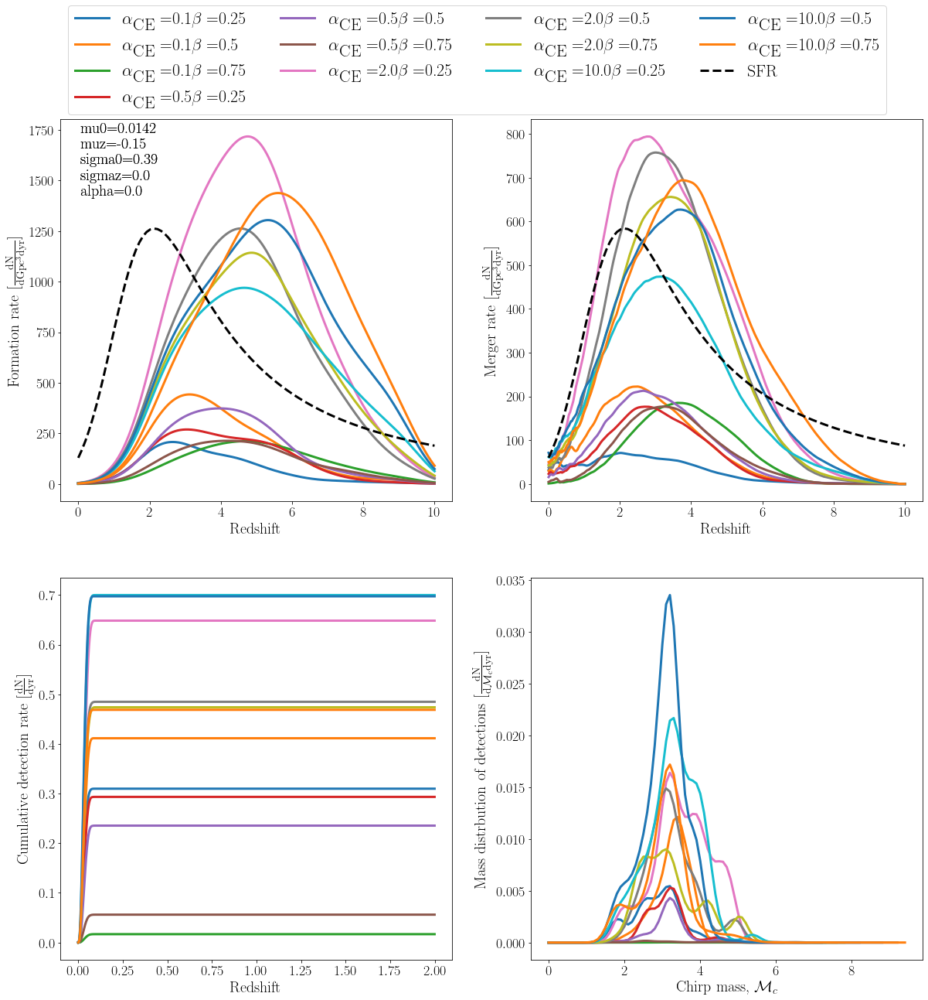

In [7]:
plot_rates_mssfr(condensed_paths, '0.5', '0.5', SFRDs, GSMFs, MZRs, dco_type='BHNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step)

## c) BBH

In [ ]:
plot_rates_mssfr(condensed_paths, '0.5', '0.5', SFRDs, GSMFs, MZRs, dco_type='BBH', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step)

# 5. Metallicity-Delay Time Scatter Plots

## a) BNS

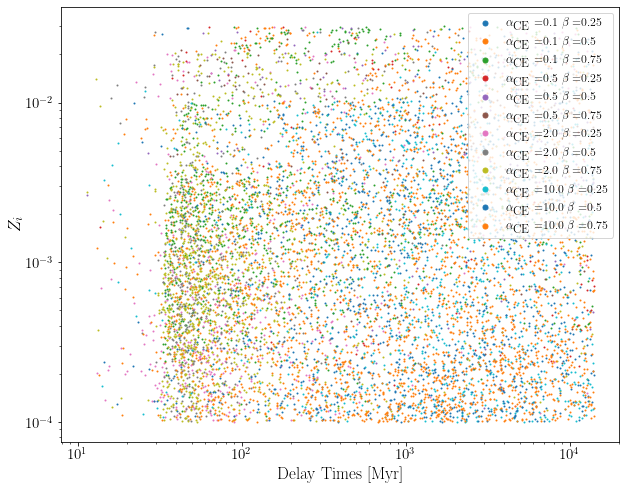

In [85]:
def plot_metallicityVSdelay_times(data, alpha_vals, beta_vals, dco_type):
    """
    This function plots the initial metallicities and time delays for BHNS mergers in given data. It will iterate over given
    alpha_CE and beta values and plot the initia metallicity and time delay for each run's results.

    ...

    Parameters
    ----------
    data : dict
        a two-dimensional dictionary containing the corresponding compas objects for each of the alpha/beta values

    alpha_vals : list
        a one dimensional list containing the alpha_CE values corresponding to the keys of the data dictionary
    
    beta_vals: list 
        a one dimensional list containing the beta values corresponding to the keys of the data dictionary's first dimension
    
    dco_type: str
        one of 'all', 'BBH', 'BHNS', or 'BNS'; the DCO type that we wish to look at.

    """

    # Declare figure
    plt.figure(figsize=(10, 8))

    # Declare axis scales
    plt.yscale("log")  
    plt.xscale("log")

    # Iterate across alpha_CE-beta grid and plot the delay times versus metallicities
    for alpha_val in alpha_vals:
            for beta_val in beta_vals:

                model_data = data[alpha_val][beta_val] # the data
                model_data.setCOMPASDCOmask(dco_type)

                # Get the important BSE values
                time, coalescence_time, dco_seeds = \
                            model_data.get_COMPAS_variables("BSE_Double_Compact_Objects", ["Time", "Coalescence_Time", "SEED"])
                
                # Get the initial metallicities
                Zi, seeds = \
                            model_data.get_COMPAS_variables("BSE_System_Parameters", ["Metallicity@ZAMS(1)", "SEED"])
                
                # Mask for being a DCO
                dco_mask = np.isin(seeds, dco_seeds)

                # Get the DCO initial metallicities
                Zi = Zi[dco_mask]

                # Calculate the time delay for all DCOs
                t_delay = time + coalescence_time

                # Get the time delays and initial metallicities for the given DCO type
                t_delay = t_delay[model_data.DCOmask]
                Zi = Zi[model_data.DCOmask]

                # Plot the time delay and initial metallicities
                plt.scatter(t_delay, Zi, s=1, label=r'$\alpha_{\textrm{CE}} = $' + alpha_val + r' $\beta = $' + beta_val)

    # Label the axes
    plt.xlabel('Delay Times [Myr]', fontsize=17)
    plt.ylabel(r'$Z_i$', fontsize=17)

    # Adjust tick size
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

    # Insert a legend
    plt.legend(loc='upper right',  prop={'size': 12}, markerscale=5)

    # Show the figure!
    plt.show()


plot_metallicityVSdelay_times(data, alpha_vals, beta_vals, 'BNS')

## b) BHNS

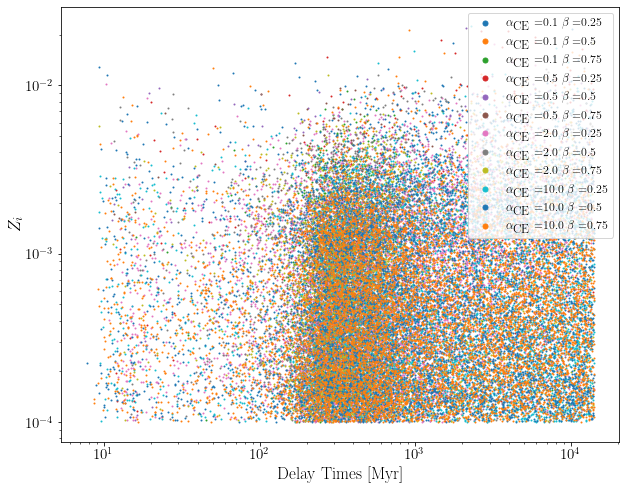

In [86]:
plot_metallicityVSdelay_times(data, alpha_vals, beta_vals, 'BHNS')

## c) BBH

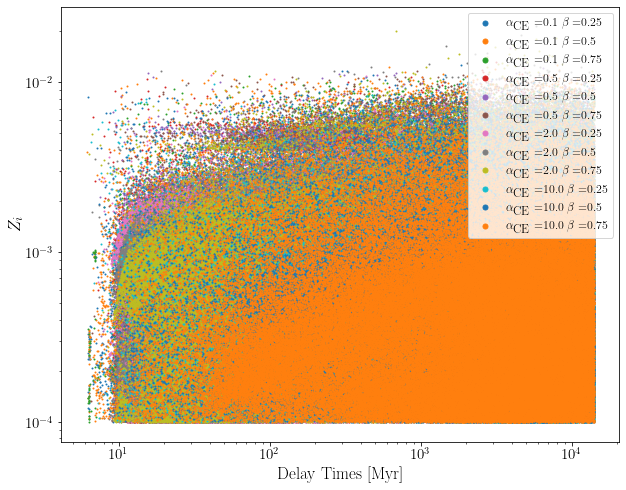

In [87]:
plot_metallicityVSdelay_times(data, alpha_vals, beta_vals, 'BBH')

# 6. Formation Channel Plots

## a) $M_{BH}$ vs $M_{NS}$ for each formation channel

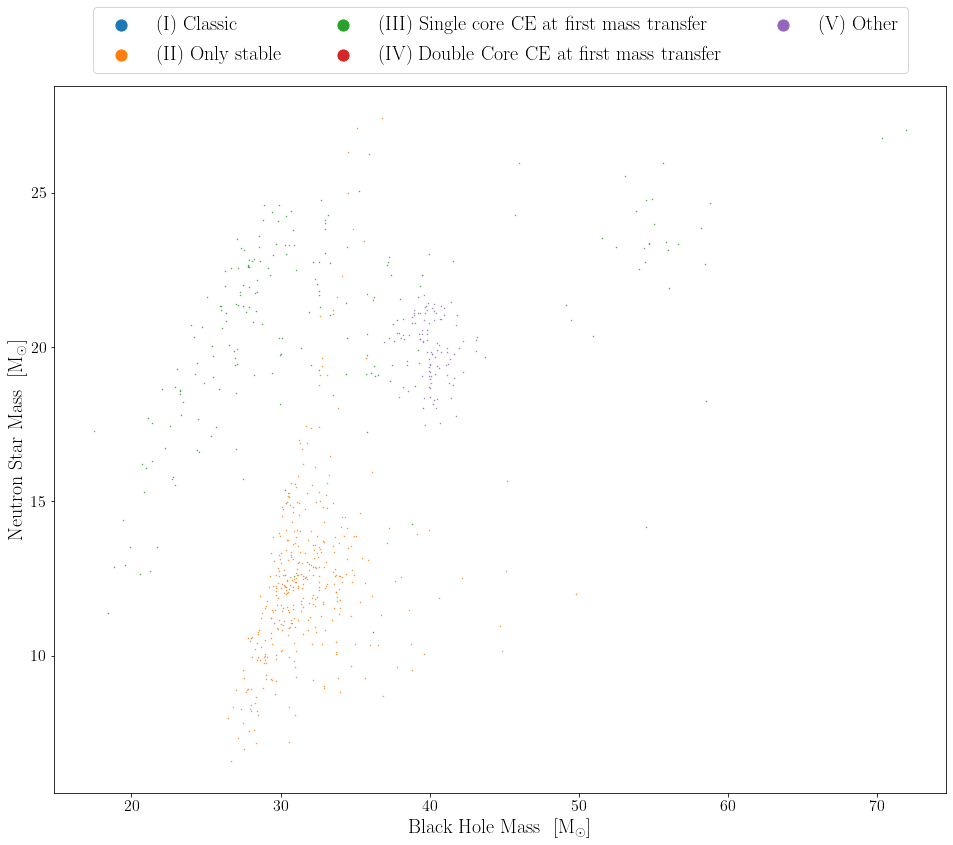

In [88]:
def plot_masses_BHNS_ZAMS(data):
    """
    This function plots the masses of black holes and neutron stars for BHNS mergers in given data for each formation channel.

    ...

    Parameters
    ----------
    data : dict
        a two-dimensional dictionary containing the corresponding compas objects for each of the alpha/beta values

    """
    
    # Declare figure
    fig = plt.figure(figsize=(16, 13))

    # Set the data that we will plot
    fiducial_data = data['0.5']['0.5']
    fiducial_data.setCOMPASDCOmask(types='BHNS', withinHubbleTime=True)
    fiducial_data.setCOMPASData()

    # Get the seeds
    dco_seeds = fiducial_data.seedsDCO

    # Get the important initial values
    mass_1_ZAMS, mass_2_ZAMS, seeds = fiducial_data.get_COMPAS_variables("BSE_System_Parameters", ["Mass@ZAMS(1)", "Mass@ZAMS(2)", "SEED"])

    # Get the important BSE values
    stellar_type_1, stellar_type_2, hubble_flag, dco_seeds = \
                fiducial_data.get_COMPAS_variables("BSE_Double_Compact_Objects", ["Stellar_Type(1)", "Stellar_Type(2)", "Merges_Hubble_Time", "SEED"])

    # Get the initial masses of all NSBH
    dco_type_mask = np.in1d(seeds, dco_seeds)

    # Mask for the ZAMS masses only from BHNS
    mass_1_ZAMS, mass_2_ZAMS= mass_1_ZAMS[dco_type_mask], mass_2_ZAMS[dco_type_mask]

    # Mask for BHNS systems from the BSE_Double_Compact_Objects file
    bhns_mask = np.logical_or(np.logical_and(stellar_type_1 == 13, stellar_type_2==14), np.logical_and(stellar_type_1 == 14, stellar_type_2==13))
    
    # Get the data for BHNS systems only
    stellar_type_1, stellar_type_2, hubble_flag = \
                stellar_type_1[bhns_mask], stellar_type_2[bhns_mask], hubble_flag[bhns_mask]
    mass_1_ZAMS, mass_2_ZAMS= mass_1_ZAMS[bhns_mask], mass_2_ZAMS[bhns_mask]

    # Flags for the neutron stars
    ns1_flag = np.logical_and(stellar_type_1 == 13, hubble_flag==1)     # primary
    ns2_flag = np.logical_and(stellar_type_2 == 13, hubble_flag==1)     # secondary

    # Get the masses
    ns1_mass = mass_1_ZAMS[ns1_flag]                                    # primary
    ns2_mass = mass_2_ZAMS[ns2_flag]                                    # secondary

    # Combine to get the entire list of neutron star masses
    ns_mass = np.concatenate((ns2_mass, ns1_mass), axis=0)

    # Flags for black holes
    bh1_flag = np.logical_and(stellar_type_1 == 14, hubble_flag==1)     # primary
    bh2_flag = np.logical_and(stellar_type_2 == 14, hubble_flag==1)     # secondary

    # Get the masses 
    bh1_mass = mass_1_ZAMS[bh1_flag]                                    # primary
    bh2_mass = mass_2_ZAMS[bh2_flag]                                    # secondary

    # Combine to get the entire list of black hole masses
    bh_mass = np.concatenate((bh1_mass, bh2_mass), axis=0)

    # Get the channels for all dcos
    channel = formation_channels.identify_formation_channels(fiducial_data.seedsDCO, h5.File(fiducial_data.path))
    channel_types = {1: '(I) Classic', 2: '(II) Only stable', 3: '(III) Single core CE at first mass transfer', 4: '(IV) Double Core CE at first mass transfer', 0: '(V) Other'}
    
    # Iterate through the channels and plot each channel
    for ch_num, ch_name in channel_types.items():

        # Mask for the channel
        channel_mask = channel == ch_num

        # Get the primary and secondary masses for the channel
        bh_mass_ch, ns_mass_ch = bh_mass[channel_mask], ns_mass[channel_mask]      

        # Plot the data
        plt.scatter(bh_mass_ch, ns_mass_ch, s=0.2, label=ch_name)
    
    # Label axes
    plt.xlabel(r'Black Hole Mass$   \ \  [\rm{M}_{\odot}]$', fontsize=20)
    plt.ylabel(r'Neutron Star Mass$   \ \  [\rm{M}_{\odot}]$', fontsize=20)

    # Include legend
    fig.legend(fontsize=20, ncol=3, bbox_to_anchor=(0.875, 0.975),  markerscale=25)    

    # Adjust tick fontsize
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)

    # Display the plot
    plt.show()

plot_masses_BHNS_ZAMS(data)

## b) $M_{1,i}$ vs $M_{2,i}$ for each formation channel

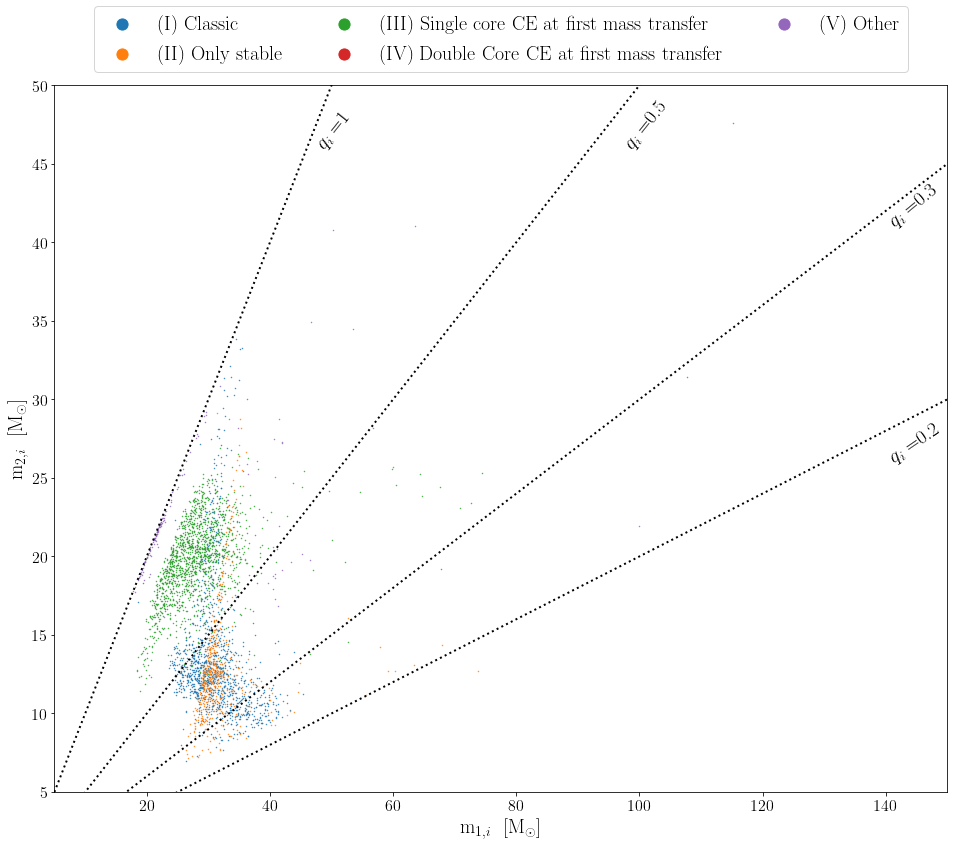

In [92]:
def plot_masses_channels_ZAMS(data):
    """
    This function plots the primary and secondary masses for BHNS mergers in given data for each formation channel.

    ...

    Parameters
    ----------
    data : dict
        a two-dimensional dictionary containing the corresponding compas objects for each of the alpha/beta values

    """

    # Declare figure
    fig = plt.figure(figsize=(16, 13))

    # Set the data that we will plot
    fiducial_data = data['2.0']['0.5']
    fiducial_data.setCOMPASDCOmask(types='BHNS', withinHubbleTime=True)
    fiducial_data.setCOMPASData()

    # Get the seeds
    dco_type_seeds = fiducial_data.seedsDCO

    # Get the important initial values
    mass_1, mass_2, seeds = fiducial_data.get_COMPAS_variables("BSE_System_Parameters", ["Mass@ZAMS(1)", "Mass@ZAMS(2)", "SEED"])

    # Get the initial masses of all dco objects
    dco_type_mask = np.in1d(seeds, dco_type_seeds)
    mass_1, mass_2= mass_1[dco_type_mask], mass_2[dco_type_mask]

    # Get the channels for all dcos
    channel = formation_channels.identify_formation_channels(dco_type_seeds, h5.File(fiducial_data.path))
    channel_types = {1: '(I) Classic', 2: '(II) Only stable', 3: '(III) Single core CE at first mass transfer', 4: '(IV) Double Core CE at first mass transfer', 0: '(V) Other'}
    
    # Iterate through the channels and plot each channel
    for ch_num, ch_name in channel_types.items():

        # Mask for the channel
        channel_mask = channel == ch_num

        # Get the primary and secondary masses for the channel
        mass_1_ch, mass_2_ch = mass_1[channel_mask], mass_2[channel_mask]

        # Plot the data
        plt.scatter(mass_1_ch, mass_2_ch, s=0.2, label=ch_name)

    # Plot dotted lines for a couple of mass ratios
    ax = plt.gca()                  # current axis
    q_list = [1, 0.5, 0.3, 0.2]     # list of mass ratios to plot

    # Label axes
    plt.xlabel(r'$\textrm{m}_{1,i}   \ \  [\rm{M}_{\odot}]$', fontsize=20)
    plt.ylabel(r'$\textrm{m}_{2,i}   \ \  [\rm{M}_{\odot}]$', fontsize=20)

    # Include legend
    fig.legend(fontsize=20, ncol=3, bbox_to_anchor=(0.875, 0.975),  markerscale=25)    
    
    # Adjust tick fontsize
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)

    # Set limits of plot
    ax.set_xlim((5,150))
    ax.set_ylim((5,50))

    # Iterate through and plot each q value
    for q_val in q_list:
        xs = np.linspace(0, 150, num=10000)
        ys = q_val * xs
        xs_cut, ys_cut = xs[xs<=150], ys[ys<=50]
        x, y = max(xs_cut), max(ys_cut)
        if 150*q_val <= 50:
            plt.annotate(text=r'$q_i = ${qval}'.format(qval=q_val), fontsize=20, xy=(140, y - 4), rotation=113-math.degrees(math.atan(x/(y))))
        else:
            plt.annotate(text=r'$q_i = ${qval}'.format(qval=q_val), fontsize=20, xy=(max(xs[ys<=50])-3, 46), rotation=123-math.degrees(math.atan(x/(y))))
        plt.plot(xs, ys, c='k', lw=2, linestyle =':')

    # # Display the plot
    plt.show()

plot_masses_channels_ZAMS(data)

## c) Formation and merger rate plot divided into formation channel

### i. BNS

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79047108.11117253 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78771951.24622673 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79231306.6250335 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78996797.59898305 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
                            set self.calculateMetallicityBinEdges()


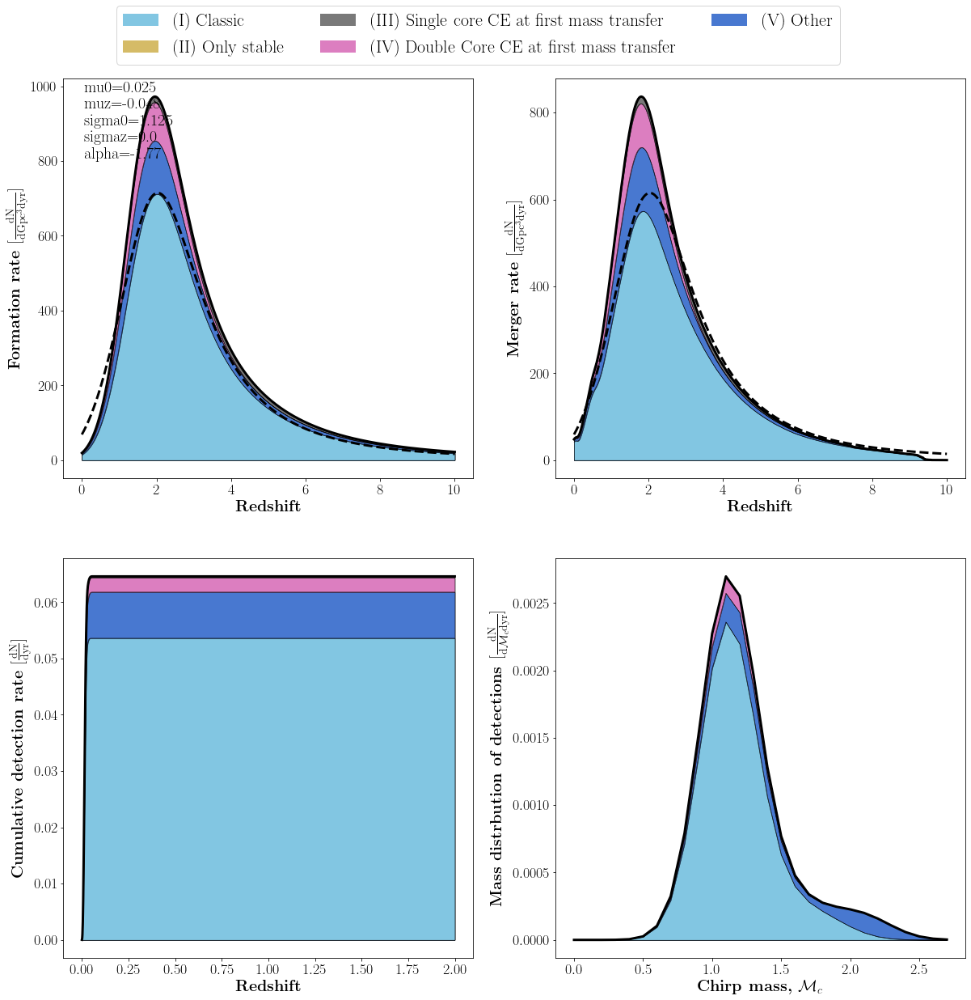

In [5]:
def plot_rates_by_channel(condensed_paths, data, alpha_val, beta_val, dco_type=None, merger_output_filename=None, weight_column=None,
        merges_hubble_time=True, pessimistic_CEE=True, no_RLOF_after_CEE=True,
        max_redshift=10.0, max_redshift_detection=1.0, redshift_step=0.001, z_first_SF = 10,
        use_sampled_mass_ranges=True, m1_min=5 * u.Msun, m1_max=150 * u.Msun, m2_min=0.1 * u.Msun, fbin=1.0,
        aSF = 0.01, bSF = 2.77, cSF = 2.90, dSF = 4.70,
        mu0=0.035, muz=-0.23, sigma0=0.39,sigmaz=0., alpha=0.0, 
        min_logZ=-12.0, max_logZ=1.0, step_logZ=0.01,
        sensitivity="O1", snr_threshold=8, 
        Mc_max=300.0, Mc_step=0.1, eta_max=0.25, eta_step=0.01,
        snr_max=1000.0, snr_step=0.1, lw=0.2, bw=0.3, 
        lognormal=False, Zprescription='MZ_GSMF', SFRprescription='Madau et al. (2017)',        # ADAM'S FIDUCIAL MSSFR PARAMETERS
        GSMFprescription='Panter et al. (2004) Single', ZMprescription='Ma et al. (2016)',      # ADAM'S FIDUCIAL MSSFR PARAMETERS
        logNormalPrescription=None):                                                            # ADAM'S FIDUCIAL MSSFR PARAMETERS
        
        """
        This function plots the formation rate, merger rate, cumulative detection rate, and mass distribution for a set of COMPAS binaries. 
        It breaks up the plots color-coded segments that represent different formation channels

        ...

        Parameters
        ----------
        condensed_paths : dict
            a two-dimensional dictionary containing the path to the paths to each h5 file

        data : dict
            a two-dimensional dictionary containing the COMPAS objects for each of the corresponding condensed_paths files

        alpha_val : str
            the value of the alpha_CE parameter of the COMPAS runs

        beta_val : str
            the value of the alpha_CE parameter of the COMPAS runs

        dco_type : str
            the type of DCO that we will be plots ('BBH', 'BNS', or 'BHNS')

        NOTE: The rest of the parameters either define the universe for our calculations, or are for formatting purposes.

        """



        ###########################
        # Calculate all the rates

        # Make sure that the user gives a dco_type
        assert dco_type != None, 'dco_type must be given'

        # The dictionaries for the values that will be calculated and plotted
        cumulative_detection_rates = {}
        detection_rates_by_binary = {}
        total_detection_rates = {}
        total_formation_rates = {}
        total_merger_rates = {}
        chirp_masses = {}
        redshifts = {}

        # The channel types and colors
        channel_types = {1: '(I) Classic', 2: '(II) Only stable', 3: '(III) Single core CE at first mass transfer', 4: '(IV) Double Core CE at first mass transfer', 0: '(V) Other'}
        channel_colors = {}
        for ch_num in channel_types.keys():
            channel_colors[ch_num] = sns.color_palette('muted')[-ch_num]
                
        # Set the data that we will plot
        fiducial_data = data[alpha_val][beta_val]
        fiducial_data.setCOMPASDCOmask(types=dco_type, withinHubbleTime=True)
        fiducial_data.setCOMPASData()
        
        # Identify the formation channels of each DCO
        channel = formation_channels.identify_formation_channels(fiducial_data.seedsDCO, h5.File(fiducial_data.path))

        # Get the channel numbers from the keys of channel_types
        keys = channel_types.copy().keys()
        
        # Delete the channel_type of any channel that has a count of zero
        for ch_num in keys:
            if np.count_nonzero(np.array(channel)==ch_num) == 0:
                del channel_types[ch_num]

        # Iterate through the channels and calculate the values to be plotted
        for ch_num in channel_types.keys():
            detection_rates, formation_rates, merger_rates, redshifts[ch_num], COMPASs = \
            FCI.find_detection_rate_by_channel(
            condensed_paths[alpha_val][beta_val], ch_num, dco_type=dco_type, weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

            # Mask for the current channel
            channel_mask = channel==ch_num
            # Calculate chirp masses
            chirp_masses[ch_num] = np.array((COMPASs.mass1[channel_mask]*COMPASs.mass2[channel_mask])**(3./5.) / (COMPASs.mass1[channel_mask] + COMPASs.mass2[channel_mask])**(1./5.))

            # sum things up across binaries
            total_formation_rates[ch_num] = np.sum(formation_rates, axis=0)
            total_merger_rates[ch_num] = np.sum(merger_rates, axis=0)
            total_detection_rates[ch_num] = np.sum(detection_rates, axis=0)

            # take the cumulative sum of the detection rates
            cumulative_detection_rates[ch_num] = np.cumsum(total_detection_rates[ch_num])
            detection_rates_by_binary[ch_num] = np.sum(detection_rates, axis=1)

            # empty trash
            del detection_rates
            del formation_rates
            del merger_rates
            del COMPASs



        ###########################
        # Get ready to plot

        # set some constants for the plots
        plt.rc('font', family='serif')
        fs = 20
        fig, axes = plt.subplots(2, 2, figsize=(20, 20))

        # Dictionaries for the areas under each of the curves
        formation_rate_area = {}
        merger_rate_area = {}
        chirp_masses_area = {}
        cumulative_detection_rates_area = {}
        mass_kdes = {}

        # Calculate the area under each curve for the data we will plot
        index = 0
        for ch_num in channel_types.keys():
            if index == 0:
                Mc_bins = np.arange(0,max(chirp_masses[ch_num])*1.3, max(chirp_masses[ch_num])*1.2/100)
                Mc_bin_max = max(chirp_masses[ch_num])
            else:
                if max(chirp_masses[ch_num]) > Mc_bin_max:
                    Mc_bins = np.arange(0,max(chirp_masses[ch_num])*1.3, max(chirp_masses[ch_num])*1.2/100)
                    Mc_bin_max = max(chirp_masses[ch_num])
            index+=1
        
        # The x-axis for the chirp mass KDE
        axis = np.arange(Mc_bins[0], Mc_bins[-1],0.1) 

        # Calculate the area under the curve for all the pannels and channels
        for ch_num in channel_types.keys():
            # Get the area under the curve for each of the channels in each panel
            formation_rate_area[ch_num] = np.trapz(total_formation_rates[ch_num], x=redshifts[ch_num])
            merger_rate_area[ch_num] = np.trapz(total_merger_rates[ch_num], x=redshifts[ch_num])
            cumulative_detection_rates_area[ch_num] = np.trapz(cumulative_detection_rates[ch_num], x=redshifts[ch_num][:len(cumulative_detection_rates[ch_num])])

            # We have to do some fancy stuff for the chirp masses...
            if index == 0:
                # Get the Hist
                hist, _ = np.histogram(chirp_masses[ch_num], weights = detection_rates_by_binary[ch_num], bins=Mc_bins)
                
                # Get the KDE
                mass_kde = FFTKDE(bw=bw).fit(chirp_masses[ch_num], weights=detection_rates_by_binary[ch_num]).evaluate(axis)

                # Normalize the KDE
                mass_kdes[ch_num] = mass_kde*sum(hist)*np.diff(Mc_bins)[0]
            else:
                # Get the Hist
                hist, _ = np.histogram(chirp_masses[ch_num], weights = detection_rates_by_binary[ch_num], bins=Mc_bins)

                # Get the KDE
                mass_kde = FFTKDE(bw=bw).fit(chirp_masses[ch_num], weights=detection_rates_by_binary[ch_num]).evaluate(axis)

                # Normalize the KDE
                mass_kdes[ch_num] = mass_kde*sum(hist)*np.diff(Mc_bins)[0]

            chirp_masses_area[ch_num] = np.trapz(mass_kdes[ch_num], x=axis)
            index+=1
        
        # Sort the areas by descending order
        asc_formation_rates             = dict(sorted(formation_rate_area.items(), key=lambda x: x[1], reverse=True))
        asc_merger_rates                = dict(sorted(merger_rate_area.items(), key=lambda x: x[1], reverse=True))
        asc_mass_kdes                   = dict(sorted(chirp_masses_area.items(), key=lambda x: x[1], reverse=True))
        asc_cumulative_detection_rates  = dict(sorted(cumulative_detection_rates_area.items(), key=lambda x: x[1], reverse=True))



        ###########################
        # PLOT ON THE FOUR PANELS

        # FORMATION RATES
        sums = {}
        order = []
        current_sum = np.zeros(len(redshifts[ch_num]))
        # Add up the disributions in order
        for ch_num in asc_formation_rates.keys():
            current_sum += total_formation_rates[ch_num]
            sums[ch_num] = current_sum.copy()
            order.append(ch_num)

        # Add text upper left corner
        axes[0,0].text(0.05,0.8, 
                "mu0={} \nmuz={} \nsigma0={} \nsigmaz={} \nalpha={}".format(mu0,muz,sigma0,sigmaz,alpha), 
                transform=axes[0,0].transAxes, size = fs) 
        for ax in axes.flatten():
                ax.tick_params(labelsize=0.9*fs)
        
        # Plot
        for ch_num in order[::-1]:
            axes[0,0].fill_between(redshifts[ch_num], sums[ch_num], edgecolor='k', lw=lw, y2=np.zeros(len(sums[ch_num])), facecolor=channel_colors[ch_num])
            axes[0,0].plot(redshifts[ch_num], sums[ch_num], lw=lw, color='k')
            if ch_num == order[::-1][0]:
                axes[0,0].plot(redshifts[ch_num], sums[ch_num], lw=3, color='k')
    
        # MERGER RATES
        sums = {}
        order = []
        current_sum = np.zeros(len(redshifts[ch_num]))
        # Add up the disributions in order
        for ch_num in asc_merger_rates.keys():
            current_sum += total_merger_rates[ch_num]
            sums[ch_num] = current_sum.copy()
            order.append(ch_num)
        
        # Plot
        for ch_num in order[::-1]:
            axes[0,1].fill_between(redshifts[ch_num], sums[ch_num], edgecolor='k', label=channel_types[ch_num], lw=lw, y2=np.zeros(len(sums[ch_num])), facecolor=channel_colors[ch_num])
            axes[0,1].plot(redshifts[ch_num], sums[ch_num], lw=lw, color='k')
            if ch_num == order[::-1][0]:
                axes[0,1].plot(redshifts[ch_num], sums[ch_num], lw=3, color='k')

        # CUMULATIVE DETECTION RATES
        sums = {}
        order = []
        current_sum = np.zeros(len(cumulative_detection_rates[ch_num]))
        # Add up the disributions in order
        for ch_num in asc_cumulative_detection_rates.keys():
            current_sum += cumulative_detection_rates[ch_num]
            sums[ch_num] = current_sum.copy()
            order.append(ch_num)
        
        # Plot
        for ch_num in order[::-1]:
            axes[1,0].fill_between(redshifts[ch_num][:len(sums[ch_num])], sums[ch_num], lw=lw, edgecolor='k', y2=np.zeros(len(sums[ch_num])), facecolor=channel_colors[ch_num])
            axes[1,0].plot(redshifts[ch_num][:len(sums[ch_num])], sums[ch_num], linewidth=lw, color='k')
            if ch_num == order[::-1][0]:
                axes[1,0].plot(redshifts[ch_num][:len(sums[ch_num])], sums[ch_num], lw=3, color='k')

        # Mass KDEs
        sums = {}
        order = []
        current_sum = np.zeros(len(axis))
        # Add up the disributions in order
        for ch_num in asc_mass_kdes.keys():
            current_sum += mass_kdes[ch_num]
            sums[ch_num] = current_sum.copy()
            order.append(ch_num)
        
        # Plot
        for ch_num in order[::-1]:
            axes[1,1].fill_between(axis, sums[ch_num], y2=np.zeros(len(sums[ch_num])), edgecolor='k', lw=lw, facecolor=channel_colors[ch_num]) 
            axes[1,1].plot(axis, sums[ch_num], lw=lw, color='k')
            if ch_num == order[::-1][0]:
                axes[1,1].plot(axis, sums[ch_num], lw=3, color='k')



        ###########################
        # FORMAT THE PLOTS

        # Label axes of all the plots
        axes[0,0].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
        axes[0,0].set_ylabel(r'\textbf{Formation rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$}', fontsize=fs)

        axes[0,1].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
        axes[0,1].set_ylabel(r'\textbf{Merger rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$}', fontsize=fs)

        axes[1,0].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
        axes[1,0].set_ylabel(r'\textbf{Cumulative detection rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}yr}]$}', fontsize=fs)

        axes[1,1].set_xlabel(r'\textbf{Chirp mass, $\mathcal{M}_c$}', fontsize=fs)
        axes[1,1].set_ylabel(r'\textbf{Mass distrbution of detections $[\rm \frac{\mathrm{d}N}{\mathrm{d}\mathcal{M}_c \mathrm{d}yr}]$}', fontsize=fs)

        # Set upper limit on x axis for chirp mass distribution
        xlims = axes[1,1].get_xlim()
        if xlims[1] >= 40:
            axes[1,1].set_xlim([xlims[0], 40])

        # Retreive the SFR
        MSSFR = ClassMSSFR.MSSFR()                                         # Create an MSSFR object
        MSSFR.SFRprescription = SFRprescription                            # Set SFR prescription
        ages = MSSFR.cosmology.age(redshifts[ch_num]).value                # Get the ages
        sfr = MSSFR.returnSFR(redshifts[ch_num], ages)                     # Get the SFR
        sfr = sfr/max(sfr)                                                 # Get peak to 1
        
        # Get constants for scaling SFR
        form_const, merger_const = axes[0,0].get_ylim()[1] * 0.7, axes[0,1].get_ylim()[1] * 0.7

        # Plot SFRs
        axes[0,0].plot(redshifts[ch_num], sfr * form_const, color='black', lw=3, linestyle='dashed')
        axes[0,1].plot(redshifts[ch_num], sfr * merger_const, color='black', lw=3, linestyle='dashed', label=r'SFR')

        # Create legend
        legend_elements = []
        channel_types = {1: '(I) Classic', 2: '(II) Only stable', 3: '(III) Single core CE at first mass transfer', 4: '(IV) Double Core CE at first mass transfer', 0: '(V) Other'}
        for channel_num in keys:
            legend_elements.append(mpatches.Patch(facecolor=channel_colors[channel_num], label=channel_types[channel_num]))

        # Include legend
        fig.legend(handles=legend_elements, fontsize=22, ncol=3, bbox_to_anchor=(0.8, .95),  markerscale=25) 

        # Show the plot!
        plt.show()

plot_rates_by_channel(condensed_paths, data, '2.0', '0.5', dco_type='BNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, lw=0.5, bw=0.2, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

### ii. BHNS

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79088253.92284457 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79169552.05244762 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79018311.21647723 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78822736.71989533 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
                            set self.calculateMetallicityBinEdges()


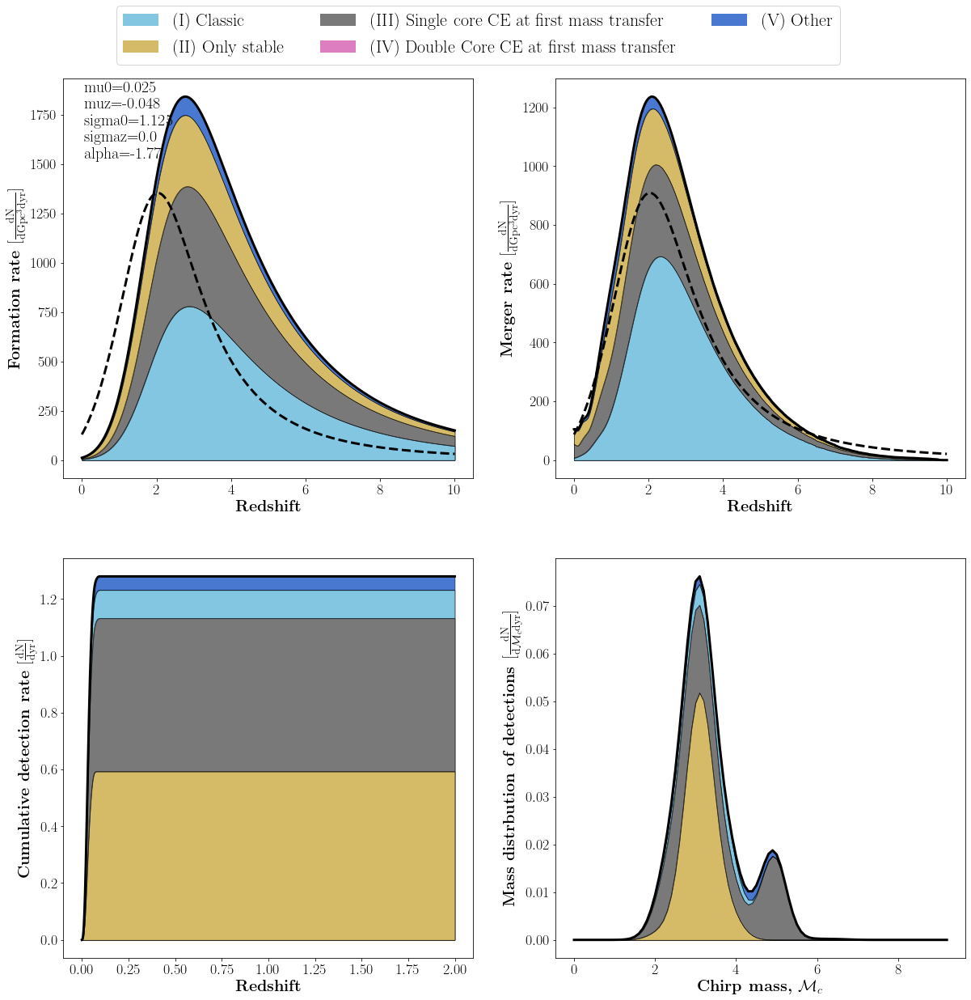

In [6]:
plot_rates_by_channel(condensed_paths, data, '2.0', '0.5', dco_type='BHNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, lw=0.5, bw=0.3, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

### iii. BBH

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78803127.292126 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78649177.91473432 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78961349.81161226 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79267608.97061335 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79140617.52835935 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-part

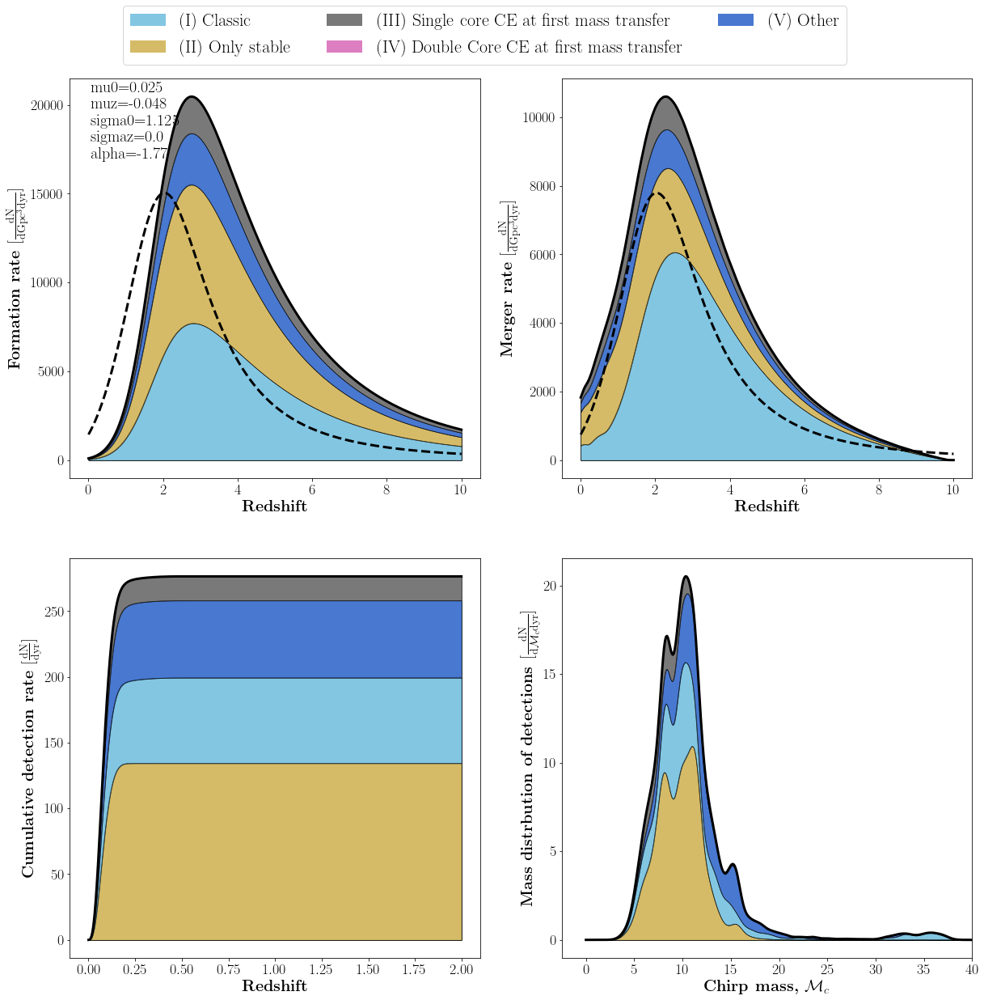

In [7]:
plot_rates_by_channel(condensed_paths, data, '2.0', '0.5', dco_type='BBH', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, lw=0.5, bw=0.5, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

# 7. Delay time rate plots

## a) Formation and merger rate plot divided into delay times

### i. BNS

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79452919.89100699 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79304618.7646768 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78917487.95179684 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79076432.79232049 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79002255.09924375 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-par

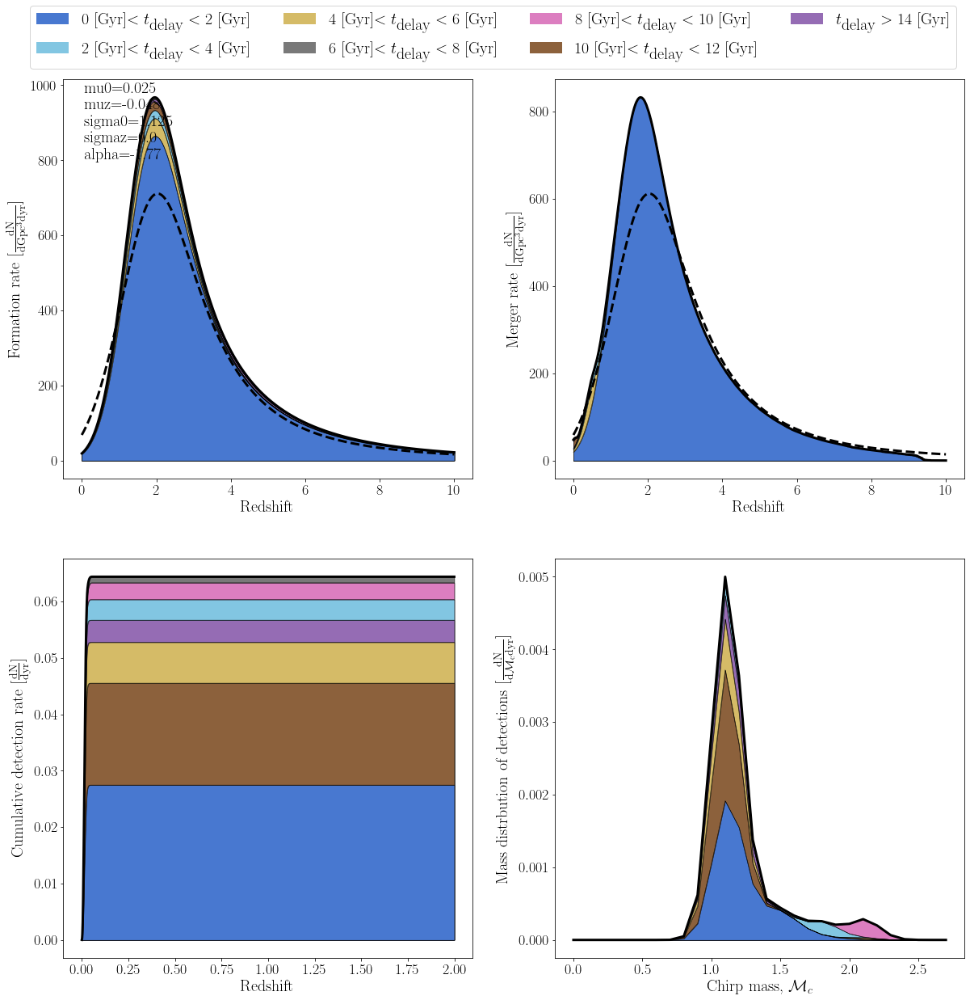

In [5]:
def plot_rates_by_delay_time(condensed_paths, data, alpha_val, beta_val, dco_type=None, merger_output_filename=None, weight_column=None,
        merges_hubble_time=True, pessimistic_CEE=True, no_RLOF_after_CEE=True,
        max_redshift=10.0, max_redshift_detection=1.0, redshift_step=0.001, z_first_SF = 10,
        use_sampled_mass_ranges=True, m1_min=5 * u.Msun, m1_max=150 * u.Msun, m2_min=0.1 * u.Msun, fbin=1.0,
        aSF = 0.01, bSF = 2.77, cSF = 2.90, dSF = 4.70,
        mu0=0.035, muz=-0.23, sigma0=0.39,sigmaz=0., alpha=0.0, 
        min_logZ=-12.0, max_logZ=1.0, step_logZ=0.01,
        sensitivity="O1", snr_threshold=8, 
        Mc_max=300.0, Mc_step=0.1, eta_max=0.25, eta_step=0.01,
        snr_max=1000.0, snr_step=0.1, lw=0.2, bw=0.3, 
        lognormal=False, Zprescription='MZ_GSMF', SFRprescription='Madau et al. (2017)',        # ADAM'S FIDUCIAL MSSFR PARAMETERS
        GSMFprescription='Panter et al. (2004) Single', ZMprescription='Ma et al. (2016)',      # ADAM'S FIDUCIAL MSSFR PARAMETERS
        logNormalPrescription=None):                                                            # ADAM'S FIDUCIAL MSSFR PARAMETERS
        
        """
        This function plots the formation rate, merger rate, cumulative detection rate, and mass distribution for a set of COMPAS binaries. 
        It breaks up the plots color-coded segments that represent different formation channels

        ...

        Parameters
        ----------
        condensed_paths : dict
            a two-dimensional dictionary containing the path to the paths to each h5 file

        data : dict
            a two-dimensional dictionary containing the COMPAS objects for each of the corresponding condensed_paths files

        alpha_val : str
            the value of the alpha_CE parameter of the COMPAS runs

        beta_val : str
            the value of the alpha_CE parameter of the COMPAS runs

        dco_type : str
            the type of DCO that we will be plots ('BBH', 'BNS', or 'BHNS')

        NOTE: The rest of the parameters either define the universe for our calculations, or are for formatting purposes.

        """



        ###########################
        # Calculate all the rates

        # Make sure that the user gives a dco_type
        assert dco_type != None, 'dco_type must be given'

        # The dictionaries for the values that will be calculated and plotted
        cumulative_detection_rates = {}
        total_detection_rates = {}
        total_formation_rates = {}
        total_merger_rates = {}
        chirp_masses = {}
        redshifts = {}
        detection_rates_by_binary = {}

        # Make bins, bin labels, and colors
        bin_edges = np.linspace(0, 14, num=8) * 1000 # [Myrs]
        bins = {}
        bin_labels = {}
        bin_colors = {}
        for index in range(len(bin_edges) - 1):
            bins[index] = [bin_edges[index], bin_edges[index+1]]
            if index == (len(bin_edges) - 2):
                bin_labels[index] = r'$t_\textrm{delay} >$ ' + str(int(bin_edges[index+1]/1000)) + '  [Gyr]' #[Gyrs]
            else:
                bin_labels[index] = str(int(bin_edges[index]/1000)) + '  [Gyr]' + r'$ < t_\textrm{delay} <$ ' + str(int(bin_edges[index+1]/1000)) + '  [Gyr]' #[Gyrs]
            bin_colors[index] = sns.color_palette('muted')[-index]
        
        # Set the data that we will plot
        fiducial_data = data[alpha_val][beta_val]
        fiducial_data.setCOMPASDCOmask(types=dco_type, withinHubbleTime=True)
        fiducial_data.setCOMPASData()

        # Mak masks to filer for the channel only
        time, coalescence_time = fiducial_data.get_COMPAS_variables("BSE_Double_Compact_Objects",["Time", "Coalescence_Time"])
        t_delay = time[fiducial_data.DCOmask] + coalescence_time[fiducial_data.DCOmask]


        # Masks for each bin
        bin_masks = {}
        sps_bin_mask = {}
        for bin_num, bin in bins.items():
            bin_masks[bin_num] = np.logical_and(t_delay>=bin[0], t_delay < bin[1])
            bin_seeds = fiducial_data.seedsDCO[bin_masks[bin_num]]
            sps_seeds = fiducial_data.get_COMPAS_variables("BSE_System_Parameters", "SEED") # All of the seeds
            sps_bin_mask[bin_num] = np.isin(sps_seeds, bin_seeds)

        # Iterate through the channels and calculate the values to be plotted
        for bin_num, bin in bins.items():
            detection_rates, formation_rates, merger_rates, redshifts[bin_num], COMPASs = \
            FCI.find_detection_rate_by_delay_time(
            condensed_paths[alpha_val][beta_val], bin, dco_type=dco_type, weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            
            if detection_rates is None:
                total_formation_rates[bin_num] = None
                total_merger_rates[bin_num] = None
                cumulative_detection_rates[bin_num] = None
                chirp_masses[bin_num] = None
            else:
                # Mask for the current channel
                bin_mask = bin_masks[bin_num]

                # Calculate chirp masses
                chirp_masses[bin_num] = np.array((COMPASs.mass1[bin_mask]*COMPASs.mass2[bin_mask])**(3./5.) / (COMPASs.mass1[bin_mask] + COMPASs.mass2[bin_mask])**(1./5.))

                # sum things up across binaries
                total_formation_rates[bin_num] = np.sum(formation_rates, axis=0)
                total_merger_rates[bin_num] = np.sum(merger_rates, axis=0)
                total_detection_rates[bin_num] = np.sum(detection_rates, axis=0)

                # take the cumulative sum of the detection rates
                cumulative_detection_rates[bin_num] = np.cumsum(total_detection_rates[bin_num])
                detection_rates_by_binary[bin_num] = np.sum(detection_rates, axis=1)

                # empty trash
                del detection_rates
                del formation_rates
                del merger_rates
                del COMPASs



        ###########################
        # Get ready to plot

        # set some constants for the plots
        plt.rc('font', family='serif')
        fs = 20
        fig, axes = plt.subplots(2, 2, figsize=(20, 20))

        # Dictionaries for the areas under each of the curves
        formation_rate_area = {}
        merger_rate_area = {}
        chirp_masses_area = {}
        cumulative_detection_rates_area = {}
        mass_kdes = {}

        # Calculate the area under each curve for the data we will plot
        index = 0
        for bin_num in bins.keys():
            if index == 0:
                Mc_bins = np.arange(0,max(chirp_masses[bin_num])*1.3, max(chirp_masses[bin_num])*1.2/100)
                Mc_bin_max = max(chirp_masses[bin_num])
            else:
                if max(chirp_masses[bin_num]) > Mc_bin_max:
                    Mc_bins = np.arange(0,max(chirp_masses[bin_num])*1.3, max(chirp_masses[bin_num])*1.2/100)
                    Mc_bin_max = max(chirp_masses[bin_num])
            index+=1

        # The x-axis for the chirp mass KDE
        axis = np.arange(Mc_bins[0], Mc_bins[-1],0.1) 

        # Calculate the area under each curve for the data we will plot
        index = 0
        for bin_num in bins.keys():
            if total_formation_rates[bin_num] is None:
                formation_rate_area[bin_num] = 0
                merger_rate_area[bin_num] = 0
                cumulative_detection_rates_area[bin_num] = 0
                mass_kdes[bin_num] = 0
                chirp_masses_area[bin_num] = 0
            else:
                formation_rate_area[bin_num] = np.trapz(total_formation_rates[bin_num], x=redshifts[bin_num])
                merger_rate_area[bin_num] = np.trapz(total_merger_rates[bin_num], x=redshifts[bin_num])
                cumulative_detection_rates_area[bin_num] = np.trapz(cumulative_detection_rates[bin_num], x=redshifts[bin_num][:len(cumulative_detection_rates[bin_num])])

                # We have to do some fancy stuff for the chirp masses...
                if index == 0:
                    # Get the Hist
                    hist, _ = np.histogram(chirp_masses[bin_num], weights = detection_rates_by_binary[bin_num], bins=Mc_bins)
                    
                    # Get the KDE
                    mass_kde = FFTKDE(bw=bw).fit(chirp_masses[bin_num], weights=detection_rates_by_binary[bin_num]).evaluate(axis)

                    # Normalize the KDE
                    mass_kdes[bin_num] = mass_kde*sum(hist)*np.diff(Mc_bins)[0]
                else:
                    # Get the Hist
                    hist, _ = np.histogram(chirp_masses[bin_num], weights = detection_rates_by_binary[bin_num], bins=Mc_bins)

                    # Get the KDE
                    mass_kde = FFTKDE(bw=bw).fit(chirp_masses[bin_num], weights=detection_rates_by_binary[bin_num]).evaluate(axis)

                    # Normalize the KDE
                    mass_kdes[bin_num] = mass_kde*sum(hist)*np.diff(Mc_bins)[0]

                chirp_masses_area[bin_num] = np.trapz(mass_kdes[bin_num], x=axis)
                index+=1
        
        # Sort the areas by descending order
        asc_formation_rates             = dict(sorted(formation_rate_area.items(), key=lambda x: x[1], reverse=True))
        asc_merger_rates                = dict(sorted(merger_rate_area.items(), key=lambda x: x[1], reverse=True))
        asc_mass_kdes                   = dict(sorted(chirp_masses_area.items(), key=lambda x: x[1], reverse=True))
        asc_cumulative_detection_rates  = dict(sorted(cumulative_detection_rates_area.items(), key=lambda x: x[1], reverse=True))



        ###########################
        # PLOT ON THE FOUR PANELS

        # FORMATION RATES
        sums = {}
        order = []
        current_sum = np.zeros(len(redshifts[bin_num]))
        # Add up the disributions in order
        for bin_num in asc_formation_rates.keys():
            if total_formation_rates[bin_num] is not None:
                current_sum += total_formation_rates[bin_num]
                sums[bin_num] = current_sum.copy()
                order.append(bin_num)
        
        # Plot
        for bin_num in order[::-1]:
            axes[0,0].fill_between(redshifts[bin_num], sums[bin_num], edgecolor='k', lw=lw, y2=np.zeros(len(sums[bin_num])), facecolor=bin_colors[bin_num])
            axes[0,0].plot(redshifts[bin_num], sums[bin_num], lw=lw, color='k')
            if bin_num == order[::-1][0]:
                axes[0,0].plot(redshifts[bin_num], sums[bin_num], lw=3, color='k')
    
        # MERGER RATES
        sums = {}
        order = []
        current_sum = np.zeros(len(redshifts[bin_num]))
        # Add up the disributions in order
        for bin_num in asc_merger_rates.keys():
            if total_merger_rates[bin_num] is not None:
                current_sum += total_merger_rates[bin_num]
                sums[bin_num] = current_sum.copy()
                order.append(bin_num)
        
        # Plot
        for bin_num in order[::-1]:
            axes[0,1].fill_between(redshifts[bin_num], sums[bin_num], edgecolor='k', lw=lw, y2=np.zeros(len(sums[bin_num])), facecolor=bin_colors[bin_num])
            axes[0,1].plot(redshifts[bin_num], sums[bin_num], lw=lw, color='k')
            if bin_num == order[::-1][0]:
                axes[0,1].plot(redshifts[bin_num], sums[bin_num], lw=3, color='k')

        # CUMULATIVE DETECTION RATES
        sums = {}
        order = []
        current_sum = np.zeros(len(cumulative_detection_rates[bin_num]))
        # Add up the disributions in order
        for bin_num in asc_cumulative_detection_rates.keys():
            if cumulative_detection_rates[bin_num] is not None:
                current_sum += cumulative_detection_rates[bin_num]
                sums[bin_num] = current_sum.copy()
                order.append(bin_num)
        
        # Plot
        for bin_num in order[::-1]:
            axes[1,0].fill_between(redshifts[bin_num][:len(sums[bin_num])], sums[bin_num], lw=lw, edgecolor='k', y2=np.zeros(len(sums[bin_num])), facecolor=bin_colors[bin_num])
            axes[1,0].plot(redshifts[bin_num][:len(sums[bin_num])], sums[bin_num], linewidth=lw, color='k')
            if bin_num == order[::-1][0]:
                axes[1,0].plot(redshifts[bin_num][:len(sums[bin_num])], sums[bin_num], lw=3, color='k')

        # Mass KDEs
        sums = {}
        order = []
        current_sum = np.zeros(len(axis))
        # Add up the disributions in order
        for bin_num in asc_mass_kdes.keys():
            if chirp_masses[bin_num] is not None:
                current_sum += mass_kdes[bin_num]
                # axes[1,1].plot(axis, current_sum, lw=lw, color=channel_colors[ch_num])     
                # axes[1,1].fill_between(axis, current_sum, y2=np.zeros(len(mass_kdes[ch_num])))   
                sums[bin_num] = current_sum.copy()
                order.append(bin_num)
        
        # Plot
        for bin_num in order[::-1]:
            axes[1,1].fill_between(axis, sums[bin_num], y2=np.zeros(len(sums[bin_num])), edgecolor='k', lw=lw, facecolor=bin_colors[bin_num]) 
            axes[1,1].plot(axis, sums[bin_num], lw=lw, color='k')
            if bin_num == order[::-1][0]:
                axes[1,1].plot(axis, sums[bin_num], lw=3, color='k')



        ###########################
        # FORMAT THE PLOTS

        # Add text upper left corner
        axes[0,0].text(0.05,0.8, 
                "mu0={} \nmuz={} \nsigma0={} \nsigmaz={} \nalpha={}".format(mu0,muz,sigma0,sigmaz,alpha), 
                transform=axes[0,0].transAxes, size = fs) 
        for ax in axes.flatten():
                ax.tick_params(labelsize=0.9*fs)

        # Label axes of all the plots
        axes[0,0].set_xlabel('Redshift', fontsize=fs)
        axes[0,0].set_ylabel(r'Formation rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$', fontsize=fs)

        axes[0,1].set_xlabel('Redshift', fontsize=fs)
        axes[0,1].set_ylabel(r'Merger rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$', fontsize=fs)

        axes[1,0].set_xlabel('Redshift', fontsize=fs)
        axes[1,0].set_ylabel(r'Cumulative detection rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}yr}]$', fontsize=fs)

        axes[1,1].set_xlabel(r'Chirp mass, $\mathcal{M}_c$', fontsize=fs)
        axes[1,1].set_ylabel(r'Mass distrbution of detections $[\rm \frac{\mathrm{d}N}{\mathrm{d}\mathcal{M}_c \mathrm{d}yr}]$', fontsize=fs)

        # Set upper limit on x axis for chirp mass distribution
        xlims = axes[1,1].get_xlim()
        if xlims[1] >= 40:
                axes[1,1].set_xlim([xlims[0], 40])

        # Retreive the SFR
        MSSFR = ClassMSSFR.MSSFR()                                                      # Create an MSSFR object
        MSSFR.SFRprescription = SFRprescription                                         # Set SFR prescription
        ages = MSSFR.cosmology.age(redshifts[bin_num]).value                            # Get the ages
        sfr = MSSFR.returnSFR(redshifts[bin_num], ages)                                 # Get the SFR
        sfr = sfr/max(sfr)                                                              # Get peak to 1
        
        # Get constants for scaling SFR
        form_const, merger_const = axes[0,0].get_ylim()[1] * 0.7, axes[0,1].get_ylim()[1] * 0.7

        # Plot SFRs
        axes[0,0].plot(redshifts[bin_num], sfr * form_const, color='black', lw=3, linestyle='dashed')
        axes[0,1].plot(redshifts[bin_num], sfr * merger_const, color='black', lw=3, linestyle='dashed', label=r'SFR')

        # Create legend
        legend_elements = []
        for bin_num, bin in bins.items():
            legend_elements.append(mpatches.Patch(facecolor=bin_colors[bin_num], label=bin_labels[bin_num]))

        # Include legend
        fig.legend(handles=legend_elements, fontsize=20, ncol=4, bbox_to_anchor=(0.9, .95),  markerscale=25)

        # Show the plot!
        plt.show()

plot_rates_by_delay_time(condensed_paths, data, '2.0', '0.5', dco_type='BNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, lw=0.5, bw=0.1, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

### ii. BHNS

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78872674.68935394 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79020833.45476623 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78986812.69283134 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79310141.81143866 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78967362.04389247 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-pa

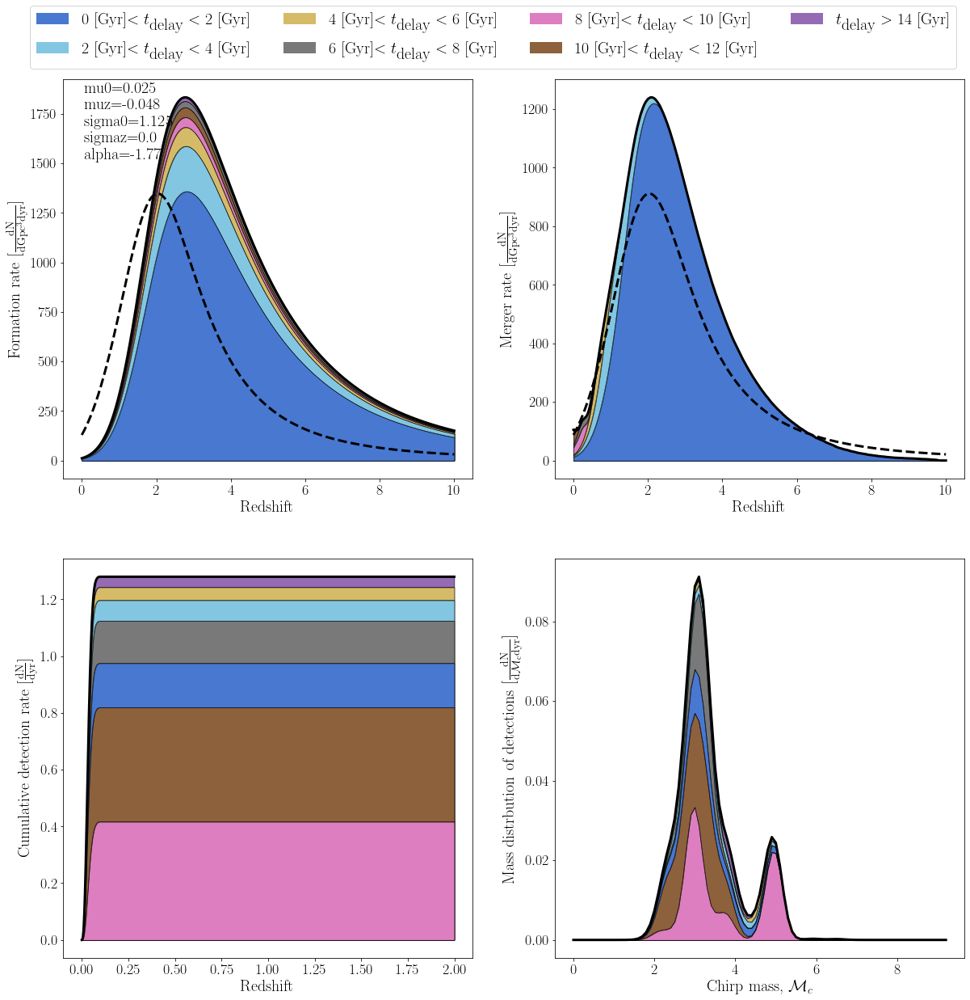

In [6]:
plot_rates_by_delay_time(condensed_paths, data, '2.0', '0.5', dco_type='BHNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, lw=0.5, bw=0.2)

### iii. BBH

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78988562.87104754 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79254415.5518051 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79245520.55215743 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79113763.45548001 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79420768.89250006 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-par

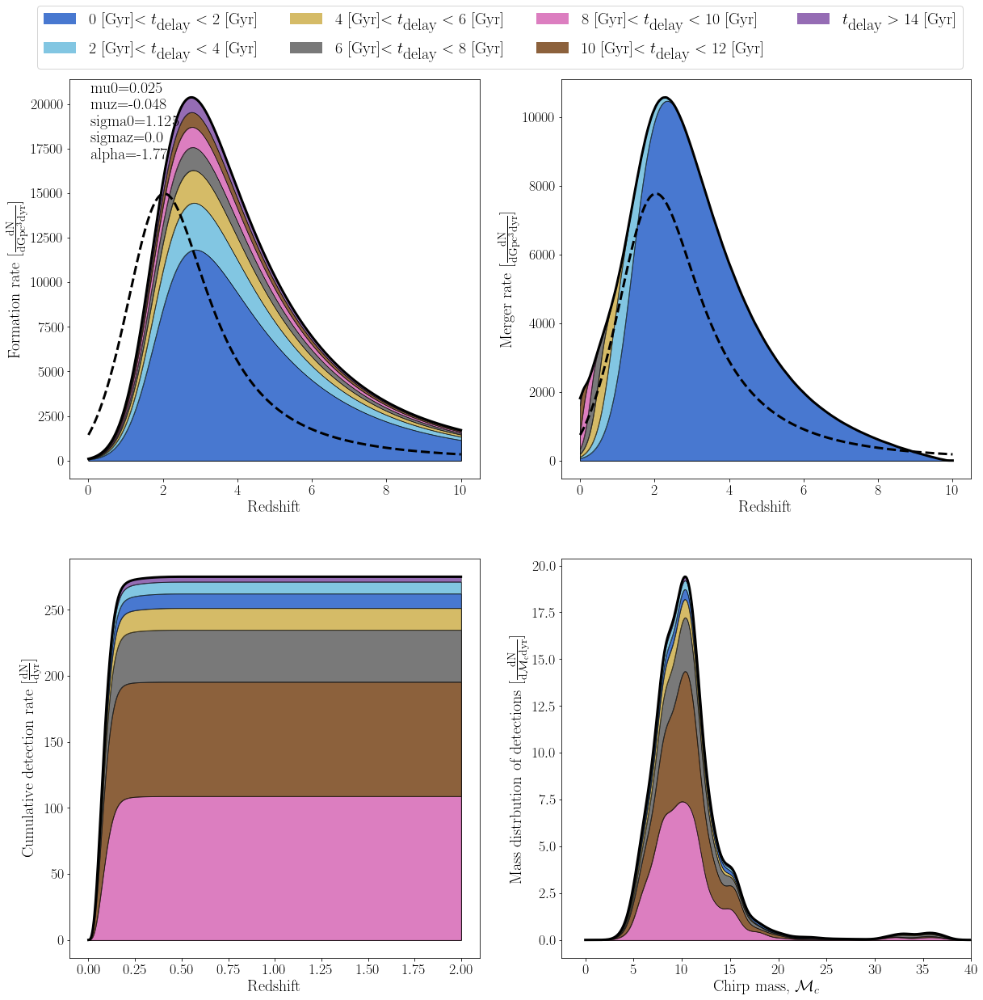

In [8]:
plot_rates_by_delay_time(condensed_paths, data, '2.0', '0.5', dco_type='BBH', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, lw=0.5, bw=0.75)

## b) Zoom in on 0 < z < 2 for the rate plots
This should give us some sort of insight into how $t_\textrm{delay}$ scales as $t^{-1}$

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79022646.49948387 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79160366.90061343 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79070982.3483959 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78945057.975056 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79353889.90800324 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

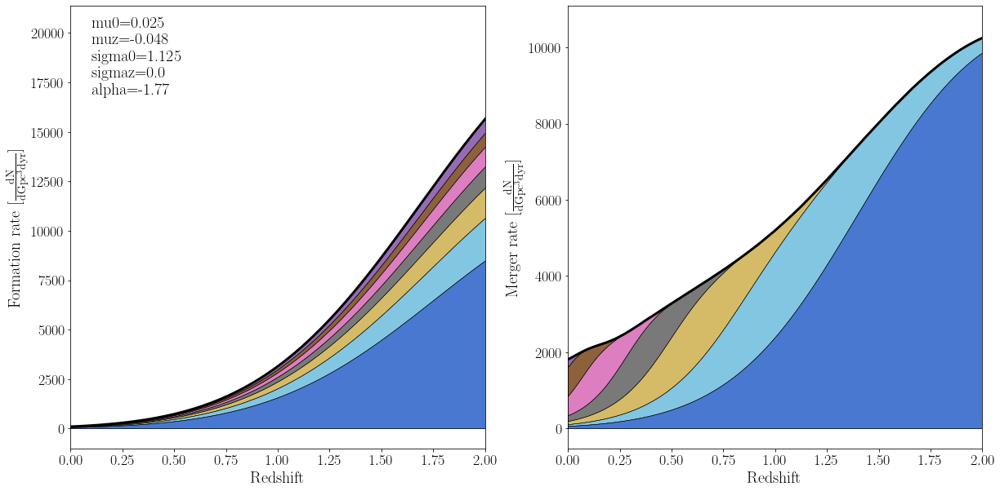

In [9]:
def plot_rates_by_delay_time_zoomed(condensed_paths, data, alpha_val, beta_val, dco_type=None, merger_output_filename=None, weight_column=None,
        merges_hubble_time=True, pessimistic_CEE=True, no_RLOF_after_CEE=True,
        max_redshift=10.0, max_redshift_detection=1.0, redshift_step=0.001, z_first_SF = 10,
        use_sampled_mass_ranges=True, m1_min=5 * u.Msun, m1_max=150 * u.Msun, m2_min=0.1 * u.Msun, fbin=1.0,
        aSF = 0.01, bSF = 2.77, cSF = 2.90, dSF = 4.70,
        mu0=0.035, muz=-0.23, sigma0=0.39,sigmaz=0., alpha=0.0, 
        min_logZ=-12.0, max_logZ=1.0, step_logZ=0.01,
        sensitivity="O1", snr_threshold=8, 
        Mc_max=300.0, Mc_step=0.1, eta_max=0.25, eta_step=0.01,
        snr_max=1000.0, snr_step=0.1, lw=0.2, bw=0.3, 
        lognormal=False, Zprescription='MZ_GSMF', SFRprescription='Madau et al. (2017)',        # ADAM'S FIDUCIAL MSSFR PARAMETERS
        GSMFprescription='Panter et al. (2004) Single', ZMprescription='Ma et al. (2016)',      # ADAM'S FIDUCIAL MSSFR PARAMETERS
        logNormalPrescription=None):                                                            # ADAM'S FIDUCIAL MSSFR PARAMETERS
        
        """
        This function plots the formation rate, merger rate, cumulative detection rate, and mass distribution for a set of COMPAS binaries. 
        It breaks up the plots color-coded segments that represent different formation channels

        ...

        Parameters
        ----------
        condensed_paths : dict
            a two-dimensional dictionary containing the path to the paths to each h5 file

        data : dict
            a two-dimensional dictionary containing the COMPAS objects for each of the corresponding condensed_paths files

        alpha_val : str
            the value of the alpha_CE parameter of the COMPAS runs

        beta_val : str
            the value of the alpha_CE parameter of the COMPAS runs

        dco_type : str
            the type of DCO that we will be plots ('BBH', 'BNS', or 'BHNS')

        NOTE: The rest of the parameters either define the universe for our calculations, or are for formatting purposes.

        """



        ###########################
        # Calculate all the rates

        # Make sure that the user gives a dco_type
        assert dco_type != None, 'dco_type must be given'

        # The dictionaries for the values that will be calculated and plotted
        total_formation_rates = {}
        total_merger_rates = {}
        redshifts = {}

        # Make bins, bin labels, and colors
        bin_edges = np.linspace(0, 14, num=8) * 1000 # [Myrs]
        bins = {}
        bin_labels = {}
        bin_colors = {}
        for index in range(len(bin_edges) - 1):
            bins[index] = [bin_edges[index], bin_edges[index+1]]
            if index == (len(bin_edges) - 2):
                bin_labels[index] = r'$t_\textrm{delay} >$ ' + str(int(bin_edges[index+1]/1000)) + '  [Gyr]' #[Gyrs]
            else:
                bin_labels[index] = str(int(bin_edges[index]/1000)) + '  [Gyr]' + r'$ < t_\textrm{delay} <$ ' + str(int(bin_edges[index+1]/1000)) + '  [Gyr]' #[Gyrs]
            bin_colors[index] = sns.color_palette('muted')[-index]
        
        # Set the data that we will plot
        fiducial_data = data[alpha_val][beta_val]
        fiducial_data.setCOMPASDCOmask(types=dco_type, withinHubbleTime=True)
        fiducial_data.setCOMPASData()

        # Mak masks to filer for the channel only
        time, coalescence_time = fiducial_data.get_COMPAS_variables("BSE_Double_Compact_Objects",["Time", "Coalescence_Time"])
        t_delay = time[fiducial_data.DCOmask] + coalescence_time[fiducial_data.DCOmask]


        # Masks for each bin
        bin_masks = {}
        sps_bin_mask = {}
        for bin_num, bin in bins.items():
            bin_masks[bin_num] = np.logical_and(t_delay>=bin[0], t_delay < bin[1])
            bin_seeds = fiducial_data.seedsDCO[bin_masks[bin_num]]
            sps_seeds = fiducial_data.get_COMPAS_variables("BSE_System_Parameters", "SEED") # All of the seeds
            sps_bin_mask[bin_num] = np.isin(sps_seeds, bin_seeds)

        # Iterate through the channels and calculate the values to be plotted
        for bin_num, bin in bins.items():
            detection_rates, formation_rates, merger_rates, redshifts[bin_num], COMPASs = \
            FCI.find_detection_rate_by_delay_time(
            condensed_paths[alpha_val][beta_val], bin, dco_type=dco_type, weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

            if detection_rates is None:
                total_formation_rates[bin_num] = None
                total_merger_rates[bin_num] = None
            else:

                # sum things up across binaries
                total_formation_rates[bin_num] = np.sum(formation_rates, axis=0)
                total_merger_rates[bin_num] = np.sum(merger_rates, axis=0)

                # empty trash
                del detection_rates
                del formation_rates
                del merger_rates
                del COMPASs



        ###########################
        # Get ready to plot

        # set some constants for the plots
        plt.rc('font', family='serif')
        fs = 20
        fig, axes = plt.subplots(1, 2, figsize=(20, 10))

        # Dictionaries for the areas under each of the curves
        formation_rate_area = {}
        merger_rate_area = {}

        # Calculate the area under each curve for the data we will plot
        index = 0
        for bin_num in bins.keys():
            if total_formation_rates[bin_num] is None:
                formation_rate_area[bin_num] = 0
                merger_rate_area[bin_num] = 0
            else:
                formation_rate_area[bin_num] = np.trapz(total_formation_rates[bin_num], x=redshifts[bin_num])
                merger_rate_area[bin_num] = np.trapz(total_merger_rates[bin_num], x=redshifts[bin_num])
        
        # Sort the areas by descending order
        asc_formation_rates             = dict(sorted(formation_rate_area.items(), key=lambda x: x[1], reverse=True))
        asc_merger_rates                = dict(sorted(merger_rate_area.items(), key=lambda x: x[1], reverse=True))



        ###########################
        # PLOT ON THE FOUR PANELS

        # FORMATION RATES
        sums = {}
        order = []
        current_sum = np.zeros(len(redshifts[bin_num]))
        # Add up the disributions in order
        for bin_num in asc_formation_rates.keys():
            if total_formation_rates[bin_num] is not None:
                current_sum += total_formation_rates[bin_num]
                sums[bin_num] = current_sum.copy()
                order.append(bin_num)
        
        # Plot
        for bin_num in order[::-1]:
            axes[0].fill_between(redshifts[bin_num], sums[bin_num], edgecolor='k', lw=lw, y2=np.zeros(len(sums[bin_num])), facecolor=bin_colors[bin_num])
            axes[0].plot(redshifts[bin_num], sums[bin_num], lw=lw, color='k')
            if bin_num == order[::-1][0]:
                axes[0].plot(redshifts[bin_num], sums[bin_num], lw=3, color='k')
    
        # MERGER RATES
        sums = {}
        order = []
        current_sum = np.zeros(len(redshifts[bin_num]))
        # Add up the disributions in order
        for bin_num in asc_merger_rates.keys():
            if total_merger_rates[bin_num] is not None:
                current_sum += total_merger_rates[bin_num]
                sums[bin_num] = current_sum.copy()
                order.append(bin_num)
        
        # Plot
        for bin_num in order[::-1]:
            axes[1].fill_between(redshifts[bin_num], sums[bin_num], edgecolor='k', lw=lw, y2=np.zeros(len(sums[bin_num])), facecolor=bin_colors[bin_num])
            axes[1].plot(redshifts[bin_num], sums[bin_num], lw=lw, color='k')
            if bin_num == order[::-1][0]:
                axes[1].plot(redshifts[bin_num], sums[bin_num], lw=3, color='k')


        ###########################
        # FORMAT THE PLOTS

        # Add text upper left corner
        axes[0].text(0.05,0.8, 
                "mu0={} \nmuz={} \nsigma0={} \nsigmaz={} \nalpha={}".format(mu0,muz,sigma0,sigmaz,alpha), 
                transform=axes[0].transAxes, size = fs) 
        for ax in axes.flatten():
                ax.tick_params(labelsize=0.9*fs)

        # Label axes of all the plots
        axes[0].set_xlabel('Redshift', fontsize=fs)
        axes[0].set_ylabel(r'Formation rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$', fontsize=fs)

        axes[1].set_xlabel('Redshift', fontsize=fs)
        axes[1].set_ylabel(r'Merger rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$', fontsize=fs)

        # Only look at 0 < z < 2
        axes[0].set_xlim((0,2))
        axes[1].set_xlim((0,2))

        # Set upper limit on x axis for chirp mass distribution
        xlims = axes[1].get_xlim()
        if xlims[1] >= 40:
                axes[1].set_xlim([xlims[0], 40])

        # Retreive the SFR
        MSSFR = ClassMSSFR.MSSFR()                                                      # Create an MSSFR object
        MSSFR.SFRprescription = SFRprescription                                         # Set SFR prescription
        ages = MSSFR.cosmology.age(redshifts[bin_num]).value                            # Get the ages
        sfr = MSSFR.returnSFR(redshifts[bin_num], ages)                                 # Get the SFR
        sfr = sfr/max(sfr)                                                              # Get peak to 1
        
        # Get constants for scaling SFR
        form_const, merger_const = axes[0,0].get_ylim()[1] * 0.7, axes[0,1].get_ylim()[1] * 0.7

        # Plot SFRs
        axes[0,0].plot(redshifts[bin_num], sfr * form_const, color='black', lw=3, linestyle='dashed')
        axes[0,1].plot(redshifts[bin_num], sfr * merger_const, color='black', lw=3, linestyle='dashed', label=r'SFR')

        # Create legend
        legend_elements = []
        for bin_num, bin in bins.items():
            legend_elements.append(mpatches.Patch(facecolor=bin_colors[bin_num], label=bin_labels[bin_num]))

        # Include legend
        fig.legend(handles=legend_elements, fontsize=20, ncol=4, bbox_to_anchor=(0.9, 1.05),  markerscale=25)

        # Show the plot!
        plt.show()

plot_rates_by_delay_time_zoomed(condensed_paths, data, '2.0', '0.5', dco_type='BBH', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, lw=0.5, bw=0.1, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

# 8. Plot rates divided by SFR

## a) BNS

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78812333.17721792 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78910736.76055287 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79324077.12673183 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79065159.02079634 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79043414.52672696 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-pa

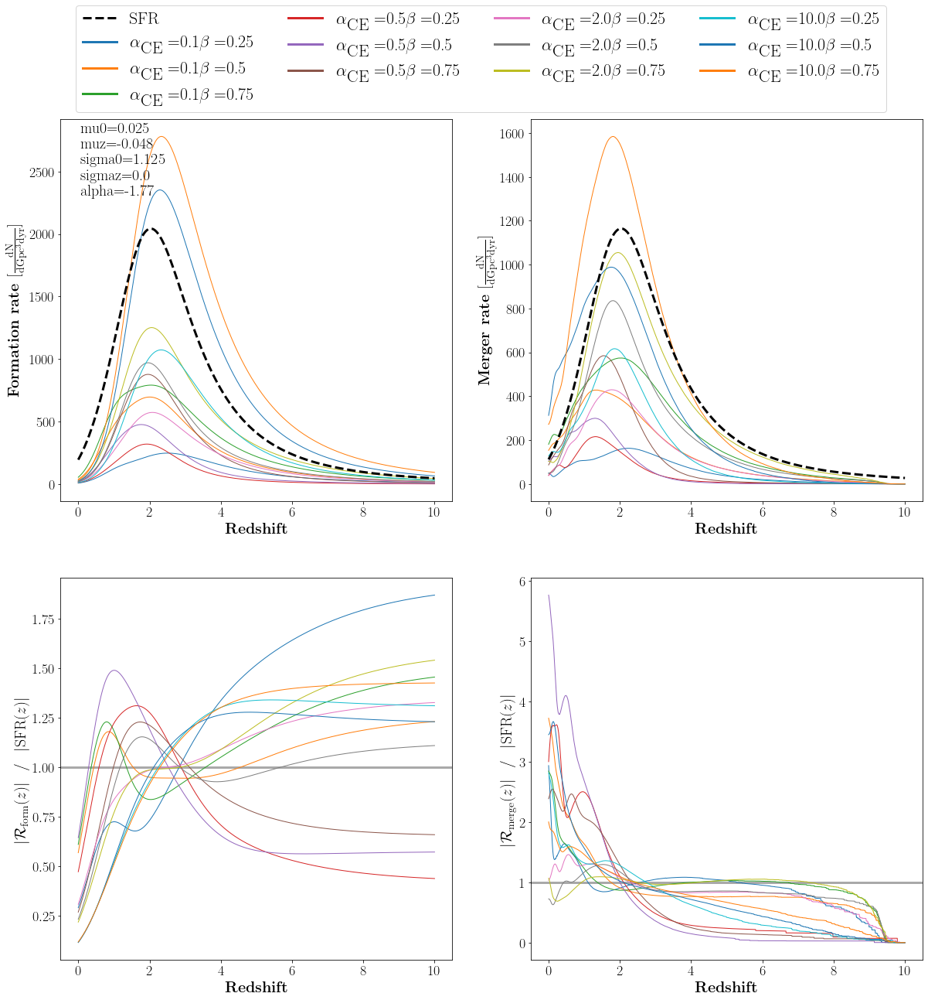

In [22]:
def plot_rates_sfr_norm(condensed_paths, alpha_vals, beta_vals, dco_type=None, merger_output_filename=None, weight_column=None,
    merges_hubble_time=True, pessimistic_CEE=True, no_RLOF_after_CEE=True,
    max_redshift=10.0, max_redshift_detection=1.0, redshift_step=0.001, z_first_SF = 10,
    use_sampled_mass_ranges=True, m1_min=5 * u.Msun, m1_max=150 * u.Msun, m2_min=0.1 * u.Msun, fbin=1.0,
    aSF = 0.01, bSF = 2.77, cSF = 2.90, dSF = 4.70,
    mu0=0.035, muz=-0.23, sigma0=0.39,sigmaz=0., alpha=0.0, 
    min_logZ=-12.0, max_logZ=1.0, step_logZ=0.01,
    sensitivity="O1", snr_threshold=8, 
    Mc_max=300.0, Mc_step=0.1, eta_max=0.25, eta_step=0.01,
    snr_max=1000.0, snr_step=0.1, lw=1, 
    lognormal=False, Zprescription='MZ_GSMF', SFRprescription='Madau et al. (2017)',        # ADAM'S FIDUCIAL MSSFR PARAMETERS
    GSMFprescription='Panter et al. (2004) Single', ZMprescription='Ma et al. (2016)',      # ADAM'S FIDUCIAL MSSFR PARAMETERS
    logNormalPrescription=None):                                                            # ADAM'S FIDUCIAL MSSFR PARAMETERS
    
    # Make sure the dco_type is given
    assert dco_type != None, 'dco_type must be given'

    # 2-D dictionaries for the data to be put in (axes correspond to alpha and beta values)
    total_formation_rates = {}
    total_merger_rates = {}
    total_detection_rates = {}
    cumulative_detection_rates = {}
    detection_rates_by_binary = {}
    chirp_masses = {}
    redshifts = {}

    for alpha_index, alpha_val in enumerate(alpha_vals):
        # Make the dictionary "2D"
        total_formation_rates[alpha_val] = {}
        total_merger_rates[alpha_val] = {}
        total_detection_rates[alpha_val] = {}
        cumulative_detection_rates[alpha_val] = {}
        detection_rates_by_binary[alpha_val] = {}
        chirp_masses[alpha_val] = {}

        redshifts[alpha_val] = {}

        for beta_index, beta_val in enumerate(beta_vals):
            detection_rates, formation_rates, merger_rates, redshifts[alpha_val][beta_val], COMPASs = \
            FCI.find_detection_rate(
            condensed_paths[alpha_val][beta_val], dco_type=dco_type, weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

            chirp_masses[alpha_val][beta_val] = (COMPASs.mass1*COMPASs.mass2)**(3./5.) / (COMPASs.mass1 + COMPASs.mass2)**(1./5.)

            # sum things up across binaries
            total_formation_rates[alpha_val][beta_val] = np.sum(formation_rates, axis=0)
            total_merger_rates[alpha_val][beta_val] = np.sum(merger_rates, axis=0)
            total_detection_rates[alpha_val][beta_val] = np.sum(detection_rates, axis=0)

            # and across redshifts
            cumulative_detection_rates[alpha_val][beta_val] = np.cumsum(total_detection_rates[alpha_val][beta_val])
            detection_rates_by_binary[alpha_val][beta_val] = np.sum(detection_rates, axis=1)

            # empty trash
            del detection_rates
            del formation_rates
            del merger_rates
            del COMPASs



    ###########################
    #Start plotting

    # set some constants for the plots
    plt.rc('font', family='serif')
    fs = 20
    fig, axes = plt.subplots(2, 2, figsize=(20, 20))

    # Get redshifts to use for the SFR
    sfr_redshifts = redshifts['0.1']['0.5']

    # Retreive the SFR
    MSSFR = ClassMSSFR.MSSFR()                              # Create an MSSFR object
    MSSFR.SFRprescription = SFRprescription                 # Set SFR prescription
    ages = MSSFR.cosmology.age(sfr_redshifts).value         # Get the ages
    sfr = MSSFR.returnSFR(sfr_redshifts, ages)              # Get the SFR
    sfr_area = np.trapz(sfr, x=sfr_redshifts)               # Get the area under the curve
    sfr_normalized = sfr/sfr_area                           # Make it so the area under the curve is 1

    for alpha_val in alpha_vals:
        for beta_val in beta_vals:
            axes[0,0].plot(redshifts[alpha_val][beta_val], (total_formation_rates[alpha_val][beta_val]), lw=lw)
            
            axes[0,1].plot(redshifts[alpha_val][beta_val], (total_merger_rates[alpha_val][beta_val]), lw=lw)

            formation_rate_area = np.trapz(total_formation_rates[alpha_val][beta_val], x=redshifts[alpha_val][beta_val])
            axes[1,0].plot(redshifts[alpha_val][beta_val], (total_formation_rates[alpha_val][beta_val] / formation_rate_area) / sfr_normalized, lw=lw)
            
            merger_rate_area = np.trapz(total_merger_rates[alpha_val][beta_val], x=redshifts[alpha_val][beta_val])
            axes[1,1].plot(redshifts[alpha_val][beta_val], (total_merger_rates[alpha_val][beta_val] / merger_rate_area) / sfr_normalized, lw=lw, label=r'$\alpha_{\textrm{CE}} = $' + alpha_val + r'$\beta = $' + beta_val)

    
    # Label axes of all the plots
    axes[0,0].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
    axes[0,0].set_ylabel(r'\textbf{Formation rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$}', fontsize=fs)

    axes[0,1].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
    axes[0,1].set_ylabel(r'\textbf{Merger rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$}', fontsize=fs)

    axes[1,0].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
    axes[1,0].set_ylabel(r'\textbf{$|\mathcal{R}_{\rm{form}}(z)|  \ \  /  \ \  |\textrm{\textnormal{SFR}}(z)|$}', fontsize=fs)

    axes[1,1].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
    axes[1,1].set_ylabel(r'\textbf{$|\mathcal{R}_{\rm{merge}}(z)|  \ \  /  \ \  |\textrm{\textnormal{SFR}}(z)|$}', fontsize=fs)
    
    # Scale SFR differently for each DCO type
    sfr = sfr/max(sfr)
    form_const, merger_const = axes[0,0].get_ylim()[1] * 0.7, axes[0,1].get_ylim()[1] * 0.7

    # Plot SFRs
    axes[0,0].plot(sfr_redshifts, sfr * form_const, color='black', lw=3, linestyle='dashed')
    axes[0,1].plot(sfr_redshifts, sfr * merger_const, color='black', lw=3, linestyle='dashed', label=r'SFR')

    # Plot horizontal line for SFR on the normalized plots
    axes[1,0].axhline(y=1, color='darkgray', lw=3, zorder=-1)
    axes[1,1].axhline(y=1, color='darkgray', lw=3, zorder=-1)

    # Add text upper left corner
    axes[0,0].text(0.05,0.8, 
            "mu0={} \nmuz={} \nsigma0={} \nsigmaz={} \nalpha={}".format(mu0,muz,sigma0,sigmaz,alpha), 
            transform=axes[0,0].transAxes, size = fs) 

    for ax in axes.flatten():
        ax.tick_params(labelsize=0.9*fs)

    # Include legend
    leg = fig.legend(fontsize=22, ncol=4, bbox_to_anchor=(0.875, .99),  markerscale=25) 
    for legobj in leg.legendHandles:
        legobj.set_linewidth(3.0)

    # Show the plot!
    plt.show()

plot_rates_sfr_norm(condensed_paths, alpha_vals, beta_vals, dco_type='BNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

## b) BHNS

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79222271.1658061 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78945619.92100164 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78907201.60341732 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79094010.20065135 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79404842.25864333 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-par

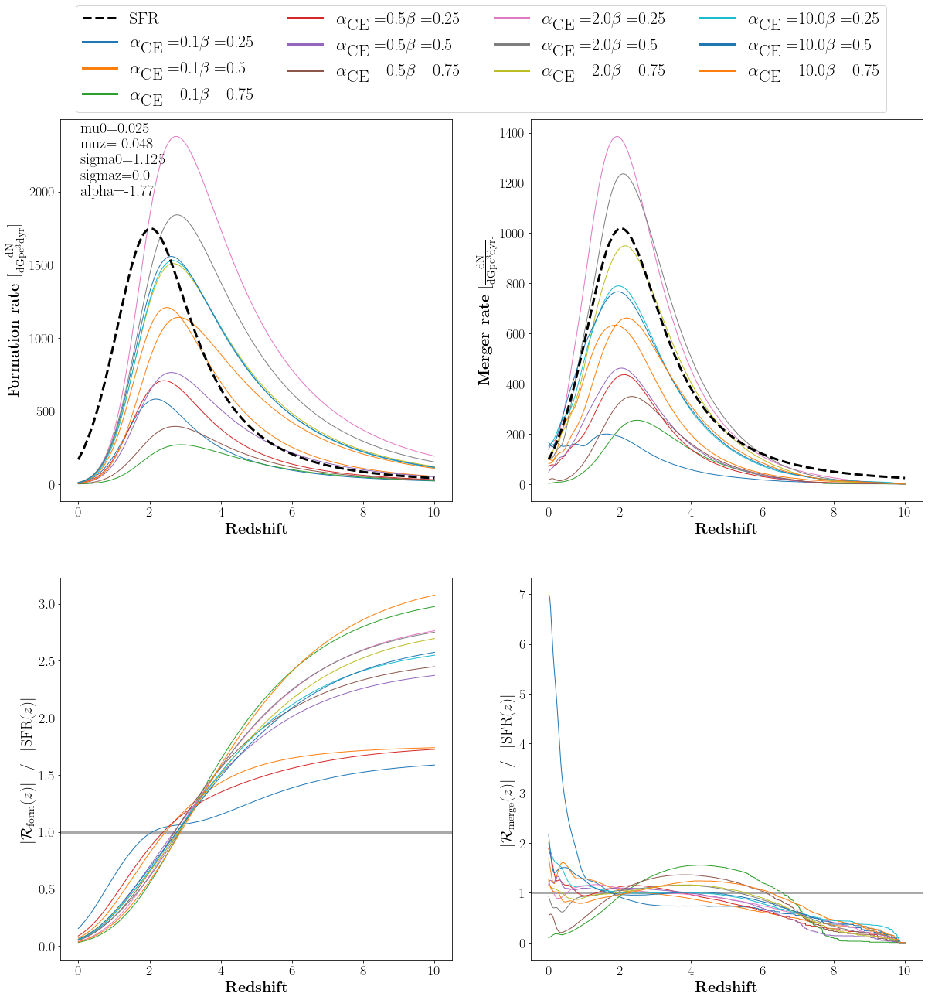

In [25]:
plot_rates_sfr_norm(condensed_paths, alpha_vals, beta_vals, dco_type='BHNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

## c) BBH

/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_28194/1782327177.py:40: UserWarning: Maximum chirp mass used for detectability calculation is below maximum binary chirp mass * (1+maximum redshift for detectability calculation)
  FCI.find_detection_rate(


ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79282528.02804828 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79139403.66681723 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79290166.59772739 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78824996.39122444 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79097394.69251518 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-pa

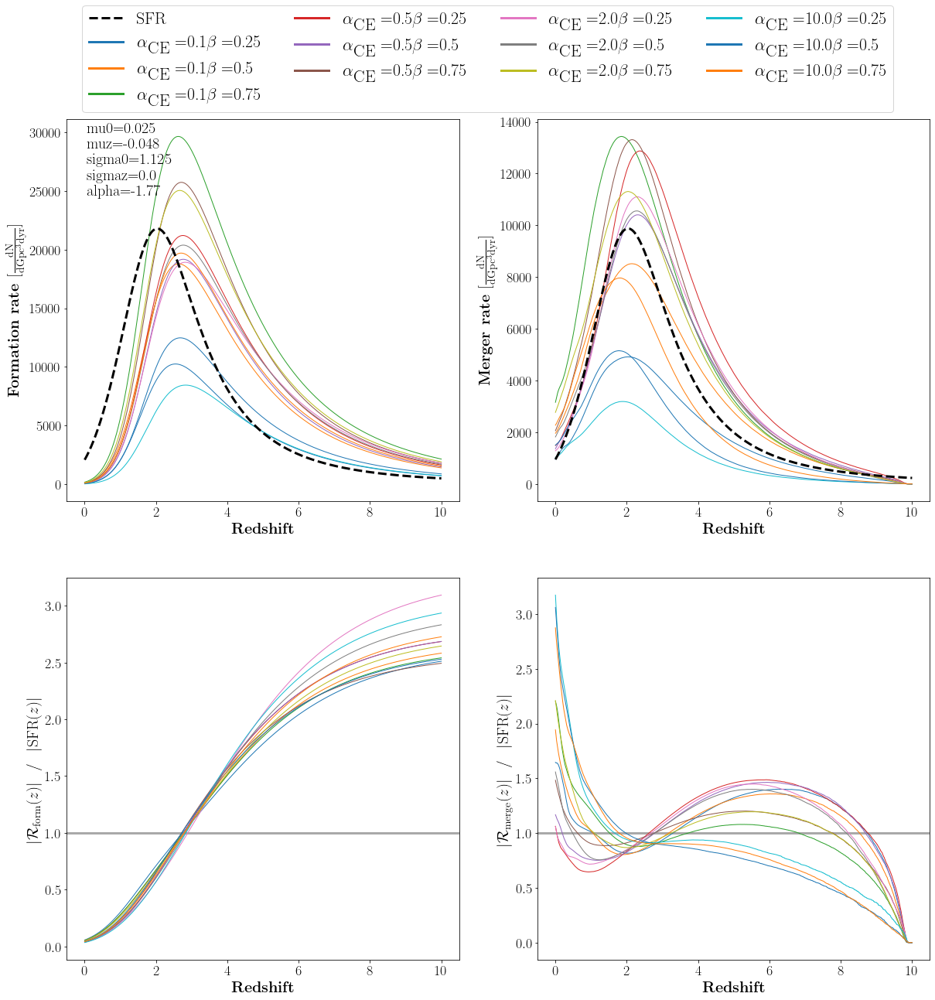

In [24]:
plot_rates_sfr_norm(condensed_paths, alpha_vals, beta_vals, dco_type='BBH', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

# 9. Plot Rates Divided by SFR for the Different SFR Predictions

## a) BNS

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79233113.7760174 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79286239.0239895 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78927988.61856072 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79218039.54598917 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78851247.40395401 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-part

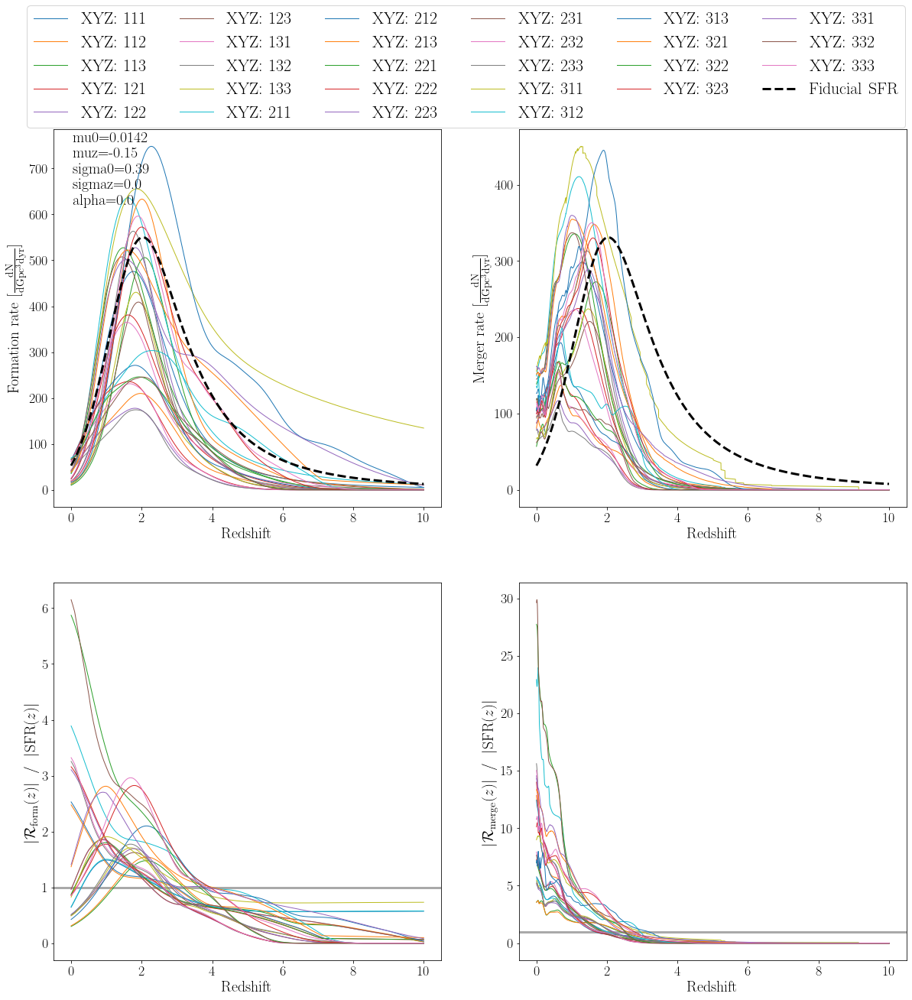

In [12]:
# SFRD, GSMF, and MZR prescriptions (this is in the format of the table that the paper will have)
SFRDs   = {1: 'Madau et al. (2017)',            2: 'Madau et al. (2014)',               3: 'Strolger et al. (2004)'}
GSMFs   = {1: 'Panter et al. (2004) Single',    2: 'Furlong et al. (2015) Single',      3: 'Furlong et al. (2015) Double'}
MZRs    = {1: 'Ma et al. (2016)',               2: 'Langer et al. (2006)',              3: 'Langer et al. +offset (2006)'}


def plot_rates_mssfr_sfr_norm(condensed_paths, alpha_val, beta_val, SFRDs, GSMFs, MZRs, dco_type=None, merger_output_filename=None, weight_column=None,
        merges_hubble_time=True, pessimistic_CEE=True, no_RLOF_after_CEE=True,
        max_redshift=10.0, max_redshift_detection=1.0, redshift_step=0.001, z_first_SF = 10,
        use_sampled_mass_ranges=True, m1_min=5 * u.Msun, m1_max=150 * u.Msun, m2_min=0.1 * u.Msun, fbin=1.0,
        aSF = 0.01, bSF = 2.77, cSF = 2.90, dSF = 4.70,
        mu0=0.035, muz=-0.23, sigma0=0.39,sigmaz=0., alpha=0.0, 
        min_logZ=-12.0, max_logZ=1.0, step_logZ=0.01,
        sensitivity="O1", snr_threshold=8, 
        Mc_max=300.0, Mc_step=0.1, eta_max=0.25, eta_step=0.01,
        snr_max=1000.0, snr_step=0.1, lw=1):
        
        assert dco_type != None, 'dco_type must be given'

        total_formation_rates = {}
        total_merger_rates = {}
        redshifts = {}
        
        for SFRD_num, SFRD_name in SFRDs.items():
                for GSMF_num, GSMF_name in GSMFs.items():
                        for MZR_num, MZR_name in MZRs.items():
                                
                                # The prescription, labeled by a list representing (X, Y, Z)
                                S_prescription = (SFRD_num, GSMF_num, MZR_num)

                                # Calculate!
                                _, formation_rates, merger_rates, redshifts[S_prescription], _ = \
                                FCI.find_detection_rate(
                                condensed_paths[alpha_val][beta_val], dco_type=dco_type, weight_column=weight_column,
                                lognormal=False, Zprescription='MZ_GSMF', SFRprescription=SFRD_name, GSMFprescription=GSMF_name, 
                                ZMprescription=MZR_name, logNormalPrescription=None,
                                merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
                                no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
                                max_redshift_detection=max_redshift_detection,
                                redshift_step=redshift_step, z_first_SF=z_first_SF,
                                m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
                                fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
                                mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
                                min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
                                sensitivity=sensitivity, snr_threshold=snr_threshold,
                                Mc_max=Mc_max, Mc_step=Mc_step,
                                eta_max=eta_max, eta_step=eta_step,
                                snr_max=snr_max, snr_step=snr_step)

                                # sum things up across binaries
                                total_formation_rates[S_prescription] = np.sum(formation_rates, axis=0)
                                total_merger_rates[S_prescription] = np.sum(merger_rates, axis=0)

                                # empty trash
                                del formation_rates
                                del merger_rates

        ###########################
        #Start plotting

        # set some constants for the plots
        plt.rc('font', family='serif')
        fs = 20
        fig, axes = plt.subplots(2, 2, figsize=(20, 20))

        for SFRD_num, SFRD_name in SFRDs.items():
                for GSMF_num, GSMF_name in GSMFs.items():
                        for MZR_num, MZR_name in MZRs.items():

                                # The prescription for the current iteration
                                S_prescription = (SFRD_num, GSMF_num, MZR_num)

                                # Create an MSSFR object
                                MSSFR = ClassMSSFR.MSSFR()
                                MSSFR.SFRprescription = SFRD_name

                                # Get the ages
                                ages = MSSFR.cosmology.age(redshifts[S_prescription]).value

                                # Get the SFR
                                sfr = MSSFR.returnSFR(redshifts[S_prescription], ages)
                                
                                # Normalize the SFR
                                sfr_area = np.trapz(sfr, x=redshifts[S_prescription]) # Get the area under the curve
                                sfr_normalized = sfr/sfr_area # Get area under the curve equal to 1

                                # Plot rates
                                axes[0,0].plot(redshifts[S_prescription], (total_formation_rates[S_prescription]), lw=lw)
            
                                axes[0,1].plot(redshifts[S_prescription], (total_merger_rates[S_prescription]), lw=lw, label='XYZ: ' + str(SFRD_num) + str(GSMF_num) + str(MZR_num))

                                # Plot normalized rates!
                                formation_rate_area = np.trapz(total_formation_rates[S_prescription], x=redshifts[S_prescription])
                                axes[1,0].plot(redshifts[S_prescription], (total_formation_rates[S_prescription]/formation_rate_area)/sfr_normalized, lw=lw) 
                                
                                merger_rate_area = np.trapz(total_merger_rates[S_prescription], x=redshifts[S_prescription])
                                axes[1,1].plot(redshifts[S_prescription], (total_merger_rates[S_prescription]/merger_rate_area)/sfr_normalized, lw=lw)


        # Label axes of all the plots
        axes[0,0].set_xlabel('Redshift', fontsize=fs)
        axes[0,0].set_ylabel(r'Formation rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$', fontsize=fs)

        axes[0,1].set_xlabel('Redshift', fontsize=fs)
        axes[0,1].set_ylabel(r'Merger rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$', fontsize=fs)

        axes[1,0].set_xlabel('Redshift', fontsize=fs)
        axes[1,0].set_ylabel(r'$|\mathcal{R}_{\rm{form}}(z)|  \ \  /  \ \  |\textrm{SFR}(z)|$', fontsize=fs)

        axes[1,1].set_xlabel('Redshift', fontsize=fs)
        axes[1,1].set_ylabel(r'$|\mathcal{R}_{\rm{merge}}(z)|  \ \  /  \ \  |\textrm{SFR}(z)|$', fontsize=fs)


        # Plot horizontal line for SFR on the normalized plots
        axes[1,0].axhline(y=1, color='darkgray', lw=3, zorder=-1)
        axes[1,1].axhline(y=1, color='darkgray', lw=3, zorder=-1)
        
        # Get the fiducial SFR
        MSSFR = ClassMSSFR.MSSFR()
        MSSFR.SFRprescription = 'Madau et al. (2017)'

        # Get the ages
        sfr_redshifts = redshifts[(1,1,1)]
        ages = MSSFR.cosmology.age(sfr_redshifts).value

        # Get the SFR
        sfr = MSSFR.returnSFR(sfr_redshifts, ages)

        # Scale SFR differently for each DCO type
        sfr = sfr/max(sfr)
        form_const, merger_const = axes[0,0].get_ylim()[1] * 0.7, axes[0,1].get_ylim()[1] * 0.7

        # Plot SFRs
        axes[0,0].plot(sfr_redshifts, sfr * form_const, color='black', lw=3, linestyle='dashed')
        axes[0,1].plot(sfr_redshifts, sfr * merger_const, color='black', lw=3, linestyle='dashed', label=r'Fiducial SFR')

        # Add text upper left corner
        axes[0,0].text(0.05,0.8, 
        "mu0={} \nmuz={} \nsigma0={} \nsigmaz={} \nalpha={}".format(mu0,muz,sigma0,sigmaz,alpha), 
        transform=axes[0,0].transAxes, size = fs) 

        for ax in axes.flatten():
                ax.tick_params(labelsize=0.9*fs)

        # Include legend
        fig.legend(fontsize=22, ncol=6, bbox_to_anchor=(0.5, 1.0), loc='upper center',  markerscale=25) 

        # Show the plot!
        plt.show()


plot_rates_mssfr_sfr_norm(condensed_paths, '0.5', '0.5', SFRDs, GSMFs, MZRs, dco_type='BNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step)

## b) BHNS

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79182923.00337641 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79427882.87065217 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79225436.11637686 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79290693.96920398 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79138647.6407966 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-par

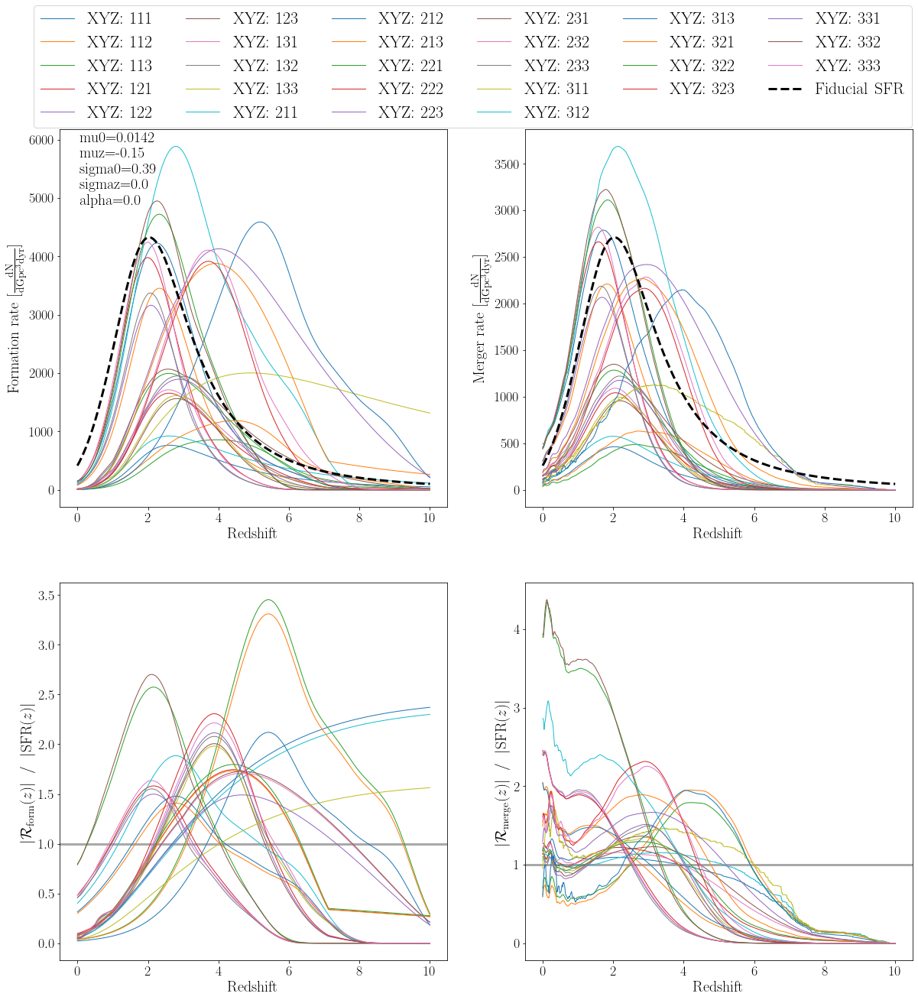

In [13]:
plot_rates_mssfr_sfr_norm(condensed_paths, '0.5', '0.5', SFRDs, GSMFs, MZRs, dco_type='BHNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step)

## c) BBH

In [14]:
plot_rates_mssfr_sfr_norm(condensed_paths, '0.5', '0.5', SFRDs, GSMFs, MZRs, dco_type='BBH', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step)

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78841295.13650829 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79366524.18513069 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79148619.22185649 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts


KeyboardInterrupt: 

# 11. $\chi^2$ between SFR and formation/merger rates

In [28]:
def get_chi2(observed, expected):
    """
        This function gets the chi squared value for two given functions. The functions must be of the same length and their independent variable
        values should be the same for each index of both of the given functions.

        ...

        Parameters
        ----------
        observed : np.array()
            the observed y-values

        expected : np.array()
            the expected

        Returns
        ----------
        float
            the chi squared value between the two functions

    """
    
    return np.sum((observed - expected)**2 / expected)

## a) BNS

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78964494.05335364 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79177993.5464245 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79441321.99247316 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79046569.90367042 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79140518.7759296 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-part

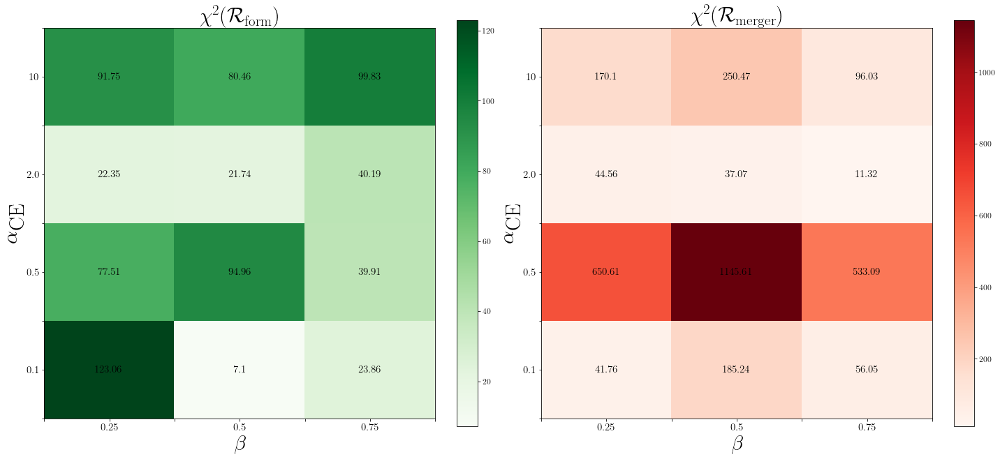

In [29]:
def plot_rates_chi2(condensed_paths, alpha_vals, beta_vals, dco_type=None, merger_output_filename=None, weight_column=None,
    merges_hubble_time=True, pessimistic_CEE=True, no_RLOF_after_CEE=True,
    max_redshift=10.0, max_redshift_detection=1.0, redshift_step=0.001, z_first_SF = 10,
    use_sampled_mass_ranges=True, m1_min=5 * u.Msun, m1_max=150 * u.Msun, m2_min=0.1 * u.Msun, fbin=1.0,
    aSF = 0.01, bSF = 2.77, cSF = 2.90, dSF = 4.70,
    mu0=0.035, muz=-0.23, sigma0=0.39,sigmaz=0., alpha=0.0, 
    min_logZ=-12.0, max_logZ=1.0, step_logZ=0.01,
    sensitivity="O1", snr_threshold=8, 
    Mc_max=300.0, Mc_step=0.1, eta_max=0.25, eta_step=0.01,
    snr_max=1000.0, snr_step=0.1, lw=1, fs=15,
    lognormal=False, Zprescription='MZ_GSMF', SFRprescription='Madau et al. (2017)',        # ADAM'S FIDUCIAL MSSFR PARAMETERS
    GSMFprescription='Panter et al. (2004) Single', ZMprescription='Ma et al. (2016)',      # ADAM'S FIDUCIAL MSSFR PARAMETERS
    logNormalPrescription=None):                                                            # ADAM'S FIDUCIAL MSSFR PARAMETERS
    """
        This function plots two heatmaps corresponding to the chi squared values of the merger and formation rate over a given
        list of alphaCE and beta values.

        ...

        Parameters
        ----------
        condensed_paths : dict
            a two-dimensional dictionary containing the path to the paths to each h5 file

        data : dict
            a two-dimensional dictionary containing the COMPAS objects for each of the corresponding condensed_paths files

        alpha_vals : list
            the values of the alpha_CE parameter of the COMPAS runs

        beta_vals : list
            the values of the alpha_CE parameter of the COMPAS runs

        dco_type : str
            the type of DCO that we will be plots ('BBH', 'BNS', or 'BHNS')

        NOTE: The rest of the parameters either define the universe for our calculations, or are for formatting purposes.

        """



    # Make sure the dco_type is given
    assert dco_type != None, 'dco_type must be given'

    # 2-D dictionaries for the data to be put in (axes correspond to alpha and beta values)
    total_formation_rates = {}
    total_merger_rates = {}
    total_detection_rates = {}
    cumulative_detection_rates = {}
    detection_rates_by_binary = {}
    chirp_masses = {}
    redshifts = {}

    for alpha_index, alpha_val in enumerate(alpha_vals):
        # Make the dictionary "2D"
        total_formation_rates[alpha_val] = {}
        total_merger_rates[alpha_val] = {}
        total_detection_rates[alpha_val] = {}
        cumulative_detection_rates[alpha_val] = {}
        detection_rates_by_binary[alpha_val] = {}
        chirp_masses[alpha_val] = {}

        redshifts[alpha_val] = {}

        for beta_index, beta_val in enumerate(beta_vals):
            _, formation_rates, merger_rates, redshifts[alpha_val][beta_val], _ = \
            FCI.find_detection_rate(
            condensed_paths[alpha_val][beta_val], dco_type=dco_type, weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step,
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

            # sum things up across binaries
            total_formation_rates[alpha_val][beta_val] = np.sum(formation_rates, axis=0)
            total_merger_rates[alpha_val][beta_val] = np.sum(merger_rates, axis=0)

            # empty trash
            del formation_rates
            del merger_rates
    
    # Make chi squared grids
    formation_rate_chi2s = np.zeros((len(alpha_vals), len(beta_vals)))
    merger_rate_chi2s = np.zeros((len(alpha_vals), len(beta_vals)))

    # Get redshifts to use for the normalized SFR
    sfr_redshifts = redshifts[alpha_val][beta_val]

    # Retreive the SFR
    MSSFR = ClassMSSFR.MSSFR()                              # Create an MSSFR object
    MSSFR.SFRprescription = SFRprescription                 # Set SFR prescription
    ages = MSSFR.cosmology.age(sfr_redshifts).value         # Get the ages
    sfr = MSSFR.returnSFR(sfr_redshifts, ages)              # Get the SFR
    sfr_area = np.trapz(sfr, x=sfr_redshifts)               # Get the area under the curve
    sfr_normalized = sfr/sfr_area                           # Make it so the area under the curve is 1
    
    for alpha_index, alpha_val in enumerate(alpha_vals):
        for beta_index, beta_val in enumerate(beta_vals):

            # Normalize the formation and merger rates
            formation_rate_norm = total_formation_rates[alpha_val][beta_val] / np.trapz(total_formation_rates[alpha_val][beta_val], x = redshifts[alpha_val][beta_val])
            merger_rate_norm = total_merger_rates[alpha_val][beta_val] / np.trapz(total_merger_rates[alpha_val][beta_val], x = redshifts[alpha_val][beta_val])

            # Put the chi squared values into the grid
            formation_rate_chi2s[alpha_index][beta_index] = get_chi2(formation_rate_norm, sfr_normalized)
            merger_rate_chi2s[alpha_index][beta_index] = get_chi2(merger_rate_norm, sfr_normalized)


    # Plot
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    # alpha_axis, beta_axis = np.meshgrid(alpha_vals, beta_vals)

    xticks = np.arange(0, 7, 1)
    yticks = np.arange(0, 9, 1)

    xtick_labels = [None, '0.25', None, '0.5', None, '0.75', None]
    ytick_labels = [None, '0.1', None, '0.5', None, '2.0', None, '10', None]
        
    formation_plt = axes[0].imshow(formation_rate_chi2s, cmap ='Greens', vmin = formation_rate_chi2s.min(), vmax = formation_rate_chi2s.max(), extent =[min(xticks),
                                        max(xticks),
                                        min(yticks),
                                        max(yticks)],
                interpolation ='nearest', 
                origin ='lower', aspect=max(xticks)/max(yticks))
    
    norm = matplotlib.colors.Normalize(vmin=0, vmax=np.amax(formation_rate_chi2s))
    formation_bar = fig.colorbar(formation_plt, ax = axes[0], fraction = 0.047)
    formation_bar.ax.tick_params(labelsize=12)

    axes[0].set_title(r'$\chi^2 (\mathcal{R}_{\rm{form}})$', fontsize=fs*2, weight='bold')
    
    axes[0].set_xlabel(r'$\beta$', fontsize=fs*2, weight='bold')
    axes[0].set_ylabel(r'$\alpha_{\textrm{CE}}$', fontsize=fs*2, weight='bold')
    axes[1].set_xlabel(r'$\beta$', fontsize=fs*2, weight='bold')
    axes[1].set_ylabel(r'$\alpha_{\textrm{CE}}$', fontsize=fs*2, weight='bold')

    merger_plt = axes[1].imshow(merger_rate_chi2s, cmap ='Reds', vmin = merger_rate_chi2s.min(), vmax = merger_rate_chi2s.max(), extent =[min(xticks),
                                        max(xticks),
                                        min(yticks),
                                        max(yticks)],
                interpolation ='nearest', 
                origin ='lower', aspect=max(xticks)/max(yticks))

    norm = matplotlib.colors.Normalize(vmin=0, vmax=np.amax(merger_rate_chi2s))
    merger_bar = fig.colorbar(merger_plt, ax = axes[1], fraction=0.047, norm=norm)
    merger_bar.ax.tick_params(labelsize=12)
    axes[1].set_title(r'$\chi^2 (\mathcal{R}_{\rm{merger}})$', fontsize=30, weight='bold')

    # Set axis ticks
    axes[0].set_xticks(xticks)
    axes[0].set_xticklabels(xtick_labels, fontdict={'fontsize': fs, 'fontweight': 'bold'})
    
    axes[0].set_yticks(yticks)
    axes[0].set_yticklabels(ytick_labels, fontdict={'fontsize': fs, 'fontweight': 'bold'})
    
    axes[1].set_xticks(xticks)
    axes[1].set_xticklabels(xtick_labels, fontdict={'fontsize': fs, 'fontweight': 'bold'})
    
    axes[1].set_yticks(yticks)
    axes[1].set_yticklabels(ytick_labels, fontdict={'fontsize': fs, 'fontweight': 'bold'})

    for (j,i),label in np.ndenumerate(formation_rate_chi2s):
        axes[0].text(2*i+1,2*j+1,round(label,2),ha='center',va='center', fontsize=15)
    
    for (j,i),label in np.ndenumerate(merger_rate_chi2s):
        axes[1].text(2*i+1,2*j+1,round(label,2),ha='center',va='center', fontsize=15)

    # Make it all fit
    fig.tight_layout()

plot_rates_chi2(condensed_paths, alpha_vals, beta_vals, dco_type='BNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, lw=0.5, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

## b) BHNS

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78849178.54031491 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78974183.22140308 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79126755.4857988 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79306522.87673138 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79175335.18675262 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-par

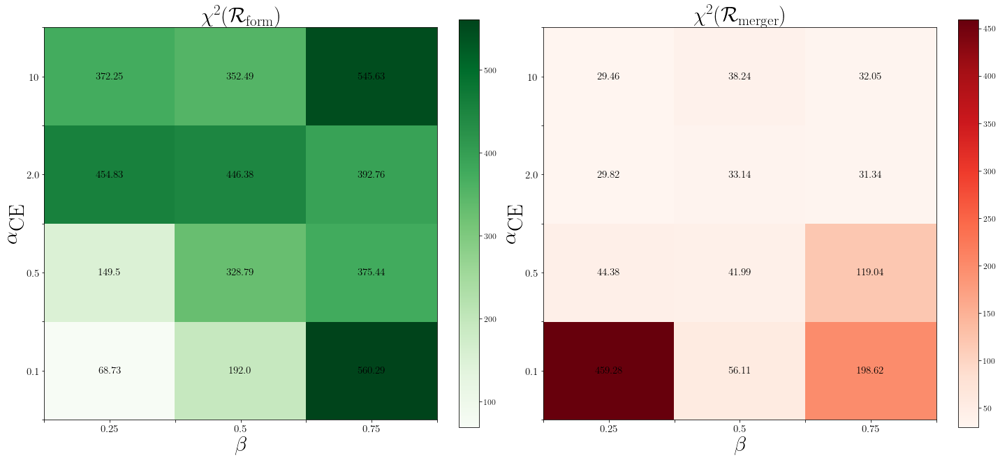

In [30]:
plot_rates_chi2(condensed_paths, alpha_vals, beta_vals, dco_type='BHNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, lw=0.5, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

## c) BBH

/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_28194/2562192946.py:68: UserWarning: Maximum chirp mass used for detectability calculation is below maximum binary chirp mass * (1+maximum redshift for detectability calculation)
  FCI.find_detection_rate(


ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79321753.40617807 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79137569.19245403 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79416202.36680678 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79143955.7431315 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79187808.5053483 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-part

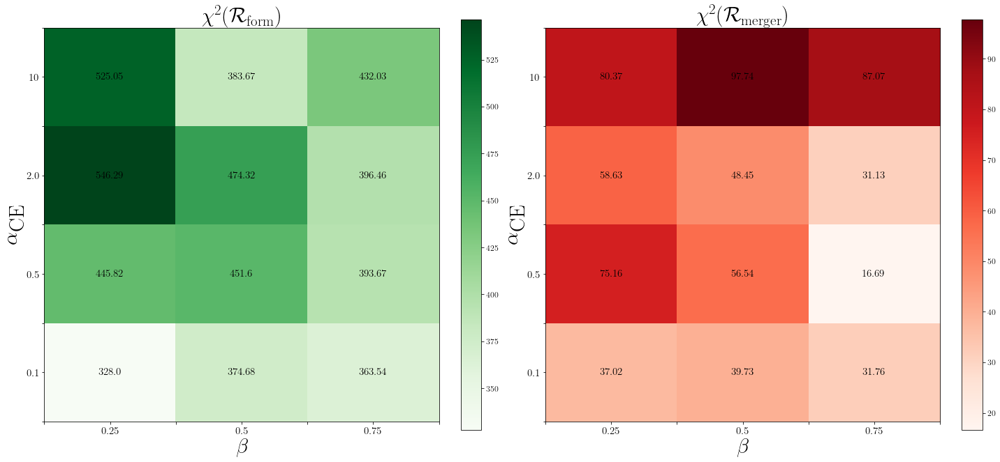

In [32]:
plot_rates_chi2(condensed_paths, alpha_vals, beta_vals, dco_type='BBH', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, lw=0.5, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

# Plot Rates With Confidence Intervals

## a) BNS

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79297684.33898596 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                  

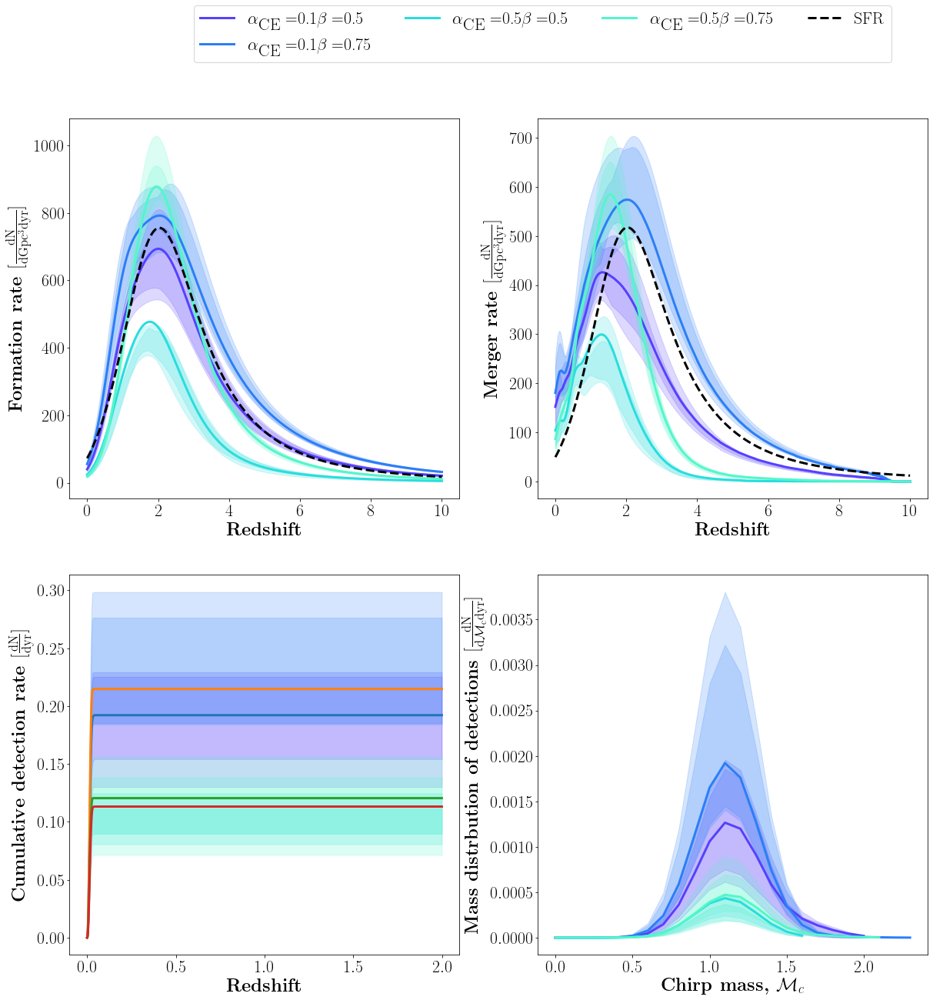

In [ ]:
def plot_rates_CI(condensed_paths, alpha_vals, beta_vals, dco_type=None, merger_output_filename=None, weight_column=None,
        merges_hubble_time=True, pessimistic_CEE=True, no_RLOF_after_CEE=True,
        max_redshift=10.0, max_redshift_detection=1.0, redshift_step=0.001, z_first_SF = 10,
        use_sampled_mass_ranges=True, m1_min=5 * u.Msun, m1_max=150 * u.Msun, m2_min=0.1 * u.Msun, fbin=1.0,
        aSF = 0.01, bSF = 2.77, cSF = 2.90, dSF = 4.70,
        mu0=0.035, muz=-0.23, sigma0=0.39,sigmaz=0., alpha=0.0, 
        min_logZ=-12.0, max_logZ=1.0, step_logZ=0.01,
        sensitivity="O1", snr_threshold=8, 
        Mc_max=300.0, Mc_step=0.1, eta_max=0.25, eta_step=0.01,
        snr_max=1000.0, snr_step=0.1, lw=3, fs = 24, color_grid=None,
        lognormal=False, Zprescription='MZ_GSMF', SFRprescription='Madau et al. (2017)',        # ADAM'S FIDUCIAL MSSFR PARAMETERS
        GSMFprescription='Panter et al. (2004) Single', ZMprescription='Ma et al. (2016)',      # ADAM'S FIDUCIAL MSSFR PARAMETERS
        logNormalPrescription=None, n_iters=100):                                               # ADAM'S FIDUCIAL MSSFR PARAMETERS
        
        assert dco_type != None, 'dco_type must be given'

        CI_kwargs = {'dco_type': dco_type, 'merger_output_filename': merger_output_filename, 'weight_column': weight_column, 'merges_hubble_time': merges_hubble_time, 'pessimistic_CEE': pessimistic_CEE, 
                        'no_RLOF_after_CEE': no_RLOF_after_CEE, 'max_redshift': max_redshift, 'max_redshift_detection': max_redshift_detection, 'redshift_step': redshift_step, 'z_first_SF': z_first_SF,
                        'use_sampled_mass_ranges': use_sampled_mass_ranges, 'm1_min': m1_min, 'm1_max': m1_max, 'm2_min': m2_min, 'fbin': fbin,
                        'aSF': aSF, 'bSF': bSF, 'cSF': cSF, 'dSF': dSF,
                        'mu0': mu0, 'muz': muz, 'sigma0': sigma0, 'sigmaz': sigmaz, 'alpha': alpha, 
                        'min_logZ': min_logZ, 'max_logZ': max_logZ, 'step_logZ': step_logZ,
                        'sensitivity': sensitivity, 'snr_threshold': snr_threshold, 
                        'Mc_max': Mc_max, 'Mc_step': Mc_step, 'eta_max': eta_max, 'eta_step': eta_step,
                        'snr_max': snr_max, 'snr_step': snr_step,
                        'lognormal': lognormal, 'Zprescription': Zprescription, 'SFRprescription': SFRprescription,
                        'GSMFprescription': GSMFprescription, 'ZMprescription': ZMprescription,
                        'logNormalPrescription': logNormalPrescription}


        total_formation_rates = {}
        total_merger_rates = {}
        total_detection_rates = {}
        cumulative_detection_rates = {}
        detection_rates_by_binary = {}
        chirp_masses = {}
        Mc_bins = {}
        one_sigma = {}
        two_sigma = {}

        redshifts = {}

        for alpha_index, alpha_val in enumerate(alpha_vals):
                # Make the dictionary "2D"
                total_formation_rates[alpha_val] = {}
                total_merger_rates[alpha_val] = {}
                total_detection_rates[alpha_val] = {}
                cumulative_detection_rates[alpha_val] = {}
                detection_rates_by_binary[alpha_val] = {}
                chirp_masses[alpha_val] = {}
                Mc_bins[alpha_val] = {}
                one_sigma[alpha_val] = {}
                two_sigma[alpha_val] = {}

                redshifts[alpha_val] = {}

                for beta_index, beta_val in enumerate(beta_vals):

                        # Set the path the for confidence interval calculations
                        # CI_kwargs['path'] = condensed_paths[alpha_val][beta_val]

                        # Find detection rates
                        detection_rates, formation_rates, merger_rates, redshifts[alpha_val][beta_val], COMPASs = \
                        FCI.find_detection_rate(
                        condensed_paths[alpha_val][beta_val], dco_type=dco_type, weight_column=weight_column,
                        merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
                        no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
                        max_redshift_detection=max_redshift_detection,
                        redshift_step=redshift_step, z_first_SF=z_first_SF,
                        m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
                        fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
                        mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
                        min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
                        sensitivity=sensitivity, snr_threshold=snr_threshold,
                        Mc_max=Mc_max, Mc_step=Mc_step,
                        eta_max=eta_max, eta_step=eta_step,
                        snr_max=snr_max, snr_step=snr_step, 
                        lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
                        GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
                        logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

                        chirp_masses[alpha_val][beta_val] = (COMPASs.mass1*COMPASs.mass2)**(3./5.) / (COMPASs.mass1 + COMPASs.mass2)**(1./5.)

                        # sum things up across binaries
                        total_formation_rates[alpha_val][beta_val] = np.sum(formation_rates, axis=0)
                        total_merger_rates[alpha_val][beta_val] = np.sum(merger_rates, axis=0)
                        total_detection_rates[alpha_val][beta_val] = np.sum(detection_rates, axis=0)

                        # and across redshifts
                        cumulative_detection_rates[alpha_val][beta_val] = np.cumsum(total_detection_rates[alpha_val][beta_val])
                        detection_rates_by_binary[alpha_val][beta_val] = np.sum(detection_rates, axis=1)

                        # Get confidence intervals
                        Mc_bins[alpha_val][beta_val] = np.arange(0, max(chirp_masses[alpha_val][beta_val])*1.3, max(chirp_masses[alpha_val][beta_val])*1.2/100) # We need to pass in the bins for the chirp mass distribution so we will declare them here
                        one_sigma[alpha_val][beta_val], two_sigma[alpha_val][beta_val] = FCI.find_detection_rates_CIs(COMPASs, n_iters, CI_kwargs, return_iterations=False, Mc_bins=Mc_bins[alpha_val][beta_val])

                        # empty trash
                        del detection_rates
                        del formation_rates
                        del merger_rates
                        del COMPASs


        ###########################
        #Start plotting
        fig, axes = plt.subplots(2, 2, figsize=(20, 20))


        for alpha_val in alpha_vals:
                for beta_val in beta_vals:
                        # Plot each of the panels, and their confidence intervals
                        axes[0,0].plot(redshifts[alpha_val][beta_val], total_formation_rates[alpha_val][beta_val], lw=lw, color=color_grid[alpha_val][beta_val])
                        axes[0,0].fill_between(x=redshifts[alpha_val][beta_val], y1=one_sigma[alpha_val][beta_val]['total_formation_rates'][0], y2=one_sigma[alpha_val][beta_val]['total_formation_rates'][1], alpha=0.2, color=color_grid[alpha_val][beta_val])
                        axes[0,0].fill_between(x=redshifts[alpha_val][beta_val], y1=two_sigma[alpha_val][beta_val]['total_formation_rates'][0], y2=two_sigma[alpha_val][beta_val]['total_formation_rates'][1], alpha=0.2, color=color_grid[alpha_val][beta_val])
                        
                        axes[0,1].plot(redshifts[alpha_val][beta_val], total_merger_rates[alpha_val][beta_val], lw=lw, label=r'$\alpha_{\textrm{CE}} = $' + alpha_val + r'$\beta = $' + beta_val, color=color_grid[alpha_val][beta_val])
                        axes[0,1].fill_between(x=redshifts[alpha_val][beta_val], y1=one_sigma[alpha_val][beta_val]['total_merger_rates'][0], y2=one_sigma[alpha_val][beta_val]['total_merger_rates'][1], alpha=0.2, color=color_grid[alpha_val][beta_val])
                        axes[0,1].fill_between(x=redshifts[alpha_val][beta_val], y1=two_sigma[alpha_val][beta_val]['total_merger_rates'][0], y2=two_sigma[alpha_val][beta_val]['total_merger_rates'][1], alpha=0.2, color=color_grid[alpha_val][beta_val])
                        
                        axes[1,0].plot(redshifts[alpha_val][beta_val][:len(cumulative_detection_rates[alpha_val][beta_val])], cumulative_detection_rates[alpha_val][beta_val], lw=lw, color=color_grid[alpha_val][beta_val])
                        axes[1,0].fill_between(x=redshifts[alpha_val][beta_val][:len(cumulative_detection_rates[alpha_val][beta_val])], y1=one_sigma[alpha_val][beta_val]['cumulative_detection_rates'][0], y2=one_sigma[alpha_val][beta_val]['cumulative_detection_rates'][1], alpha=0.2, color=color_grid[alpha_val][beta_val])
                        axes[1,0].fill_between(x=redshifts[alpha_val][beta_val][:len(cumulative_detection_rates[alpha_val][beta_val])], y1=two_sigma[alpha_val][beta_val]['cumulative_detection_rates'][0], y2=two_sigma[alpha_val][beta_val]['cumulative_detection_rates'][1], alpha=0.2, color=color_grid[alpha_val][beta_val])

                        # Get the Hist
                        hist, _ = np.histogram(chirp_masses[alpha_val][beta_val], weights = detection_rates_by_binary[alpha_val][beta_val], bins=Mc_bins[alpha_val][beta_val])
                        
                        # Calculate KDE
                        axis = np.arange(Mc_bins[alpha_val][beta_val][0],Mc_bins[alpha_val][beta_val][-1],0.1) # The x-axis for the chirp masses
                        # Get the KDE
                        mass_kde = FFTKDE(bw=0.2).fit(chirp_masses[alpha_val][beta_val], weights=detection_rates_by_binary[alpha_val][beta_val]).evaluate(axis)
                        # Normalize the KDE
                        mass_kde_scaled = mass_kde*sum(hist)*sum(hist)*np.diff(Mc_bins[alpha_val][beta_val])[0]
                        axes[1,1].plot(axis, mass_kde_scaled, lw=lw, color=color_grid[alpha_val][beta_val])
                        axes[1,1].fill_between(x=axis, y1=one_sigma[alpha_val][beta_val]['mass_kde'][0], y2=one_sigma[alpha_val][beta_val]['mass_kde'][1], alpha=0.2, color=color_grid[alpha_val][beta_val])
                        axes[1,1].fill_between(x=axis, y1=two_sigma[alpha_val][beta_val]['mass_kde'][0], y2=two_sigma[alpha_val][beta_val]['mass_kde'][1], alpha=0.2, color=color_grid[alpha_val][beta_val])
        
        # Label axes of all the plots
        axes[0,0].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
        axes[0,0].set_ylabel(r'\textbf{Formation rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$}', fontsize=fs)

        axes[0,1].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
        axes[0,1].set_ylabel(r'\textbf{Merger rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$}', fontsize=fs)

        axes[1,0].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
        axes[1,0].set_ylabel(r'\textbf{Cumulative detection rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}yr}]$}', fontsize=fs)

        axes[1,1].set_xlabel(r'\textbf{Chirp mass, $\mathcal{M}_c$}', fontsize=fs)
        axes[1,1].set_ylabel(r'\textbf{Mass distrbution of detections $[\rm \frac{\mathrm{d}N}{\mathrm{d}\mathcal{M}_c \mathrm{d}yr}]$}', fontsize=fs)

        # Set upper limit on x axis for chirp mass distribution
        xlims = axes[1,1].get_xlim()
        if xlims[1] >= 40:
                axes[1,1].set_xlim([xlims[0], 40])

        for ax in axes.flatten():
                ax.tick_params(labelsize=0.9*fs)

        # Retreive the SFR
        MSSFR = ClassMSSFR.MSSFR()                                                      # Create an MSSFR object
        MSSFR.SFRprescription = SFRprescription                                         # Set SFR prescription
        ages = MSSFR.cosmology.age(redshifts[alpha_val][beta_val]).value                # Get the ages
        sfr = MSSFR.returnSFR(redshifts[alpha_val][beta_val], ages)                     # Get the SFR
        sfr = sfr/max(sfr)                                                              # Get peak to 1
        
        # Get constants for scaling SFR
        form_const, merger_const = axes[0,0].get_ylim()[1] * 0.7, axes[0,1].get_ylim()[1] * 0.7

        # Plot SFRs
        axes[0,0].plot(redshifts[alpha_val][beta_val], sfr * form_const, color='black', lw=lw, linestyle='dashed')
        axes[0,1].plot(redshifts[alpha_val][beta_val], sfr * merger_const, color='black', lw=lw, linestyle='dashed', label=r'SFR')

        # Include legend
        fig.legend(fontsize=22, ncol=4, bbox_to_anchor=(0.875, .99),  markerscale=25) 

        # Show the plot!
        plt.show()

plot_rates_CI(condensed_paths, alpha_vals, beta_vals, dco_type='BNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, color_grid=color_grid,
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription, n_iters=100)                               # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

In [ ]:
plot_rates_CI(condensed_paths, alpha_vals, beta_vals, dco_type='BHNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, color_grid=color_grid,
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription, n_iters=100)                               # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

In [ ]:
plot_rates_CI(condensed_paths, alpha_vals, beta_vals, dco_type='BBH', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, color_grid=color_grid,
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription, n_iters=100)                               # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

# Plot Rates Divided by SFR With a Confidence Interval

In [13]:
def plot_rates_sfr_norm(condensed_paths, alpha_vals, beta_vals, dco_type=None, merger_output_filename=None, weight_column=None,
    merges_hubble_time=True, pessimistic_CEE=True, no_RLOF_after_CEE=True,
    max_redshift=10.0, max_redshift_detection=1.0, redshift_step=0.001, z_first_SF = 10,
    use_sampled_mass_ranges=True, m1_min=5 * u.Msun, m1_max=150 * u.Msun, m2_min=0.1 * u.Msun, fbin=1.0,
    aSF = 0.01, bSF = 2.77, cSF = 2.90, dSF = 4.70,
    mu0=0.035, muz=-0.23, sigma0=0.39,sigmaz=0., alpha=0.0, 
    min_logZ=-12.0, max_logZ=1.0, step_logZ=0.01,
    sensitivity="O1", snr_threshold=8, 
    Mc_max=300.0, Mc_step=0.1, eta_max=0.25, eta_step=0.01,
    snr_max=1000.0, snr_step=0.1, lw=2, 
    lognormal=False, Zprescription='MZ_GSMF', SFRprescription='Madau et al. (2017)',        # ADAM'S FIDUCIAL MSSFR PARAMETERS
    GSMFprescription='Panter et al. (2004) Single', ZMprescription='Ma et al. (2016)',      # ADAM'S FIDUCIAL MSSFR PARAMETERS
    logNormalPrescription=None, n_iters=100):                                               # ADAM'S FIDUCIAL MSSFR PARAMETERS
    
    # Make sure the dco_type is given
    assert dco_type != None, 'dco_type must be given'

    CI_kwargs = {'dco_type': dco_type, 'merger_output_filename': merger_output_filename, 'weight_column': weight_column, 'merges_hubble_time': merges_hubble_time, 'pessimistic_CEE': pessimistic_CEE, 
                        'no_RLOF_after_CEE': no_RLOF_after_CEE, 'max_redshift': max_redshift, 'max_redshift_detection': max_redshift_detection, 'redshift_step': redshift_step, 'z_first_SF': z_first_SF,
                        'use_sampled_mass_ranges': use_sampled_mass_ranges, 'm1_min': m1_min, 'm1_max': m1_max, 'm2_min': m2_min, 'fbin': fbin,
                        'aSF': aSF, 'bSF': bSF, 'cSF': cSF, 'dSF': dSF,
                        'mu0': mu0, 'muz': muz, 'sigma0': sigma0, 'sigmaz': sigmaz, 'alpha': alpha, 
                        'min_logZ': min_logZ, 'max_logZ': max_logZ, 'step_logZ': step_logZ,
                        'sensitivity': sensitivity, 'snr_threshold': snr_threshold, 
                        'Mc_max': Mc_max, 'Mc_step': Mc_step, 'eta_max': eta_max, 'eta_step': eta_step,
                        'snr_max': snr_max, 'snr_step': snr_step,
                        'lognormal': lognormal, 'Zprescription': Zprescription, 'SFRprescription': SFRprescription,
                        'GSMFprescription': GSMFprescription, 'ZMprescription': ZMprescription,
                        'logNormalPrescription': logNormalPrescription}

    # 2-D dictionaries for the data to be put in (axes correspond to alpha and beta values)
    total_formation_rates = {}
    total_merger_rates = {}
    total_detection_rates = {}
    cumulative_detection_rates = {}
    detection_rates_by_binary = {}
    chirp_masses = {}
    redshifts = {}
    Mc_bins = {}
    one_sigma = {}
    two_sigma = {}

    for alpha_index, alpha_val in enumerate(alpha_vals):
        # Make the dictionary "2D"
        total_formation_rates[alpha_val] = {}
        total_merger_rates[alpha_val] = {}
        total_detection_rates[alpha_val] = {}
        cumulative_detection_rates[alpha_val] = {}
        detection_rates_by_binary[alpha_val] = {}
        chirp_masses[alpha_val] = {}
        Mc_bins[alpha_val] = {}
        one_sigma[alpha_val] = {}
        two_sigma[alpha_val] = {}

        redshifts[alpha_val] = {}

        for beta_index, beta_val in enumerate(beta_vals):
            detection_rates, formation_rates, merger_rates, redshifts[alpha_val][beta_val], COMPASs = \
            FCI.find_detection_rate(
            condensed_paths[alpha_val][beta_val], dco_type=dco_type, weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

            chirp_masses[alpha_val][beta_val] = (COMPASs.mass1*COMPASs.mass2)**(3./5.) / (COMPASs.mass1 + COMPASs.mass2)**(1./5.)

            # sum things up across binaries
            total_formation_rates[alpha_val][beta_val] = np.sum(formation_rates, axis=0)
            total_merger_rates[alpha_val][beta_val] = np.sum(merger_rates, axis=0)
            total_detection_rates[alpha_val][beta_val] = np.sum(detection_rates, axis=0)

            # and across redshifts
            cumulative_detection_rates[alpha_val][beta_val] = np.cumsum(total_detection_rates[alpha_val][beta_val])
            detection_rates_by_binary[alpha_val][beta_val] = np.sum(detection_rates, axis=1)

            # Get confidence intervals
            Mc_bins[alpha_val][beta_val] = np.arange(0, max(chirp_masses[alpha_val][beta_val])*1.3, max(chirp_masses[alpha_val][beta_val])*1.2/100) # We need to pass in the bins for the chirp mass distribution so we will declare them here
            one_sigma[alpha_val][beta_val], two_sigma[alpha_val][beta_val] = FCI.find_detection_rates_CIs(COMPASs, n_iters, CI_kwargs, return_iterations=False, Mc_bins=Mc_bins[alpha_val][beta_val])

            # empty trash
            del detection_rates
            del formation_rates
            del merger_rates
            del COMPASs



    ###########################
    #Start plotting

    # set some constants for the plots
    plt.rc('font', family='serif')
    fs = 20
    fig, axes = plt.subplots(2, 2, figsize=(20, 20))

    # Get redshifts to use for the SFR
    sfr_redshifts = redshifts['0.1']['0.5']

    # Retreive the SFR
    MSSFR = ClassMSSFR.MSSFR()                              # Create an MSSFR object
    MSSFR.SFRprescription = SFRprescription                 # Set SFR prescription
    ages = MSSFR.cosmology.age(sfr_redshifts).value         # Get the ages
    sfr = MSSFR.returnSFR(sfr_redshifts, ages)              # Get the SFR
    sfr_area = np.trapz(sfr, x=sfr_redshifts)               # Get the area under the curve
    sfr_normalized = sfr/sfr_area                           # Make it so the area under the curve is 1

    for alpha_val in alpha_vals:
        for beta_val in beta_vals:
            # Plot each of the panels, and their confidence intervals
            axes[0,0].plot(redshifts[alpha_val][beta_val], total_formation_rates[alpha_val][beta_val], lw=lw, color=color_grid[alpha_val][beta_val])
            axes[0,0].fill_between(x=redshifts[alpha_val][beta_val], y1=one_sigma[alpha_val][beta_val]['total_formation_rates'][0], y2=one_sigma[alpha_val][beta_val]['total_formation_rates'][1], alpha=0.2, color=color_grid[alpha_val][beta_val])
            axes[0,0].fill_between(x=redshifts[alpha_val][beta_val], y1=two_sigma[alpha_val][beta_val]['total_formation_rates'][0], y2=two_sigma[alpha_val][beta_val]['total_formation_rates'][1], alpha=0.2, color=color_grid[alpha_val][beta_val])
            
            axes[0,1].plot(redshifts[alpha_val][beta_val], total_merger_rates[alpha_val][beta_val], lw=lw, label=r'$\alpha_{\textrm{CE}} = $' + alpha_val + r'$\beta = $' + beta_val, color=color_grid[alpha_val][beta_val])
            axes[0,1].fill_between(x=redshifts[alpha_val][beta_val], y1=one_sigma[alpha_val][beta_val]['total_merger_rates'][0], y2=one_sigma[alpha_val][beta_val]['total_merger_rates'][1], alpha=0.2, color=color_grid[alpha_val][beta_val])
            axes[0,1].fill_between(x=redshifts[alpha_val][beta_val], y1=two_sigma[alpha_val][beta_val]['total_merger_rates'][0], y2=two_sigma[alpha_val][beta_val]['total_merger_rates'][1], alpha=0.2, color=color_grid[alpha_val][beta_val])

            formation_rate_area = np.trapz(total_formation_rates[alpha_val][beta_val], x=redshifts[alpha_val][beta_val])
            axes[1,0].plot(redshifts[alpha_val][beta_val], (total_formation_rates[alpha_val][beta_val] / formation_rate_area) / sfr_normalized, lw=lw, color=color_grid[alpha_val][beta_val])
            axes[1,0].fill_between(x=redshifts[alpha_val][beta_val], y1=(one_sigma[alpha_val][beta_val]['total_formation_rates'][0] / formation_rate_area) / sfr_normalized, y2=(one_sigma[alpha_val][beta_val]['total_formation_rates'][1] / formation_rate_area) / sfr_normalized, alpha=0.2, color=color_grid[alpha_val][beta_val])
            axes[1,0].fill_between(x=redshifts[alpha_val][beta_val], y1=(two_sigma[alpha_val][beta_val]['total_formation_rates'][0] / formation_rate_area) / sfr_normalized, y2=(two_sigma[alpha_val][beta_val]['total_formation_rates'][1] / formation_rate_area) / sfr_normalized, alpha=0.2, color=color_grid[alpha_val][beta_val])

            merger_rate_area = np.trapz(total_merger_rates[alpha_val][beta_val], x=redshifts[alpha_val][beta_val])
            axes[1,1].plot(redshifts[alpha_val][beta_val], (total_merger_rates[alpha_val][beta_val] / merger_rate_area) / sfr_normalized, lw=lw, color=color_grid[alpha_val][beta_val])
            axes[1,1].fill_between(x=redshifts[alpha_val][beta_val], y1=(one_sigma[alpha_val][beta_val]['total_merger_rates'][0] / merger_rate_area) / sfr_normalized, y2=(one_sigma[alpha_val][beta_val]['total_merger_rates'][1] / merger_rate_area) / sfr_normalized, alpha=0.2, color=color_grid[alpha_val][beta_val])
            axes[1,1].fill_between(x=redshifts[alpha_val][beta_val], y1=(two_sigma[alpha_val][beta_val]['total_merger_rates'][0] / merger_rate_area) / sfr_normalized, y2=(two_sigma[alpha_val][beta_val]['total_merger_rates'][1] / merger_rate_area) / sfr_normalized, alpha=0.2, color=color_grid[alpha_val][beta_val])


    
    # Label axes of all the plots
    axes[0,0].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
    axes[0,0].set_ylabel(r'\textbf{Formation rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$}', fontsize=fs)

    axes[0,1].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
    axes[0,1].set_ylabel(r'\textbf{Merger rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$}', fontsize=fs)

    axes[1,0].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
    axes[1,0].set_ylabel(r'\textbf{$|\mathcal{R}_{\rm{form}}(z)|  \ \  /  \ \  |\textrm{\textnormal{SFR}}(z)|$}', fontsize=fs)

    axes[1,1].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
    axes[1,1].set_ylabel(r'\textbf{$|\mathcal{R}_{\rm{merge}}(z)|  \ \  /  \ \  |\textrm{\textnormal{SFR}}(z)|$}', fontsize=fs)
    
    # Scale SFR differently for each DCO type
    sfr = sfr/max(sfr)
    form_const, merger_const = axes[0,0].get_ylim()[1] * 0.7, axes[0,1].get_ylim()[1] * 0.7

    # Plot SFRs
    axes[0,0].plot(sfr_redshifts, sfr * form_const, color='black', lw=3, linestyle='dashed')
    axes[0,1].plot(sfr_redshifts, sfr * merger_const, color='black', lw=3, linestyle='dashed', label=r'SFR')

    # Plot horizontal line for SFR on the normalized plots
    axes[1,0].axhline(y=1, color='darkgray', lw=3, zorder=-1)
    axes[1,1].axhline(y=1, color='darkgray', lw=3, zorder=-1)

    for ax in axes.flatten():
        ax.tick_params(labelsize=0.9*fs)

    # Include legend
    leg = fig.legend(fontsize=22, ncol=4, bbox_to_anchor=(0.875, .99),  markerscale=25) 
    for legobj in leg.legendHandles:
        legobj.set_linewidth(3.0)

    # Show the plot!
    plt.show()

plot_rates_sfr_norm(condensed_paths, alpha_vals, beta_vals, dco_type='BNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription, n_iters=100)                               # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78872267.10995963 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                  

KeyboardInterrupt: 

In [ ]:
plot_rates_sfr_norm(condensed_paths, alpha_vals, beta_vals, dco_type='BHNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription, n_iters=100)                               # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78850062.41883345 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                  

KeyboardInterrupt: 

In [12]:
plot_rates_sfr_norm(condensed_paths, alpha_vals, beta_vals, dco_type='BBH', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription, n_iters=100)                               # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

NameError: name 'plot_rates_sfr_norm' is not defined

In [4]:
def plot_rates_sfr_norm(condensed_paths, alpha_vals, beta_vals, dco_type=None, merger_output_filename=None, weight_column=None,
    merges_hubble_time=True, pessimistic_CEE=True, no_RLOF_after_CEE=True,
    max_redshift=10.0, max_redshift_detection=1.0, redshift_step=0.001, z_first_SF = 10,
    use_sampled_mass_ranges=True, m1_min=5 * u.Msun, m1_max=150 * u.Msun, m2_min=0.1 * u.Msun, fbin=1.0,
    aSF = 0.01, bSF = 2.77, cSF = 2.90, dSF = 4.70,
    mu0=0.035, muz=-0.23, sigma0=0.39,sigmaz=0., alpha=0.0, 
    min_logZ=-12.0, max_logZ=1.0, step_logZ=0.01,
    sensitivity="O1", snr_threshold=8, 
    Mc_max=300.0, Mc_step=0.1, eta_max=0.25, eta_step=0.01,
    snr_max=1000.0, snr_step=0.1, lw=2, 
    lognormal=False, Zprescription='MZ_GSMF', SFRprescription='Madau et al. (2017)',        # ADAM'S FIDUCIAL MSSFR PARAMETERS
    GSMFprescription='Panter et al. (2004) Single', ZMprescription='Ma et al. (2016)',      # ADAM'S FIDUCIAL MSSFR PARAMETERS
    logNormalPrescription=None, n_iters=100):                                               # ADAM'S FIDUCIAL MSSFR PARAMETERS
    
    # Make sure the dco_type is given
    assert dco_type != None, 'dco_type must be given'

    CI_kwargs = {'dco_type': dco_type, 'merger_output_filename': merger_output_filename, 'weight_column': weight_column, 'merges_hubble_time': merges_hubble_time, 'pessimistic_CEE': pessimistic_CEE, 
                        'no_RLOF_after_CEE': no_RLOF_after_CEE, 'max_redshift': max_redshift, 'max_redshift_detection': max_redshift_detection, 'redshift_step': redshift_step, 'z_first_SF': z_first_SF,
                        'use_sampled_mass_ranges': use_sampled_mass_ranges, 'm1_min': m1_min, 'm1_max': m1_max, 'm2_min': m2_min, 'fbin': fbin,
                        'aSF': aSF, 'bSF': bSF, 'cSF': cSF, 'dSF': dSF,
                        'mu0': mu0, 'muz': muz, 'sigma0': sigma0, 'sigmaz': sigmaz, 'alpha': alpha, 
                        'min_logZ': min_logZ, 'max_logZ': max_logZ, 'step_logZ': step_logZ,
                        'sensitivity': sensitivity, 'snr_threshold': snr_threshold, 
                        'Mc_max': Mc_max, 'Mc_step': Mc_step, 'eta_max': eta_max, 'eta_step': eta_step,
                        'snr_max': snr_max, 'snr_step': snr_step,
                        'lognormal': lognormal, 'Zprescription': Zprescription, 'SFRprescription': SFRprescription,
                        'GSMFprescription': GSMFprescription, 'ZMprescription': ZMprescription,
                        'logNormalPrescription': logNormalPrescription}

    # 2-D dictionaries for the data to be put in (axes correspond to alpha and beta values)
    total_formation_rates = {}
    total_merger_rates = {}
    total_detection_rates = {}
    cumulative_detection_rates = {}
    detection_rates_by_binary = {}
    chirp_masses = {}
    redshifts = {}
    Mc_bins = {}
    one_sigma = {}
    two_sigma = {}

    for alpha_index, alpha_val in enumerate(alpha_vals):
        # Make the dictionary "2D"
        total_formation_rates[alpha_val] = {}
        total_merger_rates[alpha_val] = {}
        total_detection_rates[alpha_val] = {}
        cumulative_detection_rates[alpha_val] = {}
        detection_rates_by_binary[alpha_val] = {}
        chirp_masses[alpha_val] = {}
        Mc_bins[alpha_val] = {}
        one_sigma[alpha_val] = {}
        two_sigma[alpha_val] = {}

        redshifts[alpha_val] = {}

        for beta_index, beta_val in enumerate(beta_vals):
            detection_rates, formation_rates, merger_rates, redshifts[alpha_val][beta_val], COMPASs = \
            FCI.find_detection_rate(
            condensed_paths[alpha_val][beta_val], dco_type=dco_type, weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

            chirp_masses[alpha_val][beta_val] = (COMPASs.mass1*COMPASs.mass2)**(3./5.) / (COMPASs.mass1 + COMPASs.mass2)**(1./5.)

            # sum things up across binaries
            total_formation_rates[alpha_val][beta_val] = np.sum(formation_rates, axis=0)
            total_merger_rates[alpha_val][beta_val] = np.sum(merger_rates, axis=0)
            total_detection_rates[alpha_val][beta_val] = np.sum(detection_rates, axis=0)

            # and across redshifts
            cumulative_detection_rates[alpha_val][beta_val] = np.cumsum(total_detection_rates[alpha_val][beta_val])
            detection_rates_by_binary[alpha_val][beta_val] = np.sum(detection_rates, axis=1)

            # Declare bins for the chirp mass KDE
            Mc_bins[alpha_val][beta_val] = np.arange(0, max(chirp_masses[alpha_val][beta_val])*1.3, max(chirp_masses[alpha_val][beta_val])*1.2/100) # We need to pass in the bins for the chirp mass distribution so we will declare them here

            # empty trash
            del detection_rates
            del formation_rates
            del merger_rates

            # Calculate confidence intervals
            one_sigma[alpha_val][beta_val], two_sigma[alpha_val][beta_val] = FCI.find_detection_rates_CIs(COMPASs, n_iters, CI_kwargs, return_iterations=False, Mc_bins=Mc_bins[alpha_val][beta_val])

            # Delete trash object
            del COMPASs



    ###########################
    #Start plotting

    # set some constants for the plots
    plt.rc('font', family='serif')
    fs = 20
    fig, axes = plt.subplots(3, 2, figsize=(20, 30))

    # Get redshifts to use for the SFR
    sfr_redshifts = redshifts['0.1']['0.5']

    # Retreive the SFR
    MSSFR = ClassMSSFR.MSSFR()                              # Create an MSSFR object
    MSSFR.SFRprescription = SFRprescription                 # Set SFR prescription
    ages = MSSFR.cosmology.age(sfr_redshifts).value         # Get the ages
    sfr = MSSFR.returnSFR(sfr_redshifts, ages)              # Get the SFR
    sfr_area = np.trapz(sfr, x=sfr_redshifts)               # Get the area under the curve
    sfr_normalized = sfr/sfr_area                           # Make it so the area under the curve is 1

    for alpha_val in alpha_vals:
        for beta_val in beta_vals:
            # Plot each of the panels, and their confidence intervals
            axes[0,0].plot(redshifts[alpha_val][beta_val], total_formation_rates[alpha_val][beta_val], lw=lw, color=color_grid[alpha_val][beta_val])
            axes[0,0].fill_between(x=redshifts[alpha_val][beta_val], y1=one_sigma[alpha_val][beta_val]['total_formation_rates'][0], y2=one_sigma[alpha_val][beta_val]['total_formation_rates'][1], alpha=0.2, color=color_grid[alpha_val][beta_val])
            axes[0,0].fill_between(x=redshifts[alpha_val][beta_val], y1=two_sigma[alpha_val][beta_val]['total_formation_rates'][0], y2=two_sigma[alpha_val][beta_val]['total_formation_rates'][1], alpha=0.2, color=color_grid[alpha_val][beta_val])
            
            axes[0,1].plot(redshifts[alpha_val][beta_val], total_merger_rates[alpha_val][beta_val], lw=lw, label=r'$\alpha_{\textrm{CE}} = $' + alpha_val + r'$\beta = $' + beta_val, color=color_grid[alpha_val][beta_val])
            axes[0,1].fill_between(x=redshifts[alpha_val][beta_val], y1=one_sigma[alpha_val][beta_val]['total_merger_rates'][0], y2=one_sigma[alpha_val][beta_val]['total_merger_rates'][1], alpha=0.2, color=color_grid[alpha_val][beta_val])
            axes[0,1].fill_between(x=redshifts[alpha_val][beta_val], y1=two_sigma[alpha_val][beta_val]['total_merger_rates'][0], y2=two_sigma[alpha_val][beta_val]['total_merger_rates'][1], alpha=0.2, color=color_grid[alpha_val][beta_val])

            formation_rate_area = np.trapz(total_formation_rates[alpha_val][beta_val], x=redshifts[alpha_val][beta_val])
            axes[1,0].plot(redshifts[alpha_val][beta_val], (total_formation_rates[alpha_val][beta_val] / formation_rate_area) / sfr_normalized, lw=lw, color=color_grid[alpha_val][beta_val])
            axes[1,0].fill_between(x=redshifts[alpha_val][beta_val], y1=(one_sigma[alpha_val][beta_val]['total_formation_rates'][0] / formation_rate_area) / sfr_normalized, y2=(one_sigma[alpha_val][beta_val]['total_formation_rates'][1] / formation_rate_area) / sfr_normalized, alpha=0.2, color=color_grid[alpha_val][beta_val])
            axes[1,0].fill_between(x=redshifts[alpha_val][beta_val], y1=(two_sigma[alpha_val][beta_val]['total_formation_rates'][0] / formation_rate_area) / sfr_normalized, y2=(two_sigma[alpha_val][beta_val]['total_formation_rates'][1] / formation_rate_area) / sfr_normalized, alpha=0.2, color=color_grid[alpha_val][beta_val])

            merger_rate_area = np.trapz(total_merger_rates[alpha_val][beta_val], x=redshifts[alpha_val][beta_val])
            axes[1,1].plot(redshifts[alpha_val][beta_val], (total_merger_rates[alpha_val][beta_val] / merger_rate_area) / sfr_normalized, lw=lw, color=color_grid[alpha_val][beta_val])
            axes[1,1].fill_between(x=redshifts[alpha_val][beta_val], y1=(one_sigma[alpha_val][beta_val]['total_merger_rates'][0] / merger_rate_area) / sfr_normalized, y2=(one_sigma[alpha_val][beta_val]['total_merger_rates'][1] / merger_rate_area) / sfr_normalized, alpha=0.2, color=color_grid[alpha_val][beta_val])
            axes[1,1].fill_between(x=redshifts[alpha_val][beta_val], y1=(two_sigma[alpha_val][beta_val]['total_merger_rates'][0] / merger_rate_area) / sfr_normalized, y2=(two_sigma[alpha_val][beta_val]['total_merger_rates'][1] / merger_rate_area) / sfr_normalized, alpha=0.2, color=color_grid[alpha_val][beta_val])

            axes[2,0].plot(redshifts[alpha_val][beta_val][:len(cumulative_detection_rates[alpha_val][beta_val])], cumulative_detection_rates[alpha_val][beta_val], lw=lw, color=color_grid[alpha_val][beta_val])
            axes[2,0].fill_between(x=redshifts[alpha_val][beta_val][:len(cumulative_detection_rates[alpha_val][beta_val])], y1=one_sigma[alpha_val][beta_val]['cumulative_detection_rates'][0], y2=one_sigma[alpha_val][beta_val]['cumulative_detection_rates'][1], alpha=0.2, color=color_grid[alpha_val][beta_val])
            axes[2,0].fill_between(x=redshifts[alpha_val][beta_val][:len(cumulative_detection_rates[alpha_val][beta_val])], y1=two_sigma[alpha_val][beta_val]['cumulative_detection_rates'][0], y2=two_sigma[alpha_val][beta_val]['cumulative_detection_rates'][1], alpha=0.2, color=color_grid[alpha_val][beta_val])

            # Get the Hist
            hist, _ = np.histogram(chirp_masses[alpha_val][beta_val], weights = detection_rates_by_binary[alpha_val][beta_val], bins=Mc_bins[alpha_val][beta_val])
            
            # Calculate KDE
            axis = np.arange(Mc_bins[alpha_val][beta_val][0],Mc_bins[alpha_val][beta_val][-1],0.1) # The x-axis for the chirp masses
            # Get the KDE
            mass_kde = FFTKDE(bw=0.2).fit(chirp_masses[alpha_val][beta_val], weights=detection_rates_by_binary[alpha_val][beta_val]).evaluate(axis)
            # Normalize the KDE
            mass_kde_scaled = mass_kde*sum(hist)*sum(hist)*np.diff(Mc_bins[alpha_val][beta_val])[0]
            axes[2,1].plot(axis, mass_kde_scaled, lw=lw, color=color_grid[alpha_val][beta_val])
            axes[2,1].fill_between(x=axis, y1=one_sigma[alpha_val][beta_val]['mass_kde'][0], y2=one_sigma[alpha_val][beta_val]['mass_kde'][1], alpha=0.2, color=color_grid[alpha_val][beta_val])
            axes[2,1].fill_between(x=axis, y1=two_sigma[alpha_val][beta_val]['mass_kde'][0], y2=two_sigma[alpha_val][beta_val]['mass_kde'][1], alpha=0.2, color=color_grid[alpha_val][beta_val])
        
    
    # Label axes of all the plots
    axes[0,0].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
    axes[0,0].set_ylabel(r'\textbf{Formation rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$}', fontsize=fs)

    axes[0,1].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
    axes[0,1].set_ylabel(r'\textbf{Merger rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$}', fontsize=fs)

    axes[1,0].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
    axes[1,0].set_ylabel(r'\textbf{$|\mathcal{R}_{\rm{form}}(z)|  \ \  /  \ \  |\textrm{\textnormal{SFR}}(z)|$}', fontsize=fs)

    axes[1,1].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
    axes[1,1].set_ylabel(r'\textbf{$|\mathcal{R}_{\rm{merge}}(z)|  \ \  /  \ \  |\textrm{\textnormal{SFR}}(z)|$}', fontsize=fs)

    axes[2,0].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
    axes[2,0].set_ylabel(r'\textbf{Cumulative detection rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}yr}]$}', fontsize=fs)

    axes[2,1].set_xlabel(r'\textbf{Chirp mass, $\mathcal{M}_c$}', fontsize=fs)
    axes[2,1].set_ylabel(r'\textbf{Mass distrbution of detections $[\rm \frac{\mathrm{d}N}{\mathrm{d}\mathcal{M}_c \mathrm{d}yr}]$}', fontsize=fs)

    # Set upper limit on x axis for chirp mass distribution
    xlims = axes[2,1].get_xlim()
    if xlims[1] >= 40:
            axes[2,1].set_xlim([xlims[0], 40])

    for ax in axes.flatten():
            ax.tick_params(labelsize=0.9*fs)
    
    # Scale SFR differently for each DCO type
    sfr = sfr/max(sfr)
    form_const, merger_const = axes[0,0].get_ylim()[1] * 0.7, axes[0,1].get_ylim()[1] * 0.7

    # Plot SFRs
    axes[0,0].plot(sfr_redshifts, sfr * form_const, color='black', lw=3, linestyle='dashed')
    axes[0,1].plot(sfr_redshifts, sfr * merger_const, color='black', lw=3, linestyle='dashed', label=r'SFR')

    # Plot horizontal line for SFR on the normalized plots
    axes[1,0].axhline(y=1, color='darkgray', lw=3, zorder=-1)
    axes[1,1].axhline(y=1, color='darkgray', lw=3, zorder=-1)

    for ax in axes.flatten():
        ax.tick_params(labelsize=0.9*fs)

    # Include legend
    leg = fig.legend(fontsize=22, ncol=4, bbox_to_anchor=(0.875, .99),  markerscale=25) 
    for legobj in leg.legendHandles:
        legobj.set_linewidth(3.0)

    # Show the plot!
    plt.show()

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79115547.08170435 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subpartsClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts

                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                  

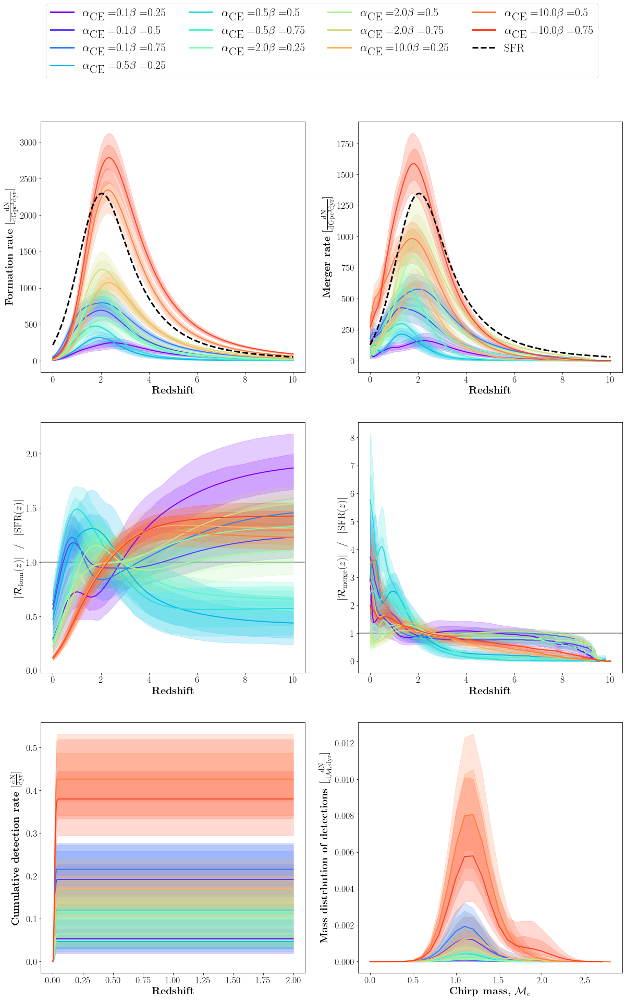

In [6]:
plot_rates_sfr_norm(condensed_paths, alpha_vals, beta_vals, dco_type='BNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription, n_iters=100)                               # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79246508.36427179 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                  

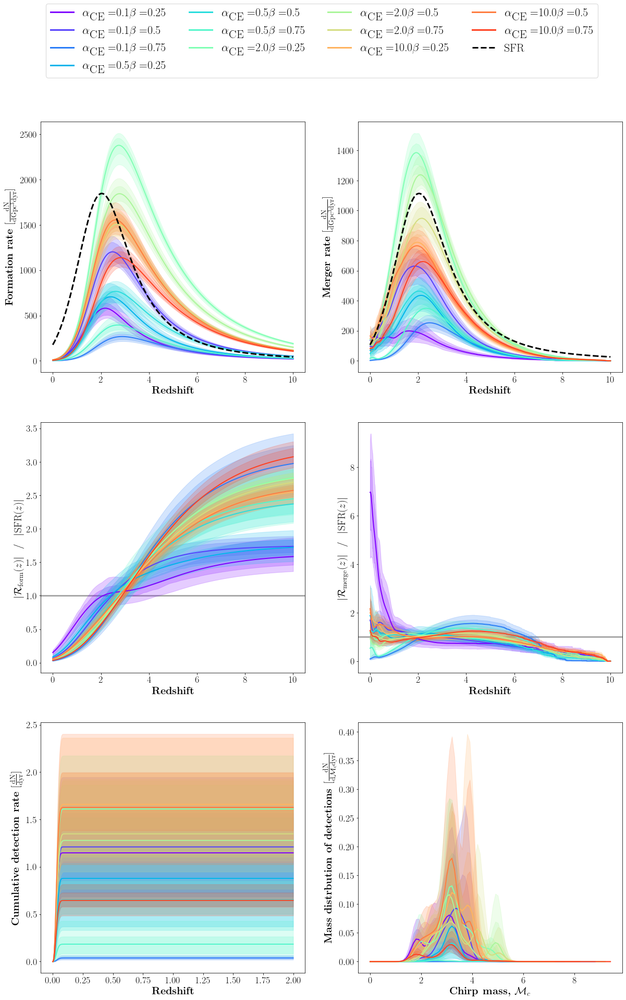

In [7]:
plot_rates_sfr_norm(condensed_paths, alpha_vals, beta_vals, dco_type='BHNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription, n_iters=100)                               # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

In [6]:
plot_rates_sfr_norm(condensed_paths, alpha_vals, beta_vals, dco_type='BBH', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription, n_iters=100)                               # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79456244.83272643 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                  

In [16]:
from scipy import stats

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79131358.49876727 solMass


/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_10046/986082049.py:92: RuntimeWarning: divide by zero encountered in log
  ae, loce, scalee = stats.skewnorm.fit(np.log(samples))


RuntimeError: The data contains non-finite values.

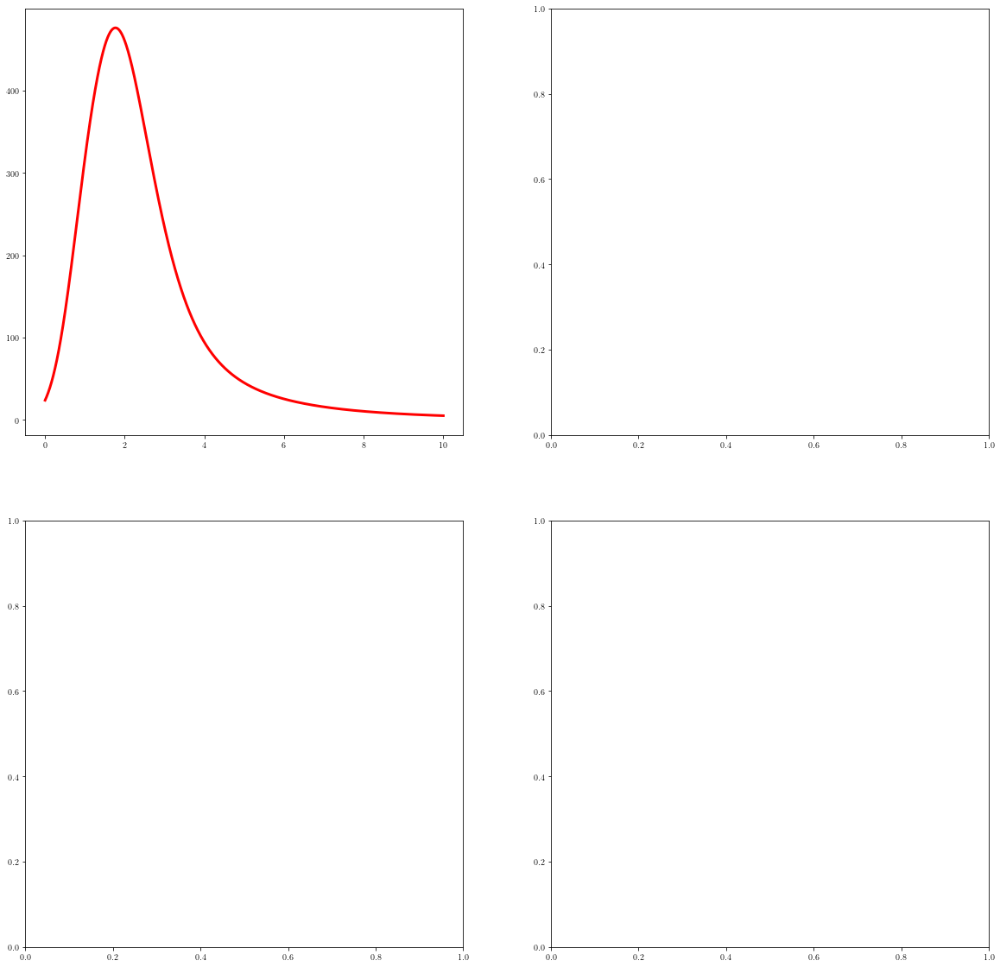

In [18]:
def plot_rates(condensed_paths, alpha_vals, beta_vals, dco_type=None, merger_output_filename=None, weight_column=None,
        merges_hubble_time=True, pessimistic_CEE=True, no_RLOF_after_CEE=True,
        max_redshift=10.0, max_redshift_detection=1.0, redshift_step=0.001, z_first_SF = 10,
        use_sampled_mass_ranges=True, m1_min=5 * u.Msun, m1_max=150 * u.Msun, m2_min=0.1 * u.Msun, fbin=1.0,
        aSF = 0.01, bSF = 2.77, cSF = 2.90, dSF = 4.70,
        mu0=0.035, muz=-0.23, sigma0=0.39,sigmaz=0., alpha=0.0, 
        min_logZ=-12.0, max_logZ=1.0, step_logZ=0.01,
        sensitivity="O1", snr_threshold=8, 
        Mc_max=300.0, Mc_step=0.1, eta_max=0.25, eta_step=0.01,
        snr_max=1000.0, snr_step=0.1, lw=3, fs = 24, 
        lognormal=False, Zprescription='MZ_GSMF', SFRprescription='Madau et al. (2017)',        # ADAM'S FIDUCIAL MSSFR PARAMETERS
        GSMFprescription='Panter et al. (2004) Single', ZMprescription='Ma et al. (2016)',      # ADAM'S FIDUCIAL MSSFR PARAMETERS
        logNormalPrescription=None):                                                            # ADAM'S FIDUCIAL MSSFR PARAMETERS
        
        assert dco_type != None, 'dco_type must be given'

        total_formation_rates = {}
        total_merger_rates = {}
        total_detection_rates = {}
        cumulative_detection_rates = {}
        detection_rates_by_binary = {}
        chirp_masses = {}

        redshifts = {}

        for alpha_index, alpha_val in enumerate(alpha_vals):
                # Make the dictionary "2D"
                total_formation_rates[alpha_val] = {}
                total_merger_rates[alpha_val] = {}
                total_detection_rates[alpha_val] = {}
                cumulative_detection_rates[alpha_val] = {}
                detection_rates_by_binary[alpha_val] = {}
                chirp_masses[alpha_val] = {}

                redshifts[alpha_val] = {}

                for beta_index, beta_val in enumerate(beta_vals):
                        detection_rates, formation_rates, merger_rates, redshifts[alpha_val][beta_val], COMPASs = \
                        FCI.find_detection_rate(
                        condensed_paths[alpha_val][beta_val], dco_type=dco_type, weight_column=weight_column,
                        merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
                        no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
                        max_redshift_detection=max_redshift_detection,
                        redshift_step=redshift_step, z_first_SF=z_first_SF,
                        m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
                        fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
                        mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
                        min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
                        sensitivity=sensitivity, snr_threshold=snr_threshold,
                        Mc_max=Mc_max, Mc_step=Mc_step,
                        eta_max=eta_max, eta_step=eta_step,
                        snr_max=snr_max, snr_step=snr_step, 
                        lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
                        GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
                        logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

                        chirp_masses[alpha_val][beta_val] = (COMPASs.mass1*COMPASs.mass2)**(3./5.) / (COMPASs.mass1 + COMPASs.mass2)**(1./5.)

                        # sum things up across binaries
                        total_formation_rates[alpha_val][beta_val] = np.sum(formation_rates, axis=0)
                        total_merger_rates[alpha_val][beta_val] = np.sum(merger_rates, axis=0)
                        total_detection_rates[alpha_val][beta_val] = np.sum(detection_rates, axis=0)

                        # and across redshifts
                        cumulative_detection_rates[alpha_val][beta_val] = np.cumsum(total_detection_rates[alpha_val][beta_val])
                        detection_rates_by_binary[alpha_val][beta_val] = np.sum(detection_rates, axis=1)

                        # empty trash
                        del detection_rates
                        del formation_rates
                        del merger_rates
                        del COMPASs

        ###########################
        #Start plotting
        fig, axes = plt.subplots(2, 2, figsize=(20, 20))

        for alpha_val in alpha_vals:
                for beta_val in beta_vals:
                        Mc_bins = np.arange(0,max(chirp_masses[alpha_val][beta_val])*1.3, max(chirp_masses[alpha_val][beta_val])*1.2/100)

                        axes[0,0].plot(redshifts[alpha_val][beta_val], total_formation_rates[alpha_val][beta_val], lw=lw, color='red')

                        # stats.uniform.rvs()


                        samples = np.random.choice(redshifts[alpha_val][beta_val], size=10000, p=total_formation_rates[alpha_val][beta_val]/np.sum(total_formation_rates[alpha_val][beta_val])) 

                        # rvs = stats.uniform().pdf(total_formation_rates[alpha_val][beta_val]/np.trapz(redshifts[alpha_val][beta_val], total_formation_rates[alpha_val][beta_val]))
                        # ae, loce, scalee = stats.skewnorm.fit(rvs)

                        ae, loce, scalee = stats.skewnorm.fit(samples)

                        fit = stats.skewnorm.pdf(redshifts[alpha_val][beta_val], ae, loc=loce, scale=scalee)
                        fit = fit/max(fit)
                        # param = scipy.stats.norm.fit(data)
                        

                        axes[0,0].plot(redshifts[alpha_val][beta_val], fit*max(total_formation_rates[alpha_val][beta_val]), color='green')

                        
                        axes[0,1].plot(redshifts[alpha_val][beta_val], total_merger_rates[alpha_val][beta_val], lw=lw, label=r'$\alpha_{\textrm{CE}} = $' + alpha_val + r'$\beta = $' + beta_val)
                        
                        axes[1,0].plot(redshifts[alpha_val][beta_val][:len(cumulative_detection_rates[alpha_val][beta_val])], cumulative_detection_rates[alpha_val][beta_val], lw=lw)

                        # Get the Hist
                        hist, _ = np.histogram(chirp_masses[alpha_val][beta_val], weights = detection_rates_by_binary[alpha_val][beta_val], bins=Mc_bins)
                        
                        # Calculate KDE
                        axis = np.arange(Mc_bins[0],Mc_bins[-1],0.1) # The x-axis for the chirp masses
                        # Get the KDE
                        mass_kde = FFTKDE(bw=0.2).fit(chirp_masses[alpha_val][beta_val], weights=detection_rates_by_binary[alpha_val][beta_val]).evaluate(axis)
                        # Normalize the KDE
                        mass_kde_scaled = mass_kde*sum(hist)*sum(hist)*np.diff(Mc_bins)[0] 
                        axes[1,1].plot(axis, mass_kde_scaled, lw=lw)
        
        # Label axes of all the plots
        axes[0,0].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
        axes[0,0].set_ylabel(r'\textbf{Formation rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$}', fontsize=fs)

        axes[0,1].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
        axes[0,1].set_ylabel(r'\textbf{Merger rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}Gpc^3 \mathrm{d}yr}]$}', fontsize=fs)

        axes[1,0].set_xlabel(r'\textbf{Redshift}', fontsize=fs)
        axes[1,0].set_ylabel(r'\textbf{Cumulative detection rate $[\rm \frac{\mathrm{d}N}{\mathrm{d}yr}]$}', fontsize=fs)

        axes[1,1].set_xlabel(r'\textbf{Chirp mass, $\mathcal{M}_c$}', fontsize=fs)
        axes[1,1].set_ylabel(r'\textbf{Mass distrbution of detections $[\rm \frac{\mathrm{d}N}{\mathrm{d}\mathcal{M}_c \mathrm{d}yr}]$}', fontsize=fs)

        # Set upper limit on x axis for chirp mass distribution
        xlims = axes[1,1].get_xlim()
        if xlims[1] >= 40:
                axes[1,1].set_xlim([xlims[0], 40])

        # Add text upper left corner
        if lognormal==False:
                axes[0,0].text(0.05,0.75, 
                        "mu0={} \nmuz={} \nsigma0={} \nsigmaz={} \nalpha={}".format(mu0,muz,sigma0,sigmaz,alpha), 
                        transform=axes[0,0].transAxes, size = fs) 

        for ax in axes.flatten():
                ax.tick_params(labelsize=0.9*fs)

        # Retreive the SFR
        MSSFR = ClassMSSFR.MSSFR()                                                      # Create an MSSFR object
        MSSFR.SFRprescription = SFRprescription                                         # Set SFR prescription
        ages = MSSFR.cosmology.age(redshifts[alpha_val][beta_val]).value                # Get the ages
        sfr = MSSFR.returnSFR(redshifts[alpha_val][beta_val], ages)                     # Get the SFR
        sfr = sfr/max(sfr)                                                              # Get peak to 1
        
        # Get constants for scaling SFR
        form_const, merger_const = axes[0,0].get_ylim()[1] * 0.7, axes[0,1].get_ylim()[1] * 0.7

        # Plot SFRs
        axes[0,0].plot(redshifts[alpha_val][beta_val], sfr * form_const, color='black', lw=lw, linestyle='dashed')
        axes[0,1].plot(redshifts[alpha_val][beta_val], sfr * merger_const, color='black', lw=lw, linestyle='dashed', label=r'SFR')

        # Include legend
        fig.legend(fontsize=22, ncol=4, bbox_to_anchor=(0.875, .99),  markerscale=25) 

        # Show the plot!
        plt.show()

plot_rates(condensed_paths, ['0.5'], ['0.5'], dco_type='BNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

# Plot $\frac{dR_{form}}{dt}_{z<z_\textrm{peak}}$, $z_\textrm{peak}$, and $\frac{dR_{form}}{dt}_{z>z_\textrm{peak}}$ for a grid of $\alpha_\textrm{CE}$ and $\beta$ values

In [14]:
def get_slopes_and_peak(redshifts, rate):
    """
        This function returns the slope up to the peak of the rate, the slope down from the peak of the rate, and the redshift at which the rate peaks.

        ...

        Parameters
        ----------
        redshifts : float array
            the redshifts corresponding to each rate value

        rate : float array
            the rate corresponding to each redshift value

        Returns
        ----------
        float
            the slope from z=0 to the peak of the rate

        float
            the slope from the peak of the rate to the maximum redshift

        float
            the redshift at which the rate peaks

    """

    # Get the index of the peak rate
    peak_index = np.argmax(rate)
    
    # Get the slope from z=0 to the peak and the slope from the peak to z=z_max
    slope_up = (rate[peak_index] - rate[0]) / (redshifts[peak_index] - redshifts[0])
    slope_down = (rate[-1] - rate[peak_index]) / (redshifts[-1] - redshifts[peak_index])
    
    # Get the redshift of the peak rate
    peak_redshift = redshifts[peak_index]


    return slope_up, peak_redshift, slope_down

## a) BNS

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78797007.1741536 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79034296.63443111 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79057536.23713315 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78996673.4424886 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78820387.3180673 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts

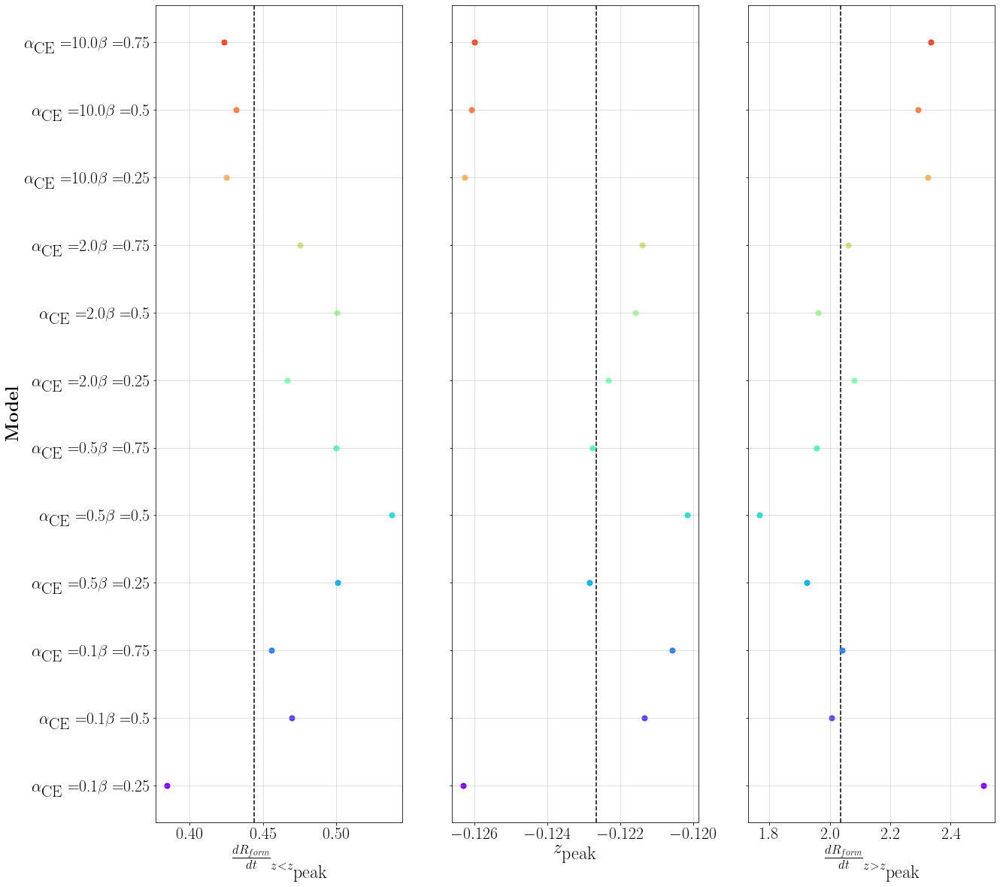

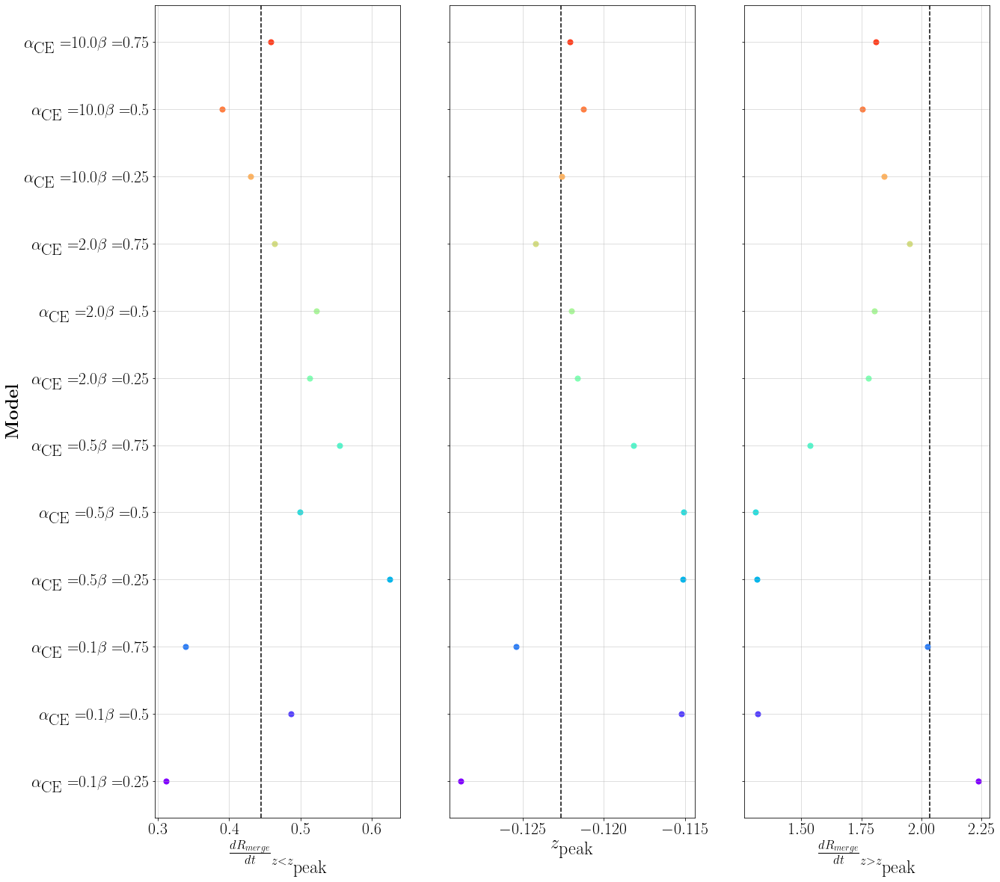

In [185]:
def plot_rates_slopes_and_peaks(condensed_paths, alpha_vals, beta_vals, color_grid, dco_type=None, merger_output_filename=None, weight_column=None,
        merges_hubble_time=True, pessimistic_CEE=True, no_RLOF_after_CEE=True,
        max_redshift=10.0, max_redshift_detection=1.0, redshift_step=0.001, z_first_SF = 10,
        use_sampled_mass_ranges=True, m1_min=5 * u.Msun, m1_max=150 * u.Msun, m2_min=0.1 * u.Msun, fbin=1.0,
        aSF = 0.01, bSF = 2.77, cSF = 2.90, dSF = 4.70,
        mu0=0.035, muz=-0.23, sigma0=0.39,sigmaz=0., alpha=0.0, 
        min_logZ=-12.0, max_logZ=1.0, step_logZ=0.01,
        sensitivity="O1", snr_threshold=8, 
        Mc_max=300.0, Mc_step=0.1, eta_max=0.25, eta_step=0.01,
        snr_max=1000.0, snr_step=0.1, lw=3, fs = 24, 
        lognormal=False, Zprescription='MZ_GSMF', SFRprescription='Madau et al. (2017)',        # ADAM'S FIDUCIAL MSSFR PARAMETERS
        GSMFprescription='Panter et al. (2004) Single', ZMprescription='Ma et al. (2016)',      # ADAM'S FIDUCIAL MSSFR PARAMETERS
        logNormalPrescription=None):                                                            # ADAM'S FIDUCIAL MSSFR PARAMETERS
        
        assert dco_type != None, 'dco_type must be given'

        total_formation_rates = {}
        total_merger_rates = {}
        total_detection_rates = {}
        cumulative_detection_rates = {}
        detection_rates_by_binary = {}
        chirp_masses = {}

        redshifts = {}

        for alpha_index, alpha_val in enumerate(alpha_vals):
                # Make the dictionary "2D"
                total_formation_rates[alpha_val] = {}
                total_merger_rates[alpha_val] = {}
                total_detection_rates[alpha_val] = {}
                cumulative_detection_rates[alpha_val] = {}
                detection_rates_by_binary[alpha_val] = {}
                chirp_masses[alpha_val] = {}

                redshifts[alpha_val] = {}

                for beta_index, beta_val in enumerate(beta_vals):
                        _, formation_rates, merger_rates, redshifts[alpha_val][beta_val], COMPASs = \
                        FCI.find_detection_rate(
                        condensed_paths[alpha_val][beta_val], dco_type=dco_type, weight_column=weight_column,
                        merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
                        no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
                        max_redshift_detection=max_redshift_detection,
                        redshift_step=redshift_step, z_first_SF=z_first_SF,
                        m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
                        fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
                        mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
                        min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
                        sensitivity=sensitivity, snr_threshold=snr_threshold,
                        Mc_max=Mc_max, Mc_step=Mc_step,
                        eta_max=eta_max, eta_step=eta_step,
                        snr_max=snr_max, snr_step=snr_step, 
                        lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
                        GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
                        logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

                        # sum things up across binaries
                        total_formation_rates[alpha_val][beta_val] = np.sum(formation_rates, axis=0)
                        total_merger_rates[alpha_val][beta_val] = np.sum(merger_rates, axis=0)

                        # empty trash
                        del formation_rates
                        del merger_rates
                        del COMPASs

        ###########################
        #Start plotting
        formation_fig, formation_axes = plt.subplots(1, 3, figsize=(20, 20))

        formation_axes[0].grid(alpha=0.5)
        formation_axes[1].grid(alpha=0.5)
        formation_axes[2].grid(alpha=0.5)

        # Retreive the SFR
        MSSFR = ClassMSSFR.MSSFR()                                                      # Create an MSSFR object
        MSSFR.SFRprescription = SFRprescription                                         # Set SFR prescription
        ages = MSSFR.cosmology.age(redshifts[alpha_val][beta_val]).value                # Get the ages
        sfr = MSSFR.returnSFR(redshifts[alpha_val][beta_val], ages)                     # Get the SFR

        sfr_slope_up, sfr_peak_redshift, sfr_slope_down = get_slopes_and_peak(redshifts[alpha_val][beta_val], sfr/max(sfr))


        index = 0
        labels = []
        label_indexs = []
        for alpha_val in alpha_vals:
                for beta_val in beta_vals:
                        slope_up, peak_redshift, slope_down = get_slopes_and_peak(redshifts[alpha_val][beta_val], total_formation_rates[alpha_val][beta_val]/max(total_formation_rates[alpha_val][beta_val]))

                        formation_axes[0].scatter(slope_up, index, s=50, color=color_grid[alpha_val][beta_val])

                        formation_axes[1].scatter(peak_redshift, index, s=50, color=color_grid[alpha_val][beta_val])

                        formation_axes[2].scatter(slope_down, index, s=50, color=color_grid[alpha_val][beta_val])

                        labels.append(r'$\alpha_{\textrm{CE}} = $' + alpha_val + r'$\beta = $' + beta_val)
                        label_indexs.append(index)

                        index+=1
        
        formation_axes[0].axvline(x=sfr_slope_up, linestyle='--', color='black', zorder=-1)
        formation_axes[1].axvline(x=sfr_peak_redshift, linestyle='--', color='black', zorder=-1)
        formation_axes[2].axvline(x=sfr_slope_down, linestyle='--', color='black', zorder=-1)

        # Label axes of all the plots
        formation_axes[0].set_xlabel(r'$\frac{dR_{form}}{dt}_{z<z_\textrm{peak}}$', fontsize=fs)
        formation_axes[0].set_ylabel(r'\textbf{Model}', fontsize=fs)
        formation_axes[1].set_xlabel(r'$z_\textrm{peak}$', fontsize=fs)
        formation_axes[2].set_xlabel(r'$\frac{dR_{form}}{dt}_{z>z_\textrm{peak}}$', fontsize=fs)

        for ax_index, ax in enumerate(formation_axes.flatten()):
                ax.tick_params(labelsize=0.9*fs)
                ax.set_yticks(label_indexs)
                if ax_index == 0:       
                        ax.set_yticklabels(labels)
                else:
                        ax.set_yticklabels(['' for i in range(len(labels))])

        # Show the plot!
        plt.savefig('/Users/adamboesky/Research/PRISE/exploring_parameter_space/Data_Analysis/Figures/Rates_Slopes_and_Peaks/'+ dco_type + '_Formation_Rate_Slope_and_Peak.png')
        plt.show()

        #Start plotting
        merge_figure, merge_axes = plt.subplots(1, 3, figsize=(20, 20))

        merge_axes[0].grid(alpha=0.5)
        merge_axes[1].grid(alpha=0.5)
        merge_axes[2].grid(alpha=0.5)

        index = 0
        labels = []
        label_indexs = []
        for alpha_val in alpha_vals:
                for beta_val in beta_vals:
                        slope_up, peak_redshift, slope_down = get_slopes_and_peak(redshifts[alpha_val][beta_val], total_merger_rates[alpha_val][beta_val]/max(total_merger_rates[alpha_val][beta_val]))

                        merge_axes[0].scatter(slope_up, index, s=50, color=color_grid[alpha_val][beta_val])

                        merge_axes[1].scatter(peak_redshift, index, s=50, color=color_grid[alpha_val][beta_val])

                        merge_axes[2].scatter(slope_down, index, s=50, color=color_grid[alpha_val][beta_val])

                        labels.append(r'$\alpha_{\textrm{CE}} = $' + alpha_val + r'$\beta = $' + beta_val)
                        label_indexs.append(index)

                        index+=1
        
        merge_axes[0].axvline(x=sfr_slope_up, linestyle='--', color='black', zorder=-1)
        merge_axes[1].axvline(x=sfr_peak_redshift, linestyle='--', color='black', zorder=-1)
        merge_axes[2].axvline(x=sfr_slope_down, linestyle='--', color='black', zorder=-1)

        # Label axes of all the plots
        merge_axes[0].set_xlabel(r'$\frac{dR_{merge}}{dt}_{z<z_\textrm{peak}}$', fontsize=fs)
        merge_axes[0].set_ylabel(r'\textbf{Model}', fontsize=fs)
        merge_axes[1].set_xlabel(r'$z_\textrm{peak}$', fontsize=fs)
        merge_axes[2].set_xlabel(r'$\frac{dR_{merge}}{dt}_{z>z_\textrm{peak}}$', fontsize=fs)

        for ax_index, ax in enumerate(merge_axes.flatten()):
                ax.tick_params(labelsize=0.9*fs)
                ax.set_yticks(label_indexs)
                if ax_index == 0:       
                        ax.set_yticklabels(labels)
                else:
                        ax.set_yticklabels(['' for i in range(len(labels))])

        # Show the plot!
        plt.savefig('/Users/adamboesky/Research/PRISE/exploring_parameter_space/Data_Analysis/Figures/Rates_Slopes_and_Peaks/'+ dco_type + '_Merger_Rate_Slope_and_Peak.png')
        plt.show()


plot_rates_slopes_and_peaks(condensed_paths, alpha_vals, beta_vals, color_grid=color_grid, dco_type='BNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

## b) BHNS

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79183041.59973747 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78735618.30239229 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79248957.36650434 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79140781.5443292 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79490262.651698 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts

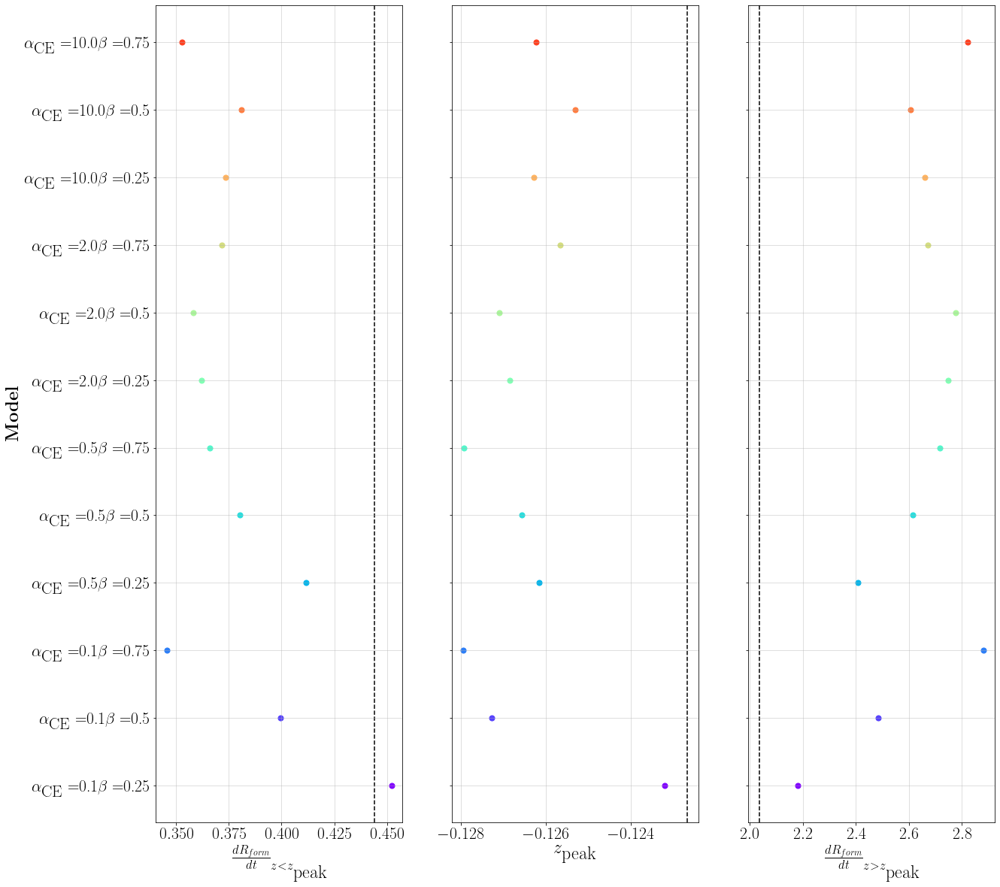

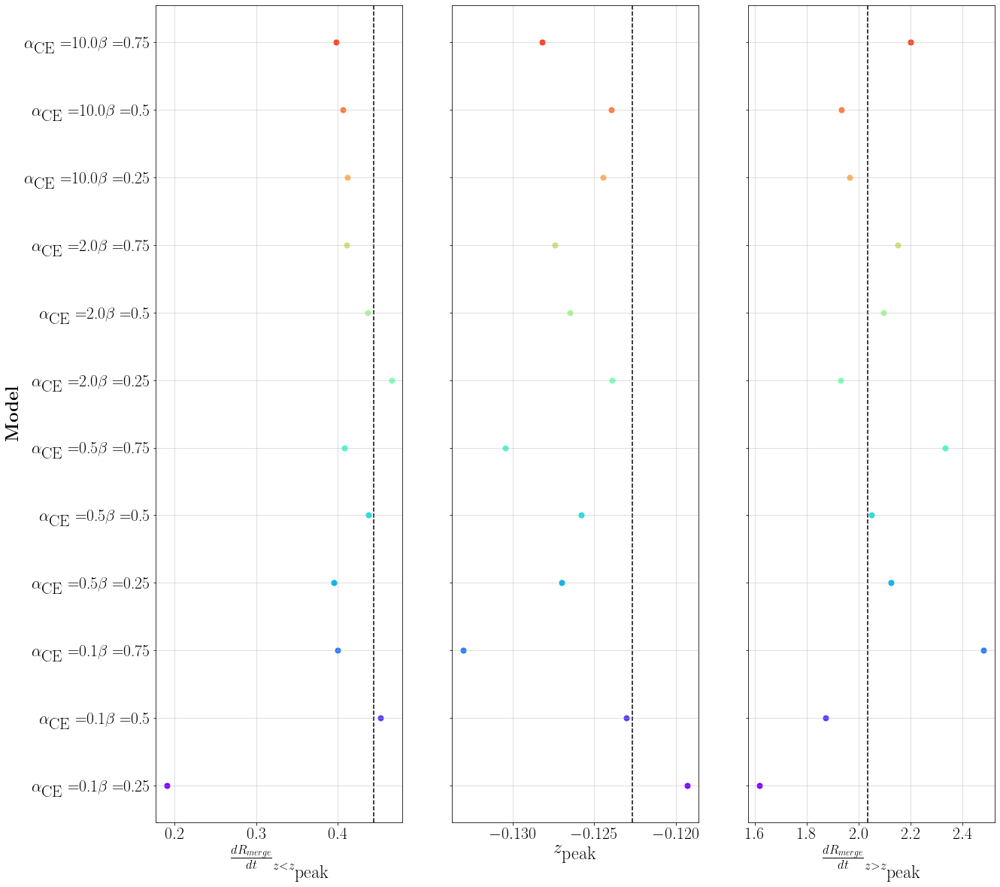

In [182]:
plot_rates_slopes_and_peaks(condensed_paths, alpha_vals, beta_vals, color_grid=color_grid, dco_type='BHNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

## c) BBH

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79354885.3744361 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79086017.47660798 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78919533.11041267 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79002722.18228918 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79074892.71081802 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-par

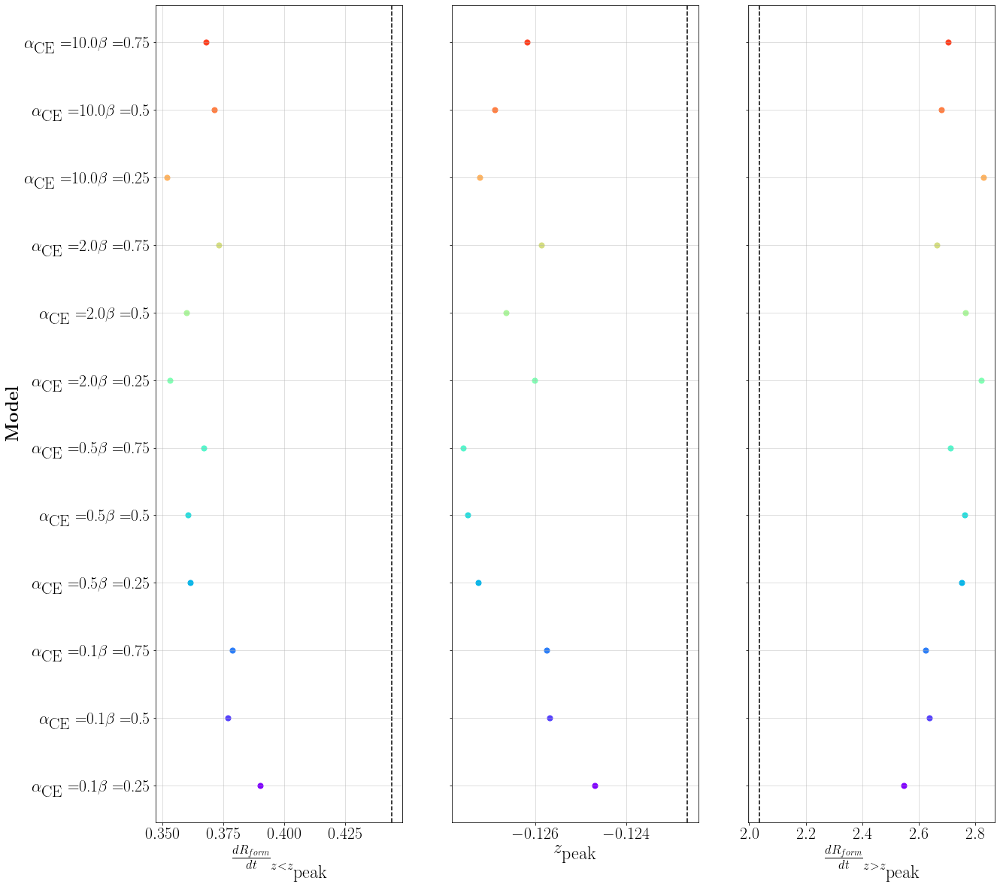

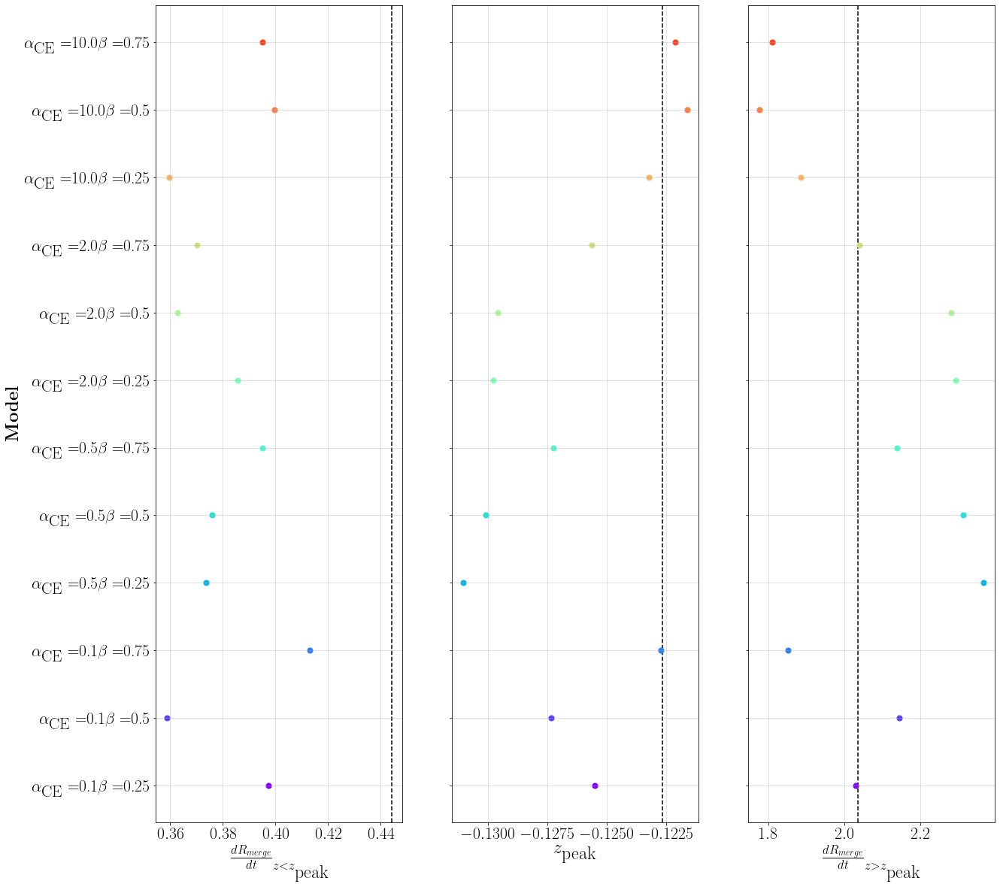

In [183]:
plot_rates_slopes_and_peaks(condensed_paths, alpha_vals, beta_vals, color_grid=color_grid, dco_type='BBH', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

# Plot the $\kappa$ of the best fit power law to $R_\textrm{form}$ and $R_\textrm{merge}$ for a grid of $\alpha_{CE}$ and $\beta$

In [233]:
def power_law(z, kappa, alpha):
    return alpha * (1+z) ** kappa

def get_kappa_and_peak(redshifts, rate, bound='max'):

    # Get the index of the maximum rate
    max_index = np.argmax(rate)

    # Get the peak redshift
    peak_z = redshifts[max_index]
    
    # Here we check which method we are going to use to bound the fit
    if bound=='max':    

        # Fit the data
        params_est, params_cov = curve_fit(lambda bound_redshifts, kappa: power_law(bound_redshifts, kappa, R0), redshifts[:max_index], sfr[:max_index]/sfr[max_index])

    elif bound=='O4':

        # Get a mask for 04
        mask = redshifts <= 2.0

        # Fit the data
        params_est, params_cov = curve_fit(lambda bound_redshifts, kappa: power_law(bound_redshifts, kappa, R0), redshifts[mask], sfr[mask]/sfr[max_index])

    elif bound=='O3':

        # Get a mask for 03
        mask = redshifts <= 1.5

        # Fit the data
        params_est, params_cov = curve_fit(lambda bound_redshifts, kappa: power_law(bound_redshifts, kappa, R0), redshifts[mask], sfr[mask]/sfr[max_index])


    # Get the fitted parameters
    kappa_est = params_est[0]
    # alpha_est = params_est[1]

    # Get the standard error
    std_errs = np.sqrt(np.diag(params_cov))
    kappa_est_std_dev = std_errs[0] * np.sqrt(len(redshifts[:max_index]))
    # alpha_est_std_err = std_errs[1]

    return kappa_est, peak_z, kappa_est_std_dev

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  78922364.96643203 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79223287.46126647 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79126105.36252947 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79185674.52834229 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79297786.48805779 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-pa

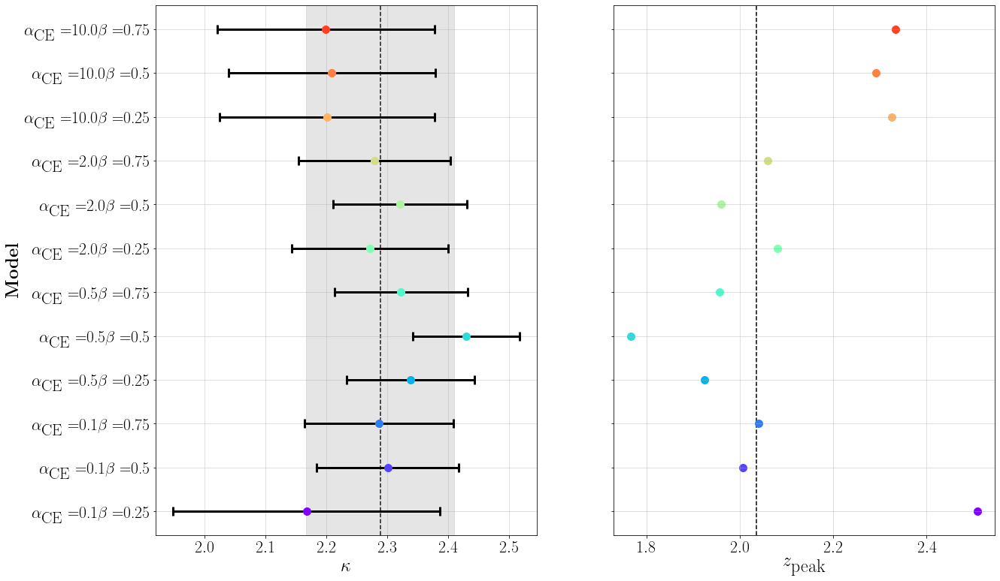

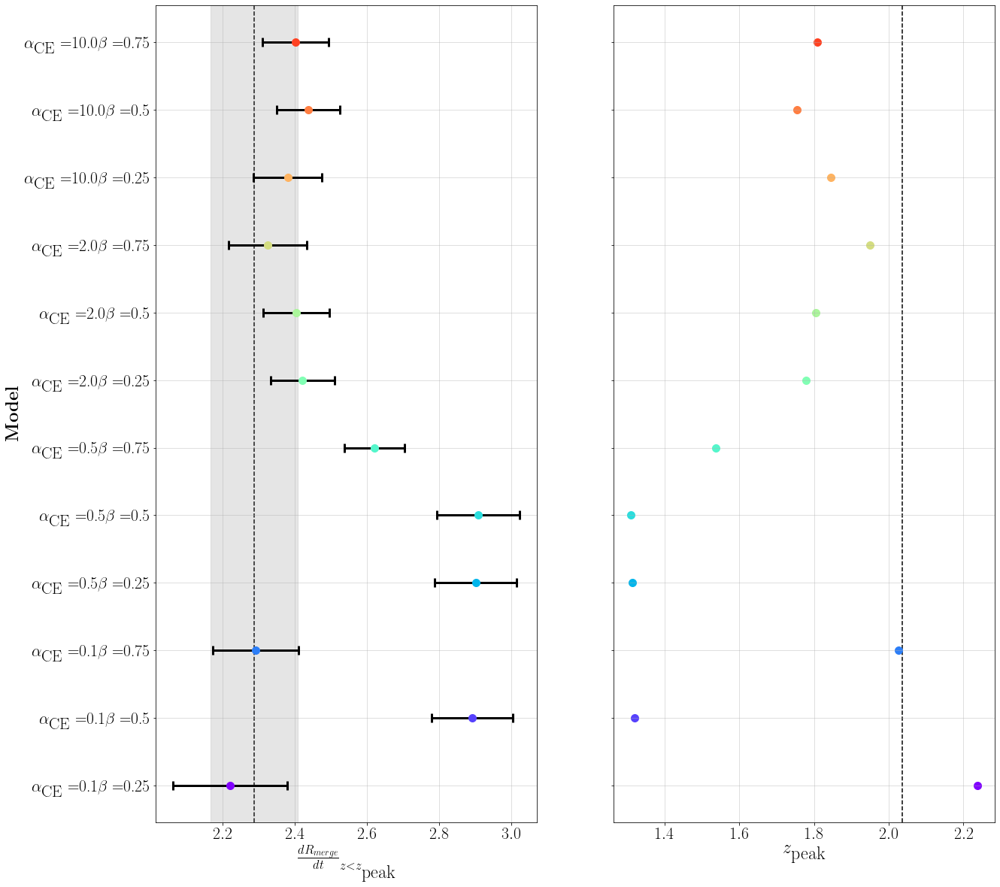

In [231]:
def plot_rates_kappa_and_peaks(condensed_paths, alpha_vals, beta_vals, color_grid, dco_type=None, merger_output_filename=None, weight_column=None,
        merges_hubble_time=True, pessimistic_CEE=True, no_RLOF_after_CEE=True,
        max_redshift=10.0, max_redshift_detection=1.0, redshift_step=0.001, z_first_SF = 10,
        use_sampled_mass_ranges=True, m1_min=5 * u.Msun, m1_max=150 * u.Msun, m2_min=0.1 * u.Msun, fbin=1.0,
        aSF = 0.01, bSF = 2.77, cSF = 2.90, dSF = 4.70,
        mu0=0.035, muz=-0.23, sigma0=0.39,sigmaz=0., alpha=0.0, 
        min_logZ=-12.0, max_logZ=1.0, step_logZ=0.01,
        sensitivity="O1", snr_threshold=8, 
        Mc_max=300.0, Mc_step=0.1, eta_max=0.25, eta_step=0.01,
        snr_max=1000.0, snr_step=0.1, lw=3, fs = 24, 
        lognormal=False, Zprescription='MZ_GSMF', SFRprescription='Madau et al. (2017)',        # ADAM'S FIDUCIAL MSSFR PARAMETERS
        GSMFprescription='Panter et al. (2004) Single', ZMprescription='Ma et al. (2016)',      # ADAM'S FIDUCIAL MSSFR PARAMETERS
        logNormalPrescription=None):                                                            # ADAM'S FIDUCIAL MSSFR PARAMETERS
        
        assert dco_type != None, 'dco_type must be given'

        total_formation_rates = {}
        total_merger_rates = {}
        total_detection_rates = {}
        cumulative_detection_rates = {}
        detection_rates_by_binary = {}
        chirp_masses = {}

        redshifts = {}

        for alpha_index, alpha_val in enumerate(alpha_vals):
                # Make the dictionary "2D"
                total_formation_rates[alpha_val] = {}
                total_merger_rates[alpha_val] = {}
                total_detection_rates[alpha_val] = {}
                cumulative_detection_rates[alpha_val] = {}
                detection_rates_by_binary[alpha_val] = {}
                chirp_masses[alpha_val] = {}

                redshifts[alpha_val] = {}

                for beta_index, beta_val in enumerate(beta_vals):
                        _, formation_rates, merger_rates, redshifts[alpha_val][beta_val], COMPASs = \
                        FCI.find_detection_rate(
                        condensed_paths[alpha_val][beta_val], dco_type=dco_type, weight_column=weight_column,
                        merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
                        no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
                        max_redshift_detection=max_redshift_detection,
                        redshift_step=redshift_step, z_first_SF=z_first_SF,
                        m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
                        fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
                        mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
                        min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
                        sensitivity=sensitivity, snr_threshold=snr_threshold,
                        Mc_max=Mc_max, Mc_step=Mc_step,
                        eta_max=eta_max, eta_step=eta_step,
                        snr_max=snr_max, snr_step=snr_step, 
                        lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
                        GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
                        logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

                        # sum things up across binaries
                        total_formation_rates[alpha_val][beta_val] = np.sum(formation_rates, axis=0)
                        total_merger_rates[alpha_val][beta_val] = np.sum(merger_rates, axis=0)

                        # empty trash
                        del formation_rates
                        del merger_rates
                        del COMPASs

        ###########################
        #Start plotting
        formation_fig, formation_axes = plt.subplots(1, 2, figsize=(20, 13))

        # Make grid in background
        formation_axes[0].grid(alpha=0.5, zorder=-1)
        formation_axes[1].grid(alpha=0.5, zorder=-1)

        # Retreive the SFR
        MSSFR = ClassMSSFR.MSSFR()                                                      # Create an MSSFR object
        MSSFR.SFRprescription = SFRprescription                                         # Set SFR prescription
        ages = MSSFR.cosmology.age(redshifts[alpha_val][beta_val]).value                # Get the ages
        sfr = MSSFR.returnSFR(redshifts[alpha_val][beta_val], ages)                     # Get the SFR

        sfr_kappa, sfr_peak_redshift, sfr_kappa_std_dev = get_kappa_and_peak(redshifts[alpha_val][beta_val], sfr/max(sfr))


        index = 0
        labels = []
        label_indexs = []
        for alpha_val in alpha_vals:
                for beta_val in beta_vals:
                        kappa, peak_redshift, kappa_std_dev = get_kappa_and_peak(redshifts[alpha_val][beta_val], total_formation_rates[alpha_val][beta_val])

                        formation_axes[0].errorbar(x=kappa, y=index, markersize=10, capthick=lw, xerr=kappa_std_dev, color='black', lw=lw, capsize=2*lw, marker='o', mfc=color_grid[alpha_val][beta_val], mec = color_grid[alpha_val][beta_val])

                        formation_axes[1].scatter(peak_redshift, index, s=100, color=color_grid[alpha_val][beta_val], alpha=1)

                        labels.append(r'$\alpha_{\textrm{CE}} = $' + alpha_val + r'$\beta = $' + beta_val)
                        label_indexs.append(index)

                        index+=1
        
        formation_axes[0].axvline(x=sfr_kappa, linestyle='--', color='black', zorder=-1)
        formation_axes[0].axvspan(sfr_kappa - sfr_kappa_std_dev, sfr_kappa + sfr_kappa_std_dev, color='gray', alpha=0.2)
        formation_axes[1].axvline(x=sfr_peak_redshift, linestyle='--', color='black', zorder=-1)

        # Label axes of all the plots
        formation_axes[0].set_xlabel(r'$\kappa$', fontsize=fs)
        formation_axes[0].set_ylabel(r'\textbf{Model}', fontsize=fs)
        formation_axes[1].set_xlabel(r'$z_\textrm{peak}$', fontsize=fs)
        # formation_axes[2].set_xlabel(r'$\frac{dR_{form}}{dt}_{z>z_\textrm{peak}}$', fontsize=fs)

        for ax_index, ax in enumerate(formation_axes.flatten()):
                ax.tick_params(labelsize=0.9*fs)
                ax.set_yticks(label_indexs)
                if ax_index == 0:       
                        ax.set_yticklabels(labels)
                else:
                        ax.set_yticklabels(['' for i in range(len(labels))])

        # Show the plot!
        plt.savefig('/Users/adamboesky/Research/PRISE/exploring_parameter_space/Data_Analysis/Figures/Rates_Kappas_and_Peaks/'+ dco_type + '_Formation_Kappa_and_Peak.png')
        plt.show()

        

        #Start plotting
        merge_figure, merge_axes = plt.subplots(1, 2, figsize=(20, 13))

        # Make grid in background
        merge_axes[0].grid(alpha=0.5, zorder=-1)
        merge_axes[1].grid(alpha=0.5, zorder=-1)

        index = 0
        labels = []
        label_indexs = []
        for alpha_val in alpha_vals:
                for beta_val in beta_vals:
                        kappa, peak_redshift, kappa_std_dev = get_kappa_and_peak(redshifts[alpha_val][beta_val], total_merger_rates[alpha_val][beta_val])

                        merge_axes[0].errorbar(x=kappa, y=index, markersize=10, capthick=lw, xerr=kappa_std_dev, color='black', lw=lw, capsize=2*lw, marker='o', mfc=color_grid[alpha_val][beta_val], mec = color_grid[alpha_val][beta_val])

                        merge_axes[1].scatter(peak_redshift, index, s=100, color=color_grid[alpha_val][beta_val], alpha=1)

                        labels.append(r'$\alpha_{\textrm{CE}} = $' + alpha_val + r'$\beta = $' + beta_val)
                        label_indexs.append(index)

                        index+=1
        
        merge_axes[0].axvline(x=sfr_kappa, linestyle='--', color='black', zorder=-1)
        merge_axes[0].axvspan(sfr_kappa - sfr_kappa_std_dev, sfr_kappa + sfr_kappa_std_dev, color='gray', alpha=0.2)
        merge_axes[1].axvline(x=sfr_peak_redshift, linestyle='--', color='black', zorder=-1)
        # merge_axes[2].axvline(x=sfr_slope_down, linestyle='--', color='black', zorder=-1)

        # Label axes of all the plots
        merge_axes[0].set_xlabel(r'$\frac{dR_{merge}}{dt}_{z<z_\textrm{peak}}$', fontsize=fs)
        merge_axes[0].set_ylabel(r'\textbf{Model}', fontsize=fs)
        merge_axes[1].set_xlabel(r'$z_\textrm{peak}$', fontsize=fs)
        # merge_axes[2].set_xlabel(r'$\frac{dR_{merge}}{dt}_{z>z_\textrm{peak}}$', fontsize=fs)

        for ax_index, ax in enumerate(merge_axes.flatten()):
                ax.tick_params(labelsize=0.9*fs)
                ax.set_yticks(label_indexs)
                if ax_index == 0:       
                        ax.set_yticklabels(labels)
                else:
                        ax.set_yticklabels(['' for i in range(len(labels))])

        # Show the plot!
        plt.savefig('/Users/adamboesky/Research/PRISE/exploring_parameter_space/Data_Analysis/Figures/Rates_Kappas_and_Peaks/'+ dco_type + '_Merger_Kappa_and_Peak.png')
        plt.show()


plot_rates_kappa_and_peaks(condensed_paths, alpha_vals, beta_vals, color_grid=color_grid, dco_type='BNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

In [166]:
def power_law(z, kappa, alpha):
    return alpha * (1+z) ** kappa

In [168]:
_, formation_rates, merger_rates, redshifts, COMPASs = \
                FCI.find_detection_rate(
                condensed_paths['0.5']['0.75'], dco_type='BNS', weight_column=weight_column,
                merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
                no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
                max_redshift_detection=max_redshift_detection,
                redshift_step=redshift_step, z_first_SF=z_first_SF,
                m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
                fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
                mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
                min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
                sensitivity=sensitivity, snr_threshold=snr_threshold,
                Mc_max=Mc_max, Mc_step=Mc_step,
                eta_max=eta_max, eta_step=eta_step,
                snr_max=snr_max, snr_step=snr_step, 
                lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
                GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
                logNormalPrescription=logNormalPrescription)                                            # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

# sum things up across binaries
total_formation_rate = np.sum(formation_rates, axis=0)
total_merger_rate = np.sum(merger_rates, axis=0)

# empty trash
del formation_rates
del merger_rates
del COMPASs



ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79288542.82396106 solMass


In [423]:
def brkn_pow_law(redshifts, kappa0, kappa1, max_index, R0):
    
    # Data broken up
    broken_redshifts = [redshifts[:max_index], redshifts[max_index:]]

    # Calculate the rate
    rate0 = R0 * (1+broken_redshifts[0]) ** kappa0
    rate1 = (1+broken_redshifts[1]) ** kappa1
    # rate = np.concatenate((rate, R0 * (1+broken_redshifts[0][-1])**(kappa0-kappa1) * (1+broken_redshifts[1]) ** kappa1))
    # rate = np.concatenate((rate, R0 * (1+broken_redshifts[0][-1])**(kappa0-kappa1) * (1+broken_redshifts[1][-1])**(kappa1-kappa2) * (1+broken_redshifts[2]) ** kappa2))
    rate = np.concatenate((rate0, rate1 * np.abs(rate0[-1] / rate1[0])))

    return rate


def get_kappa_and_peak(redshifts, rate):

    # Get the index of the maximum rate
    max_index = np.argmax(rate)

    # Get the peak redshift
    peak_z = redshifts[max_index]

    # Get intrinsic rate
    R0 = rate[0]

    # Index of the first break
    break_index=int(max_index / 2)
    
    # Fit the data
    kappas, params_cov = curve_fit(lambda zs, kappa0, kappa1: brkn_pow_law(zs, kappa0, kappa1, max_index, R0), redshifts, rate)


    return kappas, peak_z

In [5]:
def dbl_brkn_pow_law(redshifts, kappa0, kappa1, kappa2, break_index, max_index, R0):
    
    # Data broken up
    broken_redshifts = [redshifts[:break_index], redshifts[break_index:max_index], redshifts[max_index:]]

    # Calculate the rate
    rate0 = R0 * (1+broken_redshifts[0]) ** kappa0
    rate1 = (1+broken_redshifts[1]) ** kappa1
    rate2 = (1+broken_redshifts[2]) ** kappa2
    # rate = np.concatenate((rate, R0 * (1+broken_redshifts[0][-1])**(kappa0-kappa1) * (1+broken_redshifts[1]) ** kappa1))
    # rate = np.concatenate((rate, R0 * (1+broken_redshifts[0][-1])**(kappa0-kappa1) * (1+broken_redshifts[1][-1])**(kappa1-kappa2) * (1+broken_redshifts[2]) ** kappa2))
    rate = np.concatenate((rate0, rate1 * np.abs(rate0[-1] / rate1[0])))
    rate = np.concatenate((rate, rate2 * np.abs(rate[-1] / rate2[0])))

    return rate


def dbl_get_kappa_and_peak(redshifts, rate):

    # Get the index of the maximum rate
    max_index = np.argmax(rate)

    # Get the peak redshift
    peak_z = redshifts[max_index]

    # Get intrinsic rate
    R0 = rate[0]

    # Index of the first break
    break_index=int(max_index / 2)
    
    # Fit the data
    kappas, params_cov = curve_fit(lambda zs, kappa0, kappa1, kappa2: dbl_brkn_pow_law(zs, kappa0, kappa1, kappa2, break_index, max_index, R0), redshifts, rate)


    return kappas, peak_z

In [425]:
def trpl_brkn_pow_law(redshifts, kappa0, kappa1, kappa2, kappa3, break_index1, break_index2, max_index, R0):
    
    # Data broken up
    broken_redshifts = [redshifts[:break_index1], redshifts[break_index1:break_index2], redshifts[break_index2:max_index], redshifts[max_index:]]

    # Calculate the rate
    rate0 = R0 * (1+broken_redshifts[0]) ** kappa0
    rate1 = (1+broken_redshifts[1]) ** kappa1
    rate2 = (1+broken_redshifts[2]) ** kappa2
    rate3 = (1+broken_redshifts[3]) ** kappa3
    # rate = R0 * (1+broken_redshifts[0]) ** kappa0
    # rate = np.concatenate((rate, R0 * (1+broken_redshifts[0][-1])**(kappa0-kappa1) * (1+broken_redshifts[1]) ** kappa1))
    # rate = np.concatenate((rate, R0 * (1+broken_redshifts[0][-1])**(kappa0-kappa1) * (1+broken_redshifts[1][-1])**(kappa1-kappa2) * (1+broken_redshifts[2]) ** kappa2))
    # rate = np.concatenate((rate, R0 * (1+broken_redshifts[0][-1])**(kappa0-kappa1) * (1+broken_redshifts[1][-1])**(kappa1-kappa2) * (1+broken_redshifts[2][-1])**(kappa2-kappa3) * (1+broken_redshifts[3]) ** kappa3))
    rate = np.concatenate((rate0, rate1 * np.abs(rate0[-1] / rate1[0])))
    rate = np.concatenate((rate, rate2 * np.abs(rate[-1] / rate2[0])))
    rate = np.concatenate((rate, rate3 * np.abs(rate[-1] / rate3[0])))

    return rate


def trpl_get_kappa_and_peak(redshifts, rate):

    # Get the index of the maximum rate
    max_index = np.argmax(rate)

    # Get the peak redshift
    peak_z = redshifts[max_index]
    
    # Get intrinsic rate
    R0 = rate[0]

    # Index of the first break
    break_index1=int(max_index*(1/3))
    break_index2=int(max_index*(2/3))
    
    # Fit the data
    kappas, params_cov = curve_fit(lambda zs, kappa0, kappa1, kappa2, kappa3: trpl_brkn_pow_law(zs, kappa0, kappa1, kappa2, kappa3, break_index1, break_index2, max_index, R0), redshifts, rate)


    return kappas, peak_z

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
                            set self.calculateMetallicityBinEdges()
2.5441757126085327 1.7862944455021035 -2.438519695011419


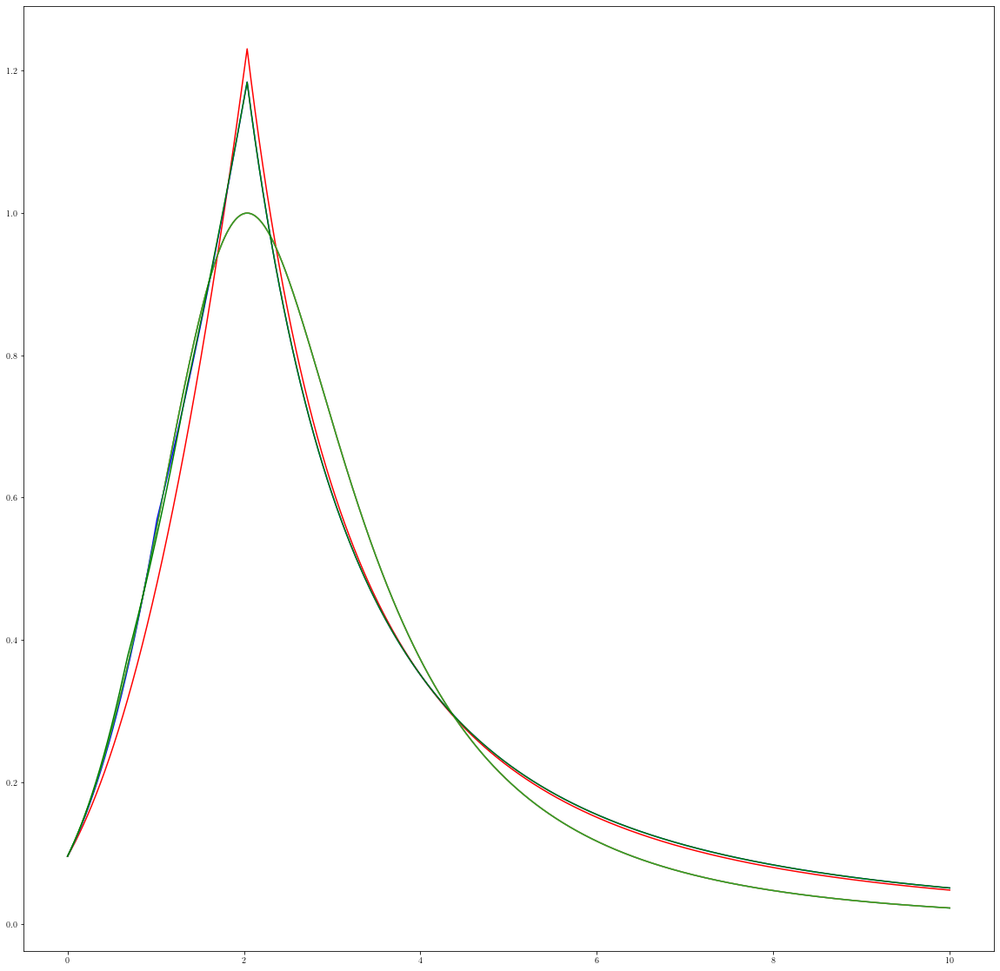

In [421]:
fig, ax = plt.subplots(1, figsize=(20,20))

# ax.set_yscale('log')

# Retreive the SFR
MSSFR = ClassMSSFR.MSSFR()                                                      # Create an MSSFR object
MSSFR.SFRprescription = SFRprescription                                         # Set SFR prescription
ages = MSSFR.cosmology.age(redshifts).value                                     # Get the ages
sfr = MSSFR.returnSFR(redshifts, ages)                                          # Get the SFR



####################
# Get single
kappas, peak_Z = get_kappa_and_peak(redshifts, sfr)
kappa0 = kappas[0]
kappa1 = kappas[1]

R0=(sfr/max(sfr))[0]
ax.plot(redshifts, sfr/max(sfr))

# Get the index of the maximum rate
max_index = np.argmax(sfr)

# Index of the first break
break_index=int(max_index / 2)

ax.plot(redshifts, brkn_pow_law(redshifts, kappa0, kappa1, max_index, R0), color='red')





#####################
# Get Double
kappas, peak_Z = dbl_get_kappa_and_peak(redshifts, sfr)
kappa0 = kappas[0]
kappa1 = kappas[1]
kappa2 = kappas[2]
# alpha1 = kappas[3]
# alpha2 = kappas[4]

R0=(sfr/max(sfr))[0]
ax.plot(redshifts, sfr/max(sfr))

# Get the index of the maximum rate
max_index = np.argmax(sfr)

# Index of the first break
break_index=int(max_index / 2)

ax.plot(redshifts, dbl_brkn_pow_law(redshifts, kappa0, kappa1, kappa2, break_index, max_index, R0), color='blue')
print(kappa0, kappa1, kappa2)


#######################
# Get Triple
kappas, peak_Z = trpl_get_kappa_and_peak(redshifts, sfr)
kappa0 = kappas[0]
kappa1 = kappas[1]
kappa2 = kappas[2]
kappa3 = kappas[3]

R0=(sfr/max(sfr))[0]
ax.plot(redshifts, sfr/max(sfr))

# Get the index of the maximum rate
max_index = np.argmax(sfr)

# Index of the first break
break_index=int(max_index / 2)

# ax.plot(redshifts[:break_index], power_law(redshifts[:break_index], kappas[0], R0))

# Index of the first break
break_index1=int(max_index*(1/3))
break_index2=int(max_index*(2/3))

ax.plot(redshifts, trpl_brkn_pow_law(redshifts, kappa0, kappa1, kappa2, kappa3, break_index1, break_index2, max_index, R0), color='green')

3.8315650311140175
[0.00523904]


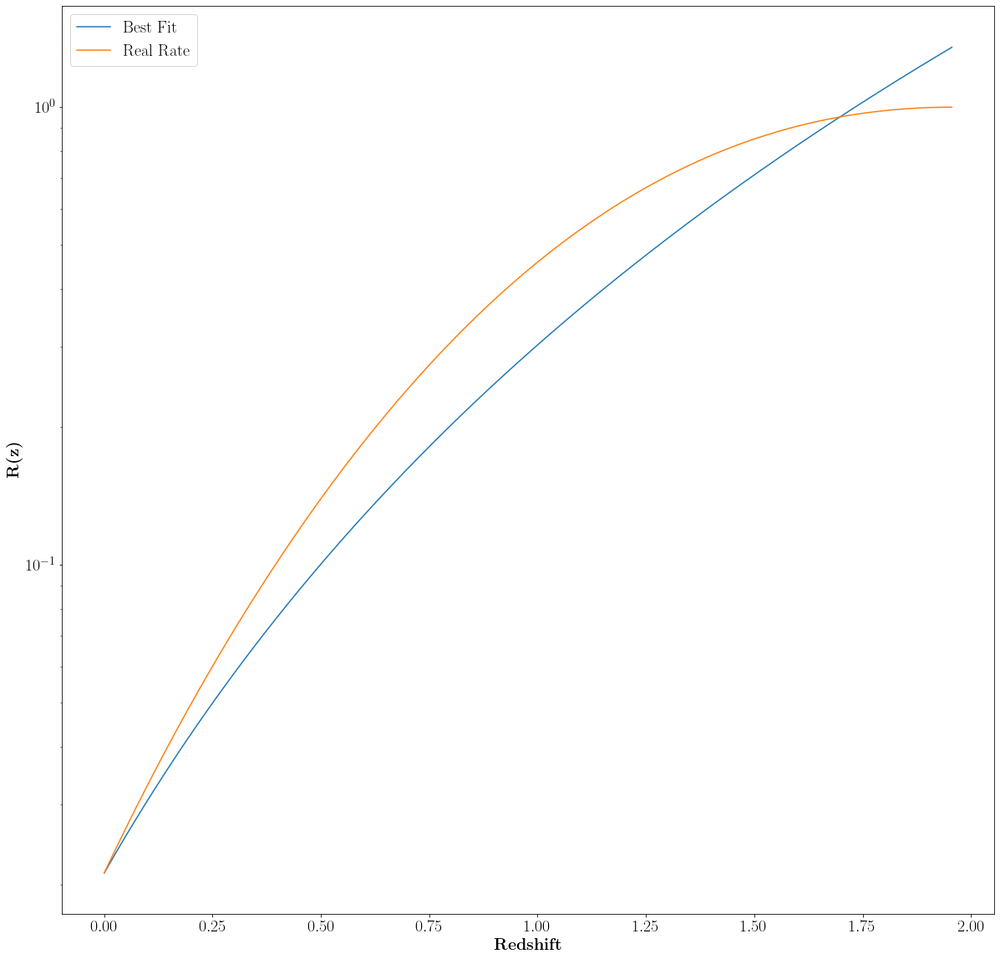

In [225]:
fig, ax = plt.subplots(1, figsize=(20,20))
ax.set_yscale('log')

max_index = np.argmax(total_formation_rate)

# fit2 = curve_fit(lambda z, kappa: power_law(z, kappa, R0), x, y) 
bound_redshifts = redshifts[:max_index]
bound_frate = total_formation_rate[:max_index]/total_formation_rate[max_index]
R0 = bound_frate[0]

params_est, pcov = curve_fit(lambda bound_redshifts, kappa: power_law(bound_redshifts, kappa, R0), bound_redshifts, bound_frate)

kappa_est = params_est[0]
print(kappa_est)
# alpha_est = params_est[1]

# rate_est = alpha_est*(1+redshifts[:max_index])**kappa_est 

sigma = np.sqrt(np.diagonal(pcov))
print(sigma)

ax.plot(bound_redshifts, power_law(bound_redshifts, kappa_est, R0), label='Best Fit')
ax.plot(bound_redshifts, bound_frate, label='Real Rate')

plt.xlabel(r'\textbf{Redshift}', fontsize=20)
plt.ylabel(r'\textbf{R(z)}', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

# Get Rates and Pickle!

## a) BNS

In [59]:
def pickle_results(condensed_paths, alpha_vals, beta_vals, dco_type, weight_column=None,
                merges_hubble_time=True, pessimistic_CEE=True, no_RLOF_after_CEE=True,
                max_redshift=10.0, max_redshift_detection=1.0, redshift_step=0.001, z_first_SF = 10,
                use_sampled_mass_ranges=True, m1_min=5 * u.Msun, m1_max=150 * u.Msun, m2_min=0.1 * u.Msun, fbin=1.0,
                aSF = 0.01, bSF = 2.77, cSF = 2.90, dSF = 4.70,
                mu0=0.035, muz=-0.23, sigma0=0.39,sigmaz=0., alpha=0.0, 
                min_logZ=-12.0, max_logZ=1.0, step_logZ=0.01,
                sensitivity="O1", snr_threshold=8, 
                Mc_max=300.0, Mc_step=0.1, eta_max=0.25, eta_step=0.01,
                snr_max=1000.0, snr_step=0.1, lw=2, 
                lognormal=False, Zprescription='MZ_GSMF', SFRprescription='Madau et al. (2017)',        # ADAM'S FIDUCIAL MSSFR PARAMETERS
                GSMFprescription='Panter et al. (2004) Single', ZMprescription='Ma et al. (2016)',      # ADAM'S FIDUCIAL MSSFR PARAMETERS
                logNormalPrescription=None, n_iters=5, num_free_cpus=2):


    # Iterate through all alpha and beta values and write the results of each pair to a file
    for alpha_val in alpha_vals:
        for beta_val in beta_vals:
            
            # Make a folder to put the data into
            dco_type_folder = '/Users/adamboesky/Research/PRISE/exploring_parameter_space/Data_Analysis/Pickled_Rates/MSSSFR_111/' + dco_type

            if not os.path.exists(dco_type_folder):
                os.mkdir(dco_type_folder)

            # Put that data into it
            pickle_rates_and_boostraps(condensed_paths[alpha_val][beta_val], dco_type_folder + '/alpha_CE_' + alpha_val + '_beta_' + beta_val + '.pkl', 
            dco_type='BNS', merger_output_filename=None, weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,              # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                               # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription, n_iters=n_iters, num_free_cpus=num_free_cpus)      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS

pickle_results(condensed_paths, alpha_vals, beta_vals, dco_type='BNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription, n_iters=100, num_free_cpus=2)

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79029591.90179735 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                  

## b) BHNS

In [60]:
pickle_results(condensed_paths, alpha_vals, beta_vals, dco_type='BHNS', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription, n_iters=100, num_free_cpus=2)

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
Average_SF_mass_needed =  79078175.24431244 solMass
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
ClassMSSFR: Remember to set self.SFRprescription() + subparts
                  

## c) BBH

In [ ]:
pickle_results(condensed_paths, alpha_vals, beta_vals, dco_type='BBH', weight_column=weight_column,
            merges_hubble_time=merges_hubble_time, pessimistic_CEE=pessimistic_CEE,
            no_RLOF_after_CEE=no_RLOF_after_CEE, max_redshift=max_redshift,
            max_redshift_detection=max_redshift_detection,
            redshift_step=redshift_step, z_first_SF=z_first_SF,
            m1_min=m1_min, m1_max=m1_max, m2_min=m2_min,
            fbin=fbin, aSF=aSF, bSF=bSF, cSF=cSF, dSF=dSF,
            mu0=mu0, muz=muz, sigma0=sigma0, alpha=alpha,
            min_logZ=min_logZ, max_logZ=max_logZ, step_logZ=step_logZ,
            sensitivity=sensitivity, snr_threshold=snr_threshold,
            Mc_max=Mc_max, Mc_step=Mc_step,
            eta_max=eta_max, eta_step=eta_step,
            snr_max=snr_max, snr_step=snr_step, 
            lognormal=lognormal, Zprescription=Zprescription, SFRprescription=SFRprescription,      # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            GSMFprescription=GSMFprescription, ZMprescription=ZMprescription,                       # ADAM'S NON-LOGNORMAL MSSFR PRESCRIPTIONS
            logNormalPrescription=logNormalPrescription, n_iters=100, num_free_cpus=2)

In [9]:
def get_rate_CIs(bootstraps):
    # Dictionaries to have the confidence intervals in
    one_sigma = {}
    two_sigma = {}

    # Get the one sigma confidence intervals
    one_sigma['total_formation_rates']          =   np.percentile(bootstraps['total_formation_rates'], [16, 84], axis=0)
    one_sigma['total_merger_rates']             =   np.percentile(bootstraps['total_merger_rates'], [16, 84], axis=0)
    one_sigma['cumulative_detection_rates']     =   np.percentile(bootstraps['cumulative_detection_rates'], [16, 84], axis=0)
    one_sigma['mass_kde']                       =   np.percentile(bootstraps['mass_kde'], [16, 84], axis=0)

    # Get the two sigma confidence intervals
    two_sigma['total_formation_rates']          =   np.percentile(bootstraps['total_formation_rates'], [2.5, 97.5], axis=0)
    two_sigma['total_merger_rates']             =   np.percentile(bootstraps['total_merger_rates'], [2.5, 97.5], axis=0)
    two_sigma['cumulative_detection_rates']     =   np.percentile(bootstraps['cumulative_detection_rates'], [2.5, 97.5], axis=0)
    two_sigma['mass_kde']                       =   np.percentile(bootstraps['mass_kde'], [2.5, 97.5], axis=0)

    return one_sigma, two_sigma

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
                            set self.calculateMetallicityBinEdges()


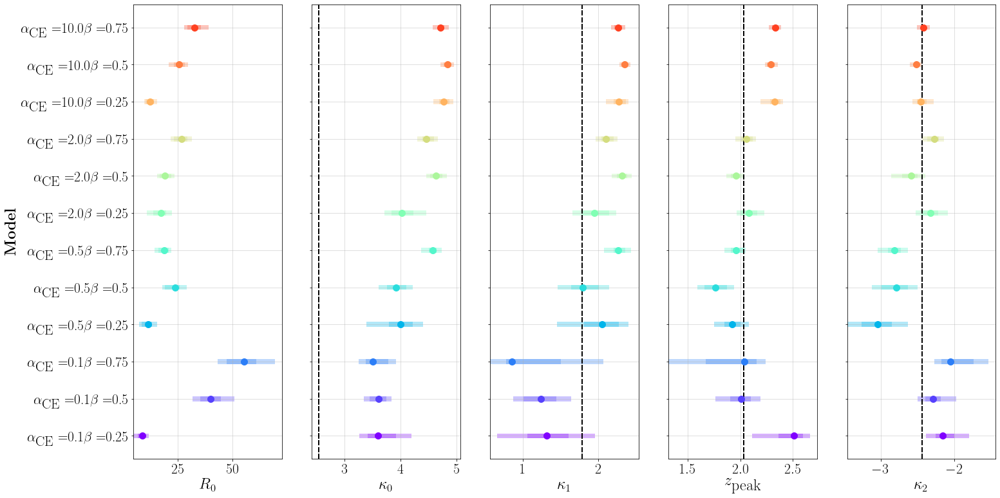

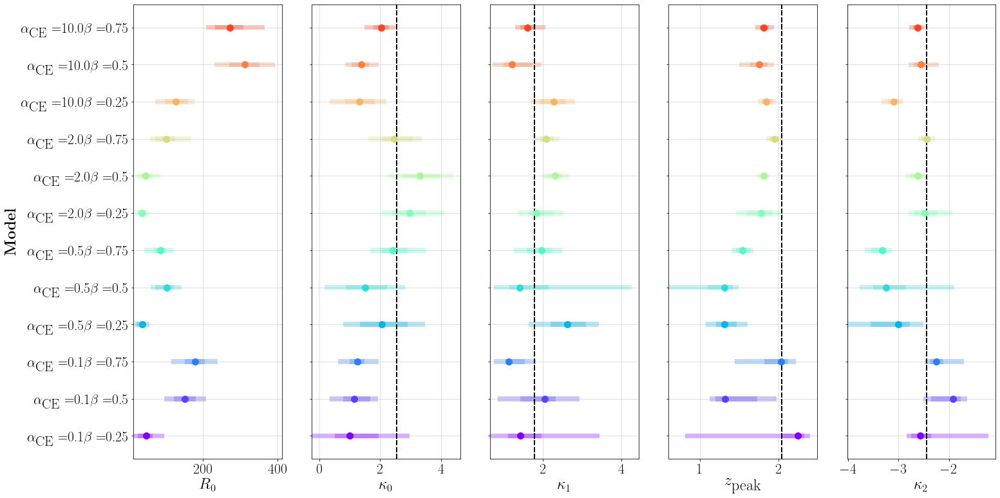

In [61]:
def plot_rates_kappa_and_peaks(alpha_vals, beta_vals, color_grid, dco_type=None, lw=3, fs=24):
        
        assert dco_type != None, 'dco_type must be given'

        # Dictionaries to retrieve the data:
        total_formation_rates = {}
        total_merger_rates = {}
        one_sigma = {}
        two_sigma = {}
        formation_rate_kappa0 = {}
        formation_rate_kappa1 = {}
        formation_rate_kappa2 = {}
        merger_rate_kappa0 = {}
        merger_rate_kappa1 = {}
        merger_rate_kappa2 = {}
        formation_rate_peak_zs = {}
        merger_rate_peak_zs = {}
        redshifts = {}
        intrinsic_formation_rate = {}
        intrinsic_merger_rate = {}

        ######################################################################
        # Retrieve the data
        index = 0
        for alpha_val in alpha_vals:
                # Make the dictionary "2D"
                total_formation_rates[alpha_val] = {}
                total_merger_rates[alpha_val] = {}
                one_sigma[alpha_val] = {}
                two_sigma[alpha_val] = {}
                formation_rate_kappa0[alpha_val] = {}
                formation_rate_kappa1[alpha_val] = {}
                formation_rate_kappa2[alpha_val] = {}
                merger_rate_kappa0[alpha_val] = {}
                merger_rate_kappa1[alpha_val] = {}
                merger_rate_kappa2[alpha_val] = {}
                formation_rate_peak_zs[alpha_val] = {}
                merger_rate_peak_zs[alpha_val] = {}
                redshifts[alpha_val] = {}         
                intrinsic_formation_rate[alpha_val] = {}
                intrinsic_merger_rate[alpha_val] = {}

                for beta_val in beta_vals:
                        one_sigma[alpha_val][beta_val] = {}
                        two_sigma[alpha_val][beta_val] = {}
                        with open('/Users/adamboesky/Research/PRISE/exploring_parameter_space/Data/Pickled_Rates/MSSSFR_111/' + dco_type + '/alpha_CE_' + alpha_val + '_beta_' + beta_val + '.pkl', 'rb') as f:
                                
                                # GET RATE KAPPAS, Z_PEAK, AND R0
                                # Get peaks
                                dict = pickle.load(f)
                                total_formation_rates[alpha_val][beta_val] = dict['total_formation_rates']
                                total_merger_rates[alpha_val][beta_val] = dict['total_merger_rates']
                                # redshifts[alpha_val][beta_val] = dict['redshfits']
                                redshifts[alpha_val][beta_val] = np.linspace(0, 10, num=len(dict['total_merger_rates']))

                                # Get the intrinsic rates
                                intrinsic_formation_rate[alpha_val][beta_val] = total_formation_rates[alpha_val][beta_val][0]
                                intrinsic_merger_rate[alpha_val][beta_val] = total_merger_rates[alpha_val][beta_val][0]

                                # Get kappas
                                # Formation rates
                                formation_rate_kappas, formation_rate_peak_z = dbl_get_kappa_and_peak(redshifts[alpha_val][beta_val],  total_formation_rates[alpha_val][beta_val]/max(total_formation_rates[alpha_val][beta_val]))
                                formation_rate_peak_zs[alpha_val][beta_val] = formation_rate_peak_z
                                formation_rate_kappa0[alpha_val][beta_val] = formation_rate_kappas[0]
                                formation_rate_kappa1[alpha_val][beta_val] = formation_rate_kappas[1]
                                formation_rate_kappa2[alpha_val][beta_val] = formation_rate_kappas[2]
                                # Merger rates
                                merger_rate_kappas, merger_rate_peak_z = dbl_get_kappa_and_peak(redshifts[alpha_val][beta_val],  total_merger_rates[alpha_val][beta_val]/max(total_merger_rates[alpha_val][beta_val]))
                                merger_rate_peak_zs[alpha_val][beta_val] = merger_rate_peak_z
                                merger_rate_kappa0[alpha_val][beta_val] = merger_rate_kappas[0]
                                merger_rate_kappa1[alpha_val][beta_val] = merger_rate_kappas[1]
                                merger_rate_kappa2[alpha_val][beta_val] = merger_rate_kappas[2]


                                # CONFIDENCE INTERVALS!
                                # Iterate through all the bootstrapped rates and calculate the kappa values for the rates
                                formation_rate_kappa0s = []
                                formation_rate_kappa1s = []
                                formation_rate_kappa2s = []
                                formation_rate_peaks = []
                                merger_rate_kappa0s = []
                                merger_rate_kappa1s = []
                                merger_rate_kappa2s = []
                                merger_rate_peaks = []
                                intrinsic_formation_rates = []
                                intrinsic_merger_rates = []
                                for rate_index in range(len(dict['bootstraps']['total_formation_rates'])):
                                        
                                        # Get the akppa for the current bootstrap iteration
                                        if np.argmax(dict['bootstraps']['total_formation_rates'][rate_index]) != 0 and np.argmax(dict['bootstraps']['total_merger_rates'][rate_index]) != 0: # We will not count the bootstrapped rate if the rate's max is at z=0
                                                # Get the kappas and peaks
                                                formation_rate_kappas_bs, formation_rate_peak = dbl_get_kappa_and_peak(redshifts[alpha_val][beta_val], dict['bootstraps']['total_formation_rates'][rate_index]/max(dict['bootstraps']['total_formation_rates'][rate_index]))
                                                merger_rate_kappas_bs, merger_rate_peak = dbl_get_kappa_and_peak(redshifts[alpha_val][beta_val], dict['bootstraps']['total_merger_rates'][rate_index]/max(dict['bootstraps']['total_merger_rates'][rate_index]))

                                                # Store the kappas
                                                formation_rate_kappa0s.append(formation_rate_kappas_bs[0])
                                                formation_rate_kappa1s.append(formation_rate_kappas_bs[1])
                                                formation_rate_kappa2s.append(formation_rate_kappas_bs[2])
                                                merger_rate_kappa0s.append(merger_rate_kappas_bs[0])
                                                merger_rate_kappa1s.append(merger_rate_kappas_bs[1])
                                                merger_rate_kappa2s.append(merger_rate_kappas_bs[2])

                                                # Store the peaks
                                                formation_rate_peaks.append(formation_rate_peak)
                                                merger_rate_peaks.append(merger_rate_peak)

                                                # Get the intrinsic rates
                                                intrinsic_formation_rates.append(dict['bootstraps']['total_formation_rates'][rate_index][0])
                                                intrinsic_merger_rates.append(dict['bootstraps']['total_merger_rates'][rate_index][0])


                                # Get and store the confidence intervals for the kappas
                                # Formation rates
                                one_sigma[alpha_val][beta_val]['formation_rate_kappa0']         = np.percentile(formation_rate_kappa0s, [16, 84])
                                one_sigma[alpha_val][beta_val]['formation_rate_kappa1']         = np.percentile(formation_rate_kappa1s, [16, 84])
                                one_sigma[alpha_val][beta_val]['formation_rate_kappa2']         = np.percentile(formation_rate_kappa2s, [16, 84])
                                one_sigma[alpha_val][beta_val]['formation_rate_peak_z']         = np.percentile(formation_rate_peaks, [16, 84])
                                one_sigma[alpha_val][beta_val]['intrinsic_formation_rate']      = np.percentile(intrinsic_formation_rates, [16, 84])
                                two_sigma[alpha_val][beta_val]['formation_rate_kappa0']         = np.percentile(formation_rate_kappa0s, [2.5, 97.5])
                                two_sigma[alpha_val][beta_val]['formation_rate_kappa1']         = np.percentile(formation_rate_kappa1s, [2.5, 97.5])
                                two_sigma[alpha_val][beta_val]['formation_rate_kappa2']         = np.percentile(formation_rate_kappa2s, [2.5, 97.5])
                                two_sigma[alpha_val][beta_val]['formation_rate_peak_z']         = np.percentile(formation_rate_peaks, [2.5, 97.5])
                                two_sigma[alpha_val][beta_val]['intrinsic_formation_rate']      = np.percentile(intrinsic_formation_rates, [2.5, 97.5])
                                # Merger rates
                                one_sigma[alpha_val][beta_val]['merger_rate_kappa0']            = np.percentile(merger_rate_kappa0s, [16, 84])
                                one_sigma[alpha_val][beta_val]['merger_rate_kappa1']            = np.percentile(merger_rate_kappa1s, [16, 84])
                                one_sigma[alpha_val][beta_val]['merger_rate_kappa2']            = np.percentile(merger_rate_kappa2s, [16, 84])
                                one_sigma[alpha_val][beta_val]['merger_rate_peak_z']            = np.percentile(merger_rate_peaks, [16, 84])
                                one_sigma[alpha_val][beta_val]['intrinsic_merger_rate']         = np.percentile(intrinsic_merger_rates, [16, 84])
                                two_sigma[alpha_val][beta_val]['merger_rate_kappa0']            = np.percentile(merger_rate_kappa0s, [2.5, 97.5])
                                two_sigma[alpha_val][beta_val]['merger_rate_kappa1']            = np.percentile(merger_rate_kappa1s, [2.5, 97.5])
                                two_sigma[alpha_val][beta_val]['merger_rate_kappa2']            = np.percentile(merger_rate_kappa2s, [2.5, 97.5])
                                two_sigma[alpha_val][beta_val]['merger_rate_peak_z']            = np.percentile(merger_rate_peaks, [2.5, 97.5])
                                two_sigma[alpha_val][beta_val]['intrinsic_merger_rate']         = np.percentile(intrinsic_merger_rates, [2.5, 97.5])


                                        
        ######################################################################
        # Plot the formation rate kappas and z_peak
        formation_fig, formation_axes = plt.subplots(1, 5, figsize=(24, 13))

        # Make grid in background
        formation_axes[0].grid(alpha=0.5, zorder=-1)
        formation_axes[1].grid(alpha=0.5, zorder=-1)
        formation_axes[2].grid(alpha=0.5, zorder=-1)
        formation_axes[3].grid(alpha=0.5, zorder=-1)
        formation_axes[4].grid(alpha=0.5, zorder=-1)

        # Retreive the SFR
        MSSFR = ClassMSSFR.MSSFR()                                                      # Create an MSSFR object
        MSSFR.SFRprescription = SFRprescription                                         # Set SFR prescription
        ages = MSSFR.cosmology.age(redshifts[alpha_val][beta_val]).value                # Get the ages
        sfr = MSSFR.returnSFR(redshifts[alpha_val][beta_val], ages)                     # Get the SFR

        sfr_kappas, sfr_peak_redshift = dbl_get_kappa_and_peak(redshifts[alpha_val][beta_val], sfr/max(sfr))
        intrinsic_sfr = sfr[0]
        sfr_kappa0 = sfr_kappas[0]
        sfr_kappa1 = sfr_kappas[1]
        sfr_kappa2 = sfr_kappas[2]


        index = 0
        dy = 0.8
        dylen = (2*dy)/(len(alpha_vals)*len(beta_vals))
        labels = []
        label_indexs = []
        for alpha_val in alpha_vals:
                for beta_val in beta_vals:

                        # Plot the intrinsic rate
                        formation_axes[0].scatter(x=intrinsic_formation_rate[alpha_val][beta_val], y=index, s=100, color=color_grid[alpha_val][beta_val], alpha=1, zorder=100)                                             # Point at estimated value
                        width = one_sigma[alpha_val][beta_val]['intrinsic_formation_rate'][1] - one_sigma[alpha_val][beta_val]['intrinsic_formation_rate'][0]                                                                 # Get the width of the 1sigma error bar
                        formation_axes[0].barh(index, width=width, left=one_sigma[alpha_val][beta_val]['intrinsic_formation_rate'][0], color=color_grid[alpha_val][beta_val], alpha=0.3, height=dylen, zorder=-1)          # 1sigma error bar
                        width = two_sigma[alpha_val][beta_val]['intrinsic_formation_rate'][1] - two_sigma[alpha_val][beta_val]['intrinsic_formation_rate'][0]                                                                 # Get the width of the 2sigma error bar
                        formation_axes[0].barh(index, width=width, left=two_sigma[alpha_val][beta_val]['intrinsic_formation_rate'][0], color=color_grid[alpha_val][beta_val], alpha=0.3, height=dylen, zorder=-1)          # 2sigma error bar
                        # formation_axes[4].axvline(x=intrinsic_sfr, linestyle='--', color='black', lw=lw, zorder=10)                                                                                                        # Plot kappa0 for the sfr

                        # Plot Kappa0
                        formation_axes[1].scatter(x=formation_rate_kappa0[alpha_val][beta_val], y=index, s=100, color=color_grid[alpha_val][beta_val], alpha=1, zorder=100)                                             # Point at estimated value
                        width = one_sigma[alpha_val][beta_val]['formation_rate_kappa0'][1] - one_sigma[alpha_val][beta_val]['formation_rate_kappa0'][0]                                                                 # Get the width of the 1sigma error bar
                        formation_axes[1].barh(index, width=width, left=one_sigma[alpha_val][beta_val]['formation_rate_kappa0'][0], color=color_grid[alpha_val][beta_val], alpha=0.3, height=dylen, zorder=-1)          # 1sigma error bar
                        width = two_sigma[alpha_val][beta_val]['formation_rate_kappa0'][1] - two_sigma[alpha_val][beta_val]['formation_rate_kappa0'][0]                                                                 # Get the width of the 2sigma error bar
                        formation_axes[1].barh(index, width=width, left=two_sigma[alpha_val][beta_val]['formation_rate_kappa0'][0], color=color_grid[alpha_val][beta_val], alpha=0.3, height=dylen, zorder=-1)          # 2sigma error bar
                        formation_axes[1].axvline(x=sfr_kappa0, linestyle='--', color='black', lw=lw, zorder=10)                                                                                                        # Plot kappa0 for the sfr

                        # Plot Kappa1
                        formation_axes[2].scatter(x=formation_rate_kappa1[alpha_val][beta_val], y=index, s=100, color=color_grid[alpha_val][beta_val], alpha=1, zorder=100)                                             # Point at estimated value
                        width = one_sigma[alpha_val][beta_val]['formation_rate_kappa1'][1] - one_sigma[alpha_val][beta_val]['formation_rate_kappa1'][0]                                                                 # Get the width of the 1sigma error bar
                        formation_axes[2].barh(index, width=width, left=one_sigma[alpha_val][beta_val]['formation_rate_kappa1'][0], color=color_grid[alpha_val][beta_val], alpha=0.3, height=dylen, zorder=-1)          # 1sigma error bar
                        width = two_sigma[alpha_val][beta_val]['formation_rate_kappa1'][1] - two_sigma[alpha_val][beta_val]['formation_rate_kappa1'][0]                                                                 # Get the width of the 2sigma error bar
                        formation_axes[2].barh(index, width=width, left=two_sigma[alpha_val][beta_val]['formation_rate_kappa1'][0], color=color_grid[alpha_val][beta_val], alpha=0.3, height=dylen, zorder=-1)          # 2sigma error bar
                        formation_axes[2].axvline(x=sfr_kappa1, linestyle='--', color='black', lw=lw, zorder=10)                                                                                                        # Plot kappa1 for the sfr

                        # Plot z_max
                        formation_axes[3].scatter(x=formation_rate_peak_zs[alpha_val][beta_val], y=index, s=100, color=color_grid[alpha_val][beta_val], alpha=1, zorder=100)                                            # Point at estimated value
                        width = one_sigma[alpha_val][beta_val]['formation_rate_peak_z'][1] - one_sigma[alpha_val][beta_val]['formation_rate_peak_z'][0]                                                                 # Get the width of the 1sigma error bar
                        formation_axes[3].barh(index, width=width, left=one_sigma[alpha_val][beta_val]['formation_rate_peak_z'][0], color=color_grid[alpha_val][beta_val], alpha=0.3, height=dylen, zorder=-1)          # 1sigma error bar
                        width = two_sigma[alpha_val][beta_val]['formation_rate_peak_z'][1] - two_sigma[alpha_val][beta_val]['formation_rate_peak_z'][0]                                                                 # Get the width of the 2sigma error bar
                        formation_axes[3].barh(index, width=width, left=two_sigma[alpha_val][beta_val]['formation_rate_peak_z'][0], color=color_grid[alpha_val][beta_val], alpha=0.3, height=dylen, zorder=-1)          # 2sigma error bar
                        formation_axes[3].axvline(x=sfr_peak_redshift, linestyle='--', color='black', lw=lw, zorder=10)                                                                                                 # Plot z_peak for the sfr

                        # Plot Kappa2
                        formation_axes[4].scatter(x=formation_rate_kappa2[alpha_val][beta_val], y=index, s=100, color=color_grid[alpha_val][beta_val], alpha=1, zorder=100)                                             # Point at estimated value
                        width = one_sigma[alpha_val][beta_val]['formation_rate_kappa2'][1] - one_sigma[alpha_val][beta_val]['formation_rate_kappa2'][0]                                                                 # Get the width of the 1sigma error bar
                        formation_axes[4].barh(index, width=width, left=one_sigma[alpha_val][beta_val]['formation_rate_kappa2'][0], color=color_grid[alpha_val][beta_val], alpha=0.3, height=dylen, zorder=-1)          # 1sigma error bar
                        width = two_sigma[alpha_val][beta_val]['formation_rate_kappa2'][1] - two_sigma[alpha_val][beta_val]['formation_rate_kappa2'][0]                                                                 # Get the width of the 2sigma error bar
                        formation_axes[4].barh(index, width=width, left=two_sigma[alpha_val][beta_val]['formation_rate_kappa2'][0], color=color_grid[alpha_val][beta_val], alpha=0.3, height=dylen, zorder=-1)          # 2sigma error bar
                        formation_axes[4].axvline(x=sfr_kappa2, linestyle='--', color='black', lw=lw, zorder=10)                                                                                                        # Plot kappa2 for the sfr

                        # Add model values to the labels list
                        labels.append(r'$\alpha_{\textrm{CE}} = $' + alpha_val + r'$\beta = $' + beta_val)
                        label_indexs.append(index)

                        index+=1

        # Label axes of all the plots
        formation_axes[0].set_xlabel(r'$R_0$', fontsize=fs)
        formation_axes[1].set_xlabel(r'$\kappa_0$', fontsize=fs)
        formation_axes[0].set_ylabel(r'\textbf{Model}', fontsize=fs)
        formation_axes[2].set_xlabel(r'$\kappa_1$', fontsize=fs)
        formation_axes[3].set_xlabel(r'$z_\textrm{peak}$', fontsize=fs)
        formation_axes[4].set_xlabel(r'$\kappa_2$', fontsize=fs)

        for ax_index, ax in enumerate(formation_axes.flatten()):
                ax.tick_params(labelsize=0.9*fs)
                ax.set_yticks(label_indexs)
                if ax_index == 0:       
                        ax.set_yticklabels(labels)
                else:
                        ax.set_yticklabels(['' for i in range(len(labels))])

        # Save and show the plot!
        plt.savefig('/Users/adamboesky/Research/PRISE/exploring_parameter_space/Data_Analysis/Figures/Rates_Kappas_and_Peaks/'+ dco_type + '_Formation_Kappas_and_Peak.png')
        plt.show()



        ######################################################################
        # Plot the merger rate kappas and z_peak
        merger_fig, merger_axes = plt.subplots(1, 5, figsize=(24, 13))

        # Make grid in background
        merger_axes[0].grid(alpha=0.5, zorder=-1)
        merger_axes[1].grid(alpha=0.5, zorder=-1)
        merger_axes[2].grid(alpha=0.5, zorder=-1)
        merger_axes[3].grid(alpha=0.5, zorder=-1)
        merger_axes[4].grid(alpha=0.5, zorder=-1)

        index = 0
        labels = []
        label_indexs = []
        for alpha_val in alpha_vals:
                for beta_val in beta_vals:

                        # Plot the intrinsic rate
                        merger_axes[0].scatter(x=intrinsic_merger_rate[alpha_val][beta_val], y=index, s=100, color=color_grid[alpha_val][beta_val], alpha=1, zorder=100)                                             # Point at estimated value
                        width = one_sigma[alpha_val][beta_val]['intrinsic_merger_rate'][1] - one_sigma[alpha_val][beta_val]['intrinsic_merger_rate'][0]                                                                 # Get the width of the 1sigma error bar
                        merger_axes[0].barh(index, width=width, left=one_sigma[alpha_val][beta_val]['intrinsic_merger_rate'][0], color=color_grid[alpha_val][beta_val], alpha=0.3, height=dylen, zorder=-1)          # 1sigma error bar
                        width = two_sigma[alpha_val][beta_val]['intrinsic_merger_rate'][1] - two_sigma[alpha_val][beta_val]['intrinsic_merger_rate'][0]                                                                 # Get the width of the 2sigma error bar
                        merger_axes[0].barh(index, width=width, left=two_sigma[alpha_val][beta_val]['intrinsic_merger_rate'][0], color=color_grid[alpha_val][beta_val], alpha=0.3, height=dylen, zorder=-1)          # 2sigma error bar

                        # Plot Kappa0
                        merger_axes[1].scatter(x=merger_rate_kappa0[alpha_val][beta_val], y=index, s=100, color=color_grid[alpha_val][beta_val], alpha=1, zorder=100)                                                   # Point at estimated value
                        width = one_sigma[alpha_val][beta_val]['merger_rate_kappa0'][1] - one_sigma[alpha_val][beta_val]['merger_rate_kappa0'][0]                                                                       # Get the width of the 1sigma error bar
                        merger_axes[1].barh(index, width=width, left=one_sigma[alpha_val][beta_val]['merger_rate_kappa0'][0], color=color_grid[alpha_val][beta_val], alpha=0.3, height=dylen, zorder=-1)                # 1sigma error bar
                        width = two_sigma[alpha_val][beta_val]['merger_rate_kappa0'][1] - two_sigma[alpha_val][beta_val]['merger_rate_kappa0'][0]                                                                       # Get the width of the 2sigma error bar
                        merger_axes[1].barh(index, width=width, left=two_sigma[alpha_val][beta_val]['merger_rate_kappa0'][0], color=color_grid[alpha_val][beta_val], alpha=0.3, height=dylen, zorder=-1)                # 2sigma error bar
                        merger_axes[1].axvline(x=sfr_kappa0, linestyle='--', color='black', lw=lw, zorder=10)                                                                                                           # Plot kappa0 for the sfr

                        # Plot Kappa1
                        merger_axes[2].scatter(x=merger_rate_kappa1[alpha_val][beta_val], y=index, s=100, color=color_grid[alpha_val][beta_val], alpha=1, zorder=100)                                                   # Point at estimated value
                        width = one_sigma[alpha_val][beta_val]['merger_rate_kappa1'][1] - one_sigma[alpha_val][beta_val]['merger_rate_kappa1'][0]                                                                       # Get the width of the 1sigma error bar
                        merger_axes[2].barh(index, width=width, left=one_sigma[alpha_val][beta_val]['merger_rate_kappa1'][0], color=color_grid[alpha_val][beta_val], alpha=0.3, height=dylen, zorder=-1)                # 1sigma error bar
                        width = two_sigma[alpha_val][beta_val]['merger_rate_kappa1'][1] - two_sigma[alpha_val][beta_val]['merger_rate_kappa1'][0]                                                                       # Get the width of the 2sigma error bar
                        merger_axes[2].barh(index, width=width, left=two_sigma[alpha_val][beta_val]['merger_rate_kappa1'][0], color=color_grid[alpha_val][beta_val], alpha=0.3, height=dylen, zorder=-1)                # 2sigma error bar
                        merger_axes[2].axvline(x=sfr_kappa1, linestyle='--', color='black', lw=lw, zorder=10)                                                                                                           # Plot kappa1 for the sfr

                        # Plot z_max
                        merger_axes[3].scatter(x=merger_rate_peak_zs[alpha_val][beta_val], y=index, s=100, color=color_grid[alpha_val][beta_val], alpha=1, zorder=100)                                                  # Point at estimated value
                        width = one_sigma[alpha_val][beta_val]['merger_rate_peak_z'][1] - one_sigma[alpha_val][beta_val]['merger_rate_peak_z'][0]                                                                       # Get the width of the 1sigma error bar
                        merger_axes[3].barh(index, width=width, left=one_sigma[alpha_val][beta_val]['merger_rate_peak_z'][0], color=color_grid[alpha_val][beta_val], alpha=0.3, height=dylen, zorder=-1)                # 1sigma error bar
                        width = two_sigma[alpha_val][beta_val]['merger_rate_peak_z'][1] - two_sigma[alpha_val][beta_val]['merger_rate_peak_z'][0]                                                                       # Get the width of the 2sigma error bar
                        merger_axes[3].barh(index, width=width, left=two_sigma[alpha_val][beta_val]['merger_rate_peak_z'][0], color=color_grid[alpha_val][beta_val], alpha=0.3, height=dylen, zorder=-1)                # 2sigma error bar
                        merger_axes[3].axvline(x=sfr_peak_redshift, linestyle='--', color='black', lw=lw, zorder=10)                                                                                                    # Plot kappa0 for the sfr

                        # Plot Kappa2
                        merger_axes[4].scatter(x=merger_rate_kappa2[alpha_val][beta_val], y=index, s=100, color=color_grid[alpha_val][beta_val], alpha=1, zorder=100)                                                   # Point at estimated value
                        width = one_sigma[alpha_val][beta_val]['merger_rate_kappa2'][1] - one_sigma[alpha_val][beta_val]['merger_rate_kappa2'][0]                                                                       # Get the width of the 1sigma error bar
                        merger_axes[4].barh(index, width=width, left=one_sigma[alpha_val][beta_val]['merger_rate_kappa2'][0], color=color_grid[alpha_val][beta_val], alpha=0.3, height=dylen, zorder=-1)                # 1sigma error bar
                        width = two_sigma[alpha_val][beta_val]['merger_rate_kappa2'][1] - two_sigma[alpha_val][beta_val]['merger_rate_kappa2'][0]                                                                       # Get the width of the 2sigma error bar
                        merger_axes[4].barh(index, width=width, left=two_sigma[alpha_val][beta_val]['merger_rate_kappa2'][0], color=color_grid[alpha_val][beta_val], alpha=0.3, height=dylen, zorder=-1)                # 2sigma error bar
                        merger_axes[4].axvline(x=sfr_kappa2, linestyle='--', color='black', lw=lw, zorder=10)                                                                                                           # Plot kappa0 for the sfr

                        # Add model values to the labels list
                        labels.append(r'$\alpha_{\textrm{CE}} = $' + alpha_val + r'$\beta = $' + beta_val)
                        label_indexs.append(index)

                        index+=1
        
        # Label axes of all the plots
        merger_axes[0].set_xlabel(r'$R_0$', fontsize=fs)
        merger_axes[1].set_xlabel(r'$\kappa_0$', fontsize=fs)
        merger_axes[0].set_ylabel(r'\textbf{Model}', fontsize=fs)
        merger_axes[2].set_xlabel(r'$\kappa_1$', fontsize=fs)
        merger_axes[3].set_xlabel(r'$z_\textrm{peak}$', fontsize=fs)
        merger_axes[4].set_xlabel(r'$\kappa_2$', fontsize=fs)

        for ax_index, ax in enumerate(merger_axes.flatten()):
                ax.tick_params(labelsize=0.9*fs)
                ax.set_yticks(label_indexs)
                if ax_index == 0:       
                        ax.set_yticklabels(labels)
                else:
                        ax.set_yticklabels(['' for i in range(len(labels))])
        
        # Save and show the plot!
        plt.savefig('/Users/adamboesky/Research/PRISE/exploring_parameter_space/Data_Analysis/Figures/Rates_Kappas_and_Peaks/'+ dco_type + '_Merger_Kappas_and_Peak.png')
        plt.show()


plot_rates_kappa_and_peaks(alpha_vals, beta_vals, color_grid=color_grid, dco_type='BNS', lw=2)

ClassMSSFR: Remember to set self.SFRprescription() + subparts
                            self.Zprescription()   +sub-parts
                            set self.calculateMetallicityBinEdges()


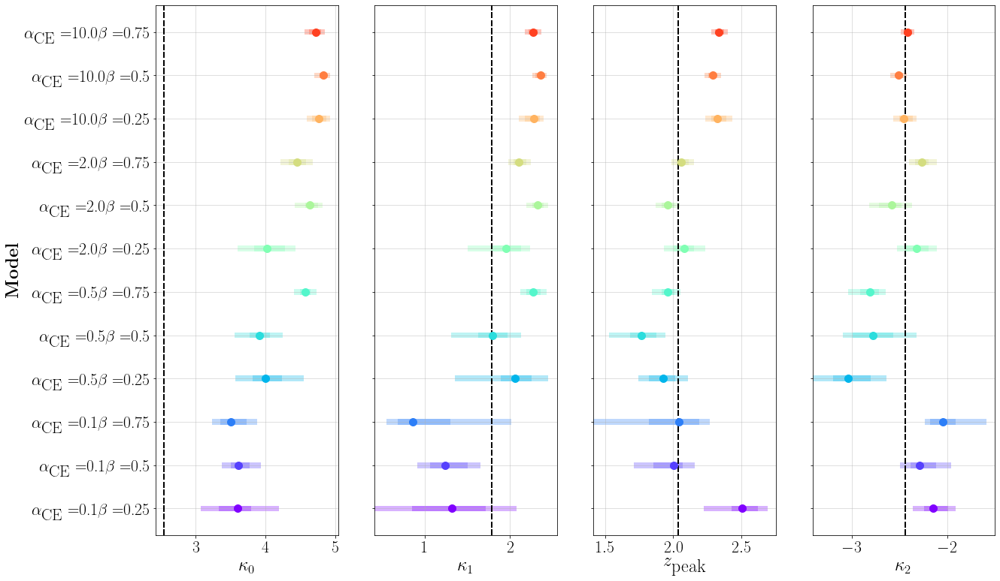

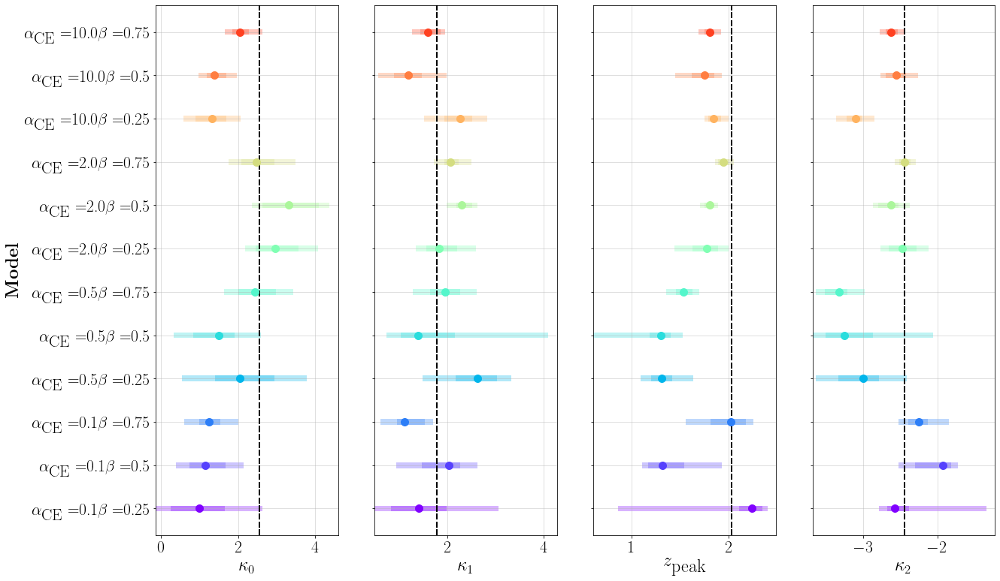

In [49]:
plot_rates_kappa_and_peaks(alpha_vals, beta_vals, color_grid=color_grid, dco_type='BHNS', lw=2)